<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/16.UCB_P%3D30_20_dim_user_case_BOGP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 30 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [3]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

 The latest version of GNU Octave built for all supported Ubuntu releases. GNU Octave is normally distributed with Ubuntu, this PPA is for you if you have a need to use a newer version of Octave than what you can already get from your installed version of Ubuntu.

Simply follow the instructions below to add this PPA to your system and install the octave package. If it's not that easy or you encounter any errors, contact the team and let us know.

Much credit goes to the Debian Octave Group who maintain the official Debian packages that this work is derived from. Without their efforts to bring Octave packaging to such a high level of quality in Debian and Debian derivatives, this PPA would not be here.
 More info: https://launchpad.net/~octave/+archive/ubuntu/stable
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:

In [4]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

--2021-10-28 04:35:38--  https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m [following]
--2021-10-28 04:35:38--  https://www.dropbox.com/s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc7c18c0227ea9bce5e7157591b1.dl.dropboxusercontent.com/cd/0/inline/BY2INO4k-bJFtOv2TJNTf0UwBAmZg3mEjnf-qxqLnIWFy-V_wjuBmGq_fZR5Rc8rjP1umLtLgxqBrErRcP9qV9m3gFsoeRh6Oks3fjzvVtsKIBbJ2FTAAuF57e0hSgGnyh8spIt-IdWjCeDSFQmlsQ-9/file# [following]
--2021-10-28 04:35:38--  https://uc7c18c0227ea9bce5e7157591b1.dl.dr

In [5]:
!wget https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
!wget https://www.dropbox.com/s/52gyqiq137mo2bb/SE.mat

302 Found
Location: https://ucd538981aa1bd72af3b19cf5dc9.dl.dropboxusercontent.com/cd/0/inline/BY1qEgI_9mb3sBgu8KsOwmAyKVh9C9b6NViJRLKmFnhv38scO81IudIqo8uct7JL9SK_rVw35-ToVBHkSwTe4ttiiLiHw8nO7BLtspa3UmzveC6NvFH7Pkv2EaR39lstYbwzOipSnBg6lzHzSKnJvj-6/file# [following]
--2021-10-28 04:35:44--  https://ucd538981aa1bd72af3b19cf5dc9.dl.dropboxusercontent.com/cd/0/inline/BY1qEgI_9mb3sBgu8KsOwmAyKVh9C9b6NViJRLKmFnhv38scO81IudIqo8uct7JL9SK_rVw35-ToVBHkSwTe4ttiiLiHw8nO7BLtspa3UmzveC6NvFH7Pkv2EaR39lstYbwzOipSnBg6lzHzSKnJvj-6/file
Resolving ucd538981aa1bd72af3b19cf5dc9.dl.dropboxusercontent.com (ucd538981aa1bd72af3b19cf5dc9.dl.dropboxusercontent.com)... 162.125.6.15, 2620:100:601c:15::a27d:60f
Connecting to ucd538981aa1bd72af3b19cf5dc9.dl.dropboxusercontent.com (ucd538981aa1bd72af3b19cf5dc9.dl.dropboxusercontent.com)|162.125.6.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6400200 (6.1M) [text/plain]
Saving to: ‘RR.mat’

RR.mat              100%[===================>]  

In [6]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [9]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [10]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [11]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  if iteration<180:
   beta = 5*np.exp(((-6-np.log(5))*iteration)/180)
  else:
   beta = 5*np.exp(((-6-np.log(5))*180)/180)
  
  for i in range(2):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [12]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [14]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_P=30_3.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_P=30_3.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_P=30_3.npy")

FileNotFoundError: ignored

x_next is [ 14.0105354    0.59221544   1.51485932  -0.62508599  29.57409691
  20.66786761 -19.77909836 -22.65058927 -26.74484524  22.24368219
 -16.19621415  24.45679456 -11.54030576 -24.11710641  15.0269887
   9.12184018 -26.68843179 -11.96188673 -17.34078992  14.90504604]
f()=0.000000, actual=32.491
0


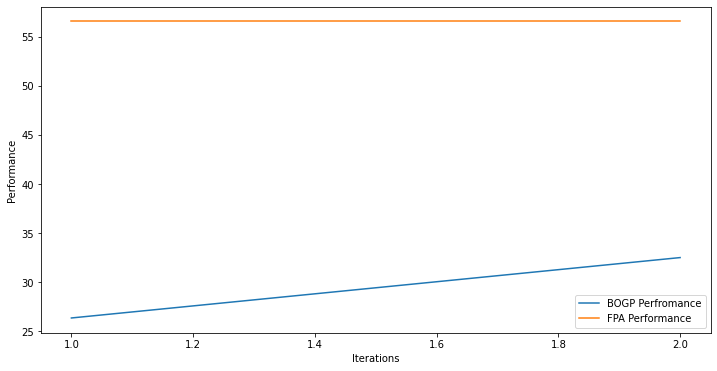

x_next is [-27.438506   -30.15755061 -30.86178195  27.77684846 -28.26478529
 -30.02439202  29.71483298  29.24730059  29.93262288 -29.24283973
  26.99600351 -28.48425263  28.95908116  29.74876758 -30.83106918
 -27.63042081  28.99071947  29.23814596  29.64059083 -27.83633537]
f()=29.088632, actual=36.158
1


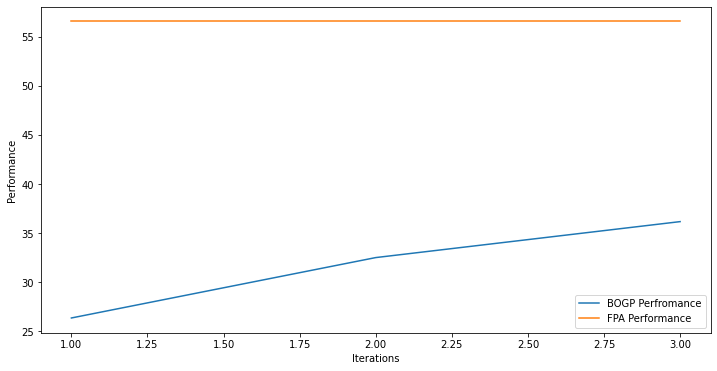

x_next is [ 14.39114746   8.73422928  17.90062014  27.44665944  16.83546937
  14.96798436 -28.34496091  15.35638211 -21.70732914 -12.6935444
  14.32863338   2.94737556  23.63911998 -16.67630678  -3.41314509
  -1.88717934  -6.60586578  15.85247657 -19.28164311   9.41283258]
f()=31.400473, actual=31.993
2


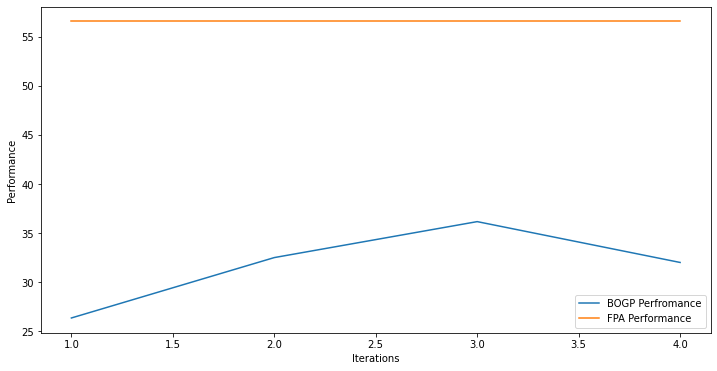

x_next is [ 22.24521568  -9.82755443  -7.24297864   6.93335829  -5.91997972
 -24.85927887  -0.12568885 -10.25238681  16.17808576  18.33466946
   3.41723514  15.39180881  23.61958623  -4.40776304  10.5266386
  -8.61476731 -12.27655183 -18.92804245   3.4211171    6.06905604]
f()=31.613674, actual=32.779
3


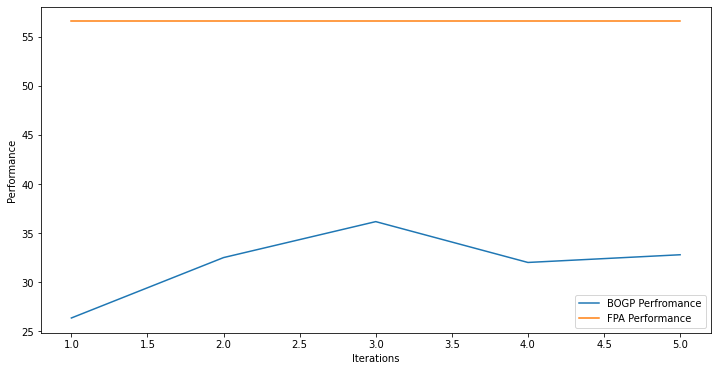

x_next is [-14.7463717  -20.50548266 -23.6225982   27.31455187  18.90669021
  -6.51672611  -1.15756297  -5.58339357 -24.64614615  18.15177959
 -25.29213652  18.48623498  28.17171453   3.82254972  28.50898524
   5.48060519 -18.78313102  10.9545902    3.70487595  -4.36854322]
f()=31.871908, actual=32.721
4


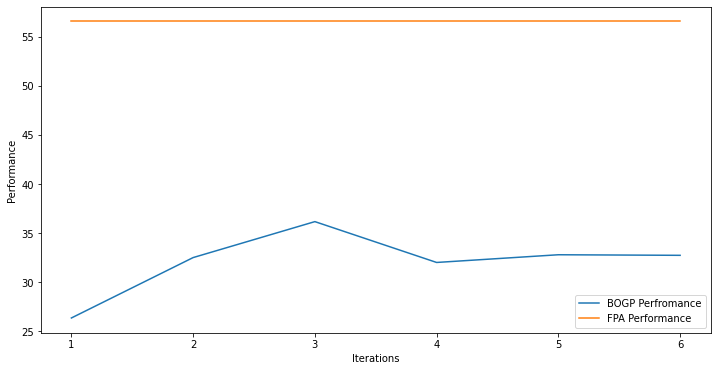

x_next is [ 24.53478782 -11.96872306   5.35151672   2.65791837 -13.7574294
  -0.23149872   8.37610071 -14.46556439   8.16762385 -14.11104288
  28.84653739  12.93877047 -18.84054625   4.18657884 -19.92369244
  16.97778523  -2.61508376  19.77189025   6.67649925  20.93906291]
f()=32.026211, actual=34.031
5


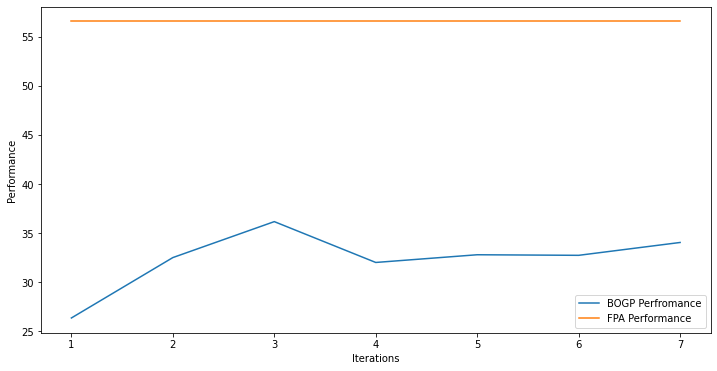

x_next is [-30.55252355  24.62956996   8.68217769  -2.60657192  16.98550405
  -6.31640014   2.08795389   2.39730974 -28.03335273  -5.38407766
  -3.17448651 -17.61291917  -0.78655182   2.10216065  20.73633289
   1.41735619 -23.92779442  11.12729402  14.08713885  16.99975475]
f()=32.318091, actual=34.793
6


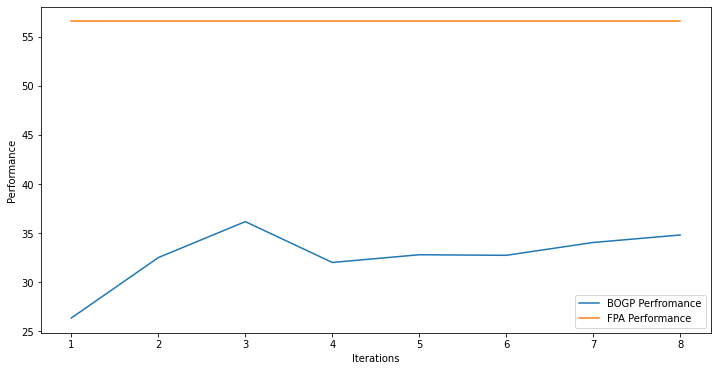

x_next is [-12.91630866 -21.13844754 -25.7021494  -10.1438174   -7.97777495
 -10.74689233 -13.00845455 -30.21477467  28.935834   -28.83238132
 -11.39323575  10.07940003 -11.10434907  -4.60134778 -22.36316822
   2.38297059  15.81238402   2.18099084   5.79369885  -8.76927767]
f()=32.629894, actual=23.482
7


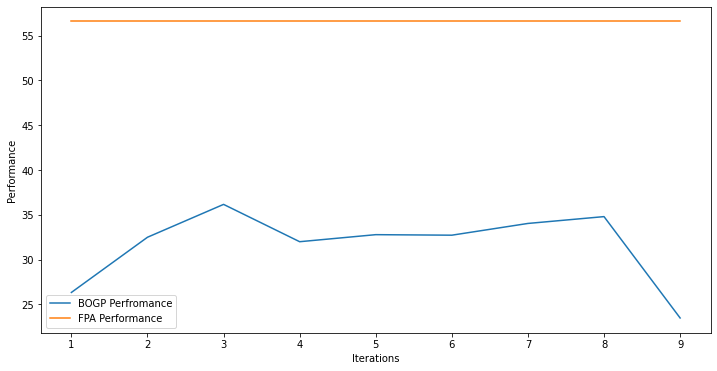

x_next is [ -2.49765045   0.48003226  17.95879831 -27.08225629  13.59804393
 -15.54114601  10.22903802  -5.83255027  -1.2707812   -0.5504424
 -16.17894515  -9.85582498  23.37974073   0.26763188  -9.06560974
  16.97295164  21.15328063 -12.51407995   0.48553154 -18.09753124]
f()=31.583371, actual=30.041
8


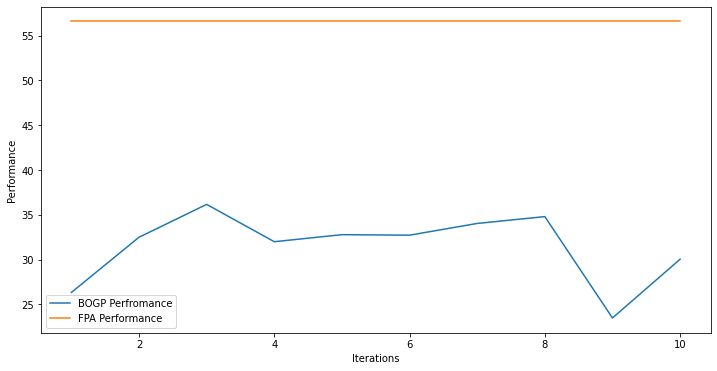

x_next is [-30.99962316  29.99985111  29.99969814  29.99968092 -30.99950452
 -30.99967909  29.99989635  29.999522   -30.99972743  29.99999478
  29.99996668 -30.9999215   29.99992994  29.99990979  29.99978188
 -30.99992644 -30.99992849  29.9999507   29.99994115  29.99996397]
f()=31.433964, actual=38.301
9


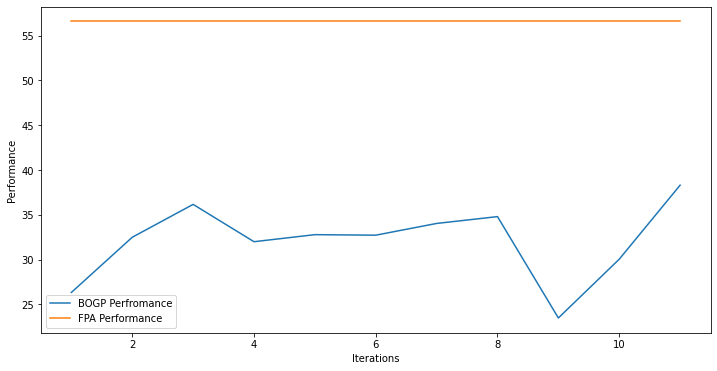

x_next is [ 30.  30. -31.  30. -31.  30.  30.  30. -31.  30.  30. -31.  30.  30.
  30. -31. -31.  30.  30.  30.]
f()=35.996253, actual=45.795
10


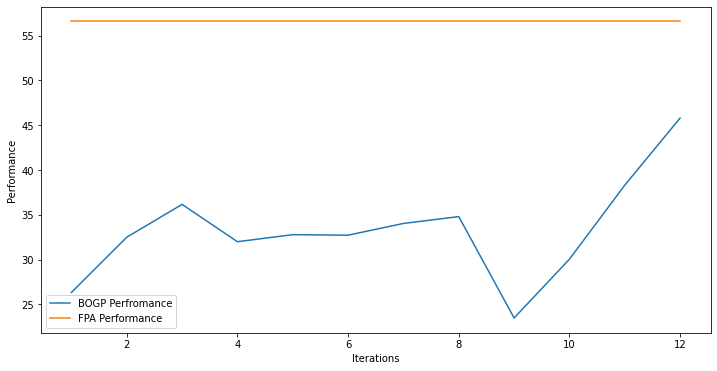

x_next is [ 30.  30. -31.  30.  30.  30.  30.  30. -31.  30.  30. -31.  30.  30.
 -31. -31. -31. -31.  30.  30.]
f()=40.097715, actual=46.119
11


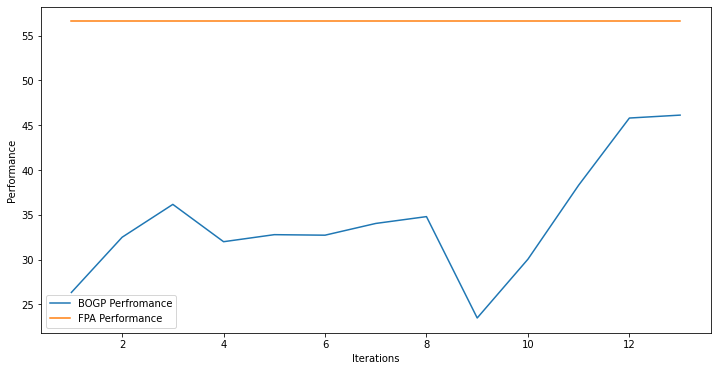

x_next is [ 30. -31. -31. -31.  30. -31.  30.  30. -31. -31.  30. -31.  30. -31.
  30.  30. -31.  30.  30.  30.]
f()=46.958053, actual=43.098
12


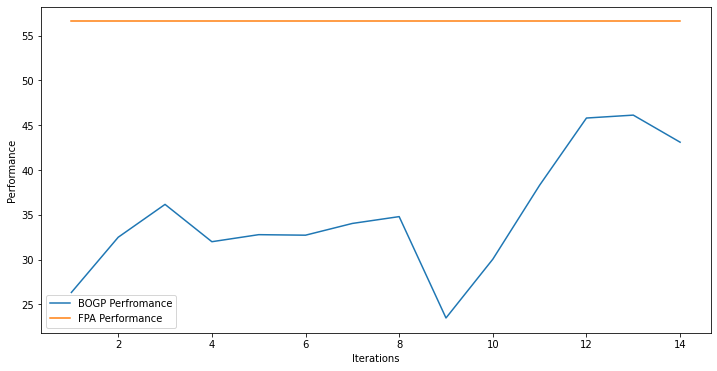

x_next is [ 30. -31. -31. -31.  30.  30.  30.  30. -31.  30.  30. -31.  30.  30.
 -31. -31. -31.  30.  30.  30.]
f()=44.431655, actual=46.167
13


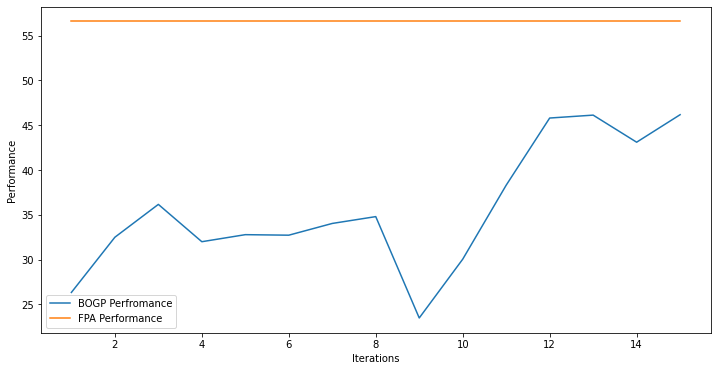

x_next is [-29.26063728   5.35102336 -12.95893329  10.73248173   1.30505902
   1.9056431    5.92648544   9.28284809 -27.44813698 -28.16618015
  21.80445728  12.31659904 -27.25511035 -27.1832646   -0.37044292
 -23.65171827  -3.96074027  14.83461251  10.90384003  19.13275675]
f()=35.527060, actual=27.969
14


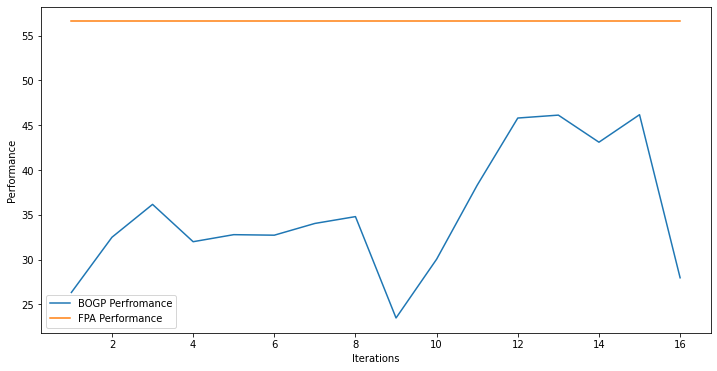

x_next is [ 30.  30. -31. -31.  30. -31.  30. -31. -31.  30.  30.  30.  30.  30.
 -31.  30. -31.  30.  30.  30.]
f()=48.043295, actual=45.794
15


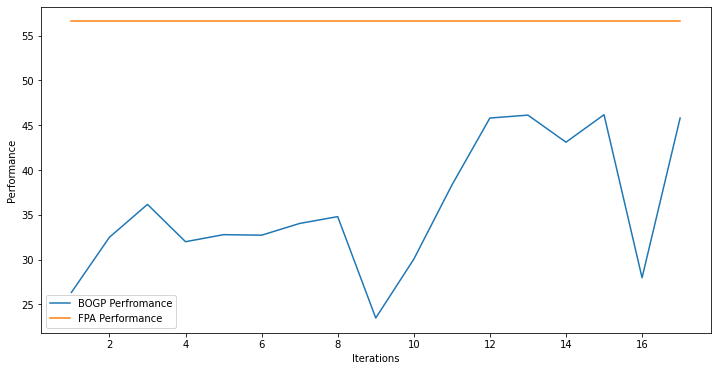

x_next is [ 30.  30. -31.  30.  30. -31.  30.  30. -31.  30.  30. -31.  30.  30.
 -31.  30. -31.  30.  30.  30.]
f()=47.713919, actual=49.092
16


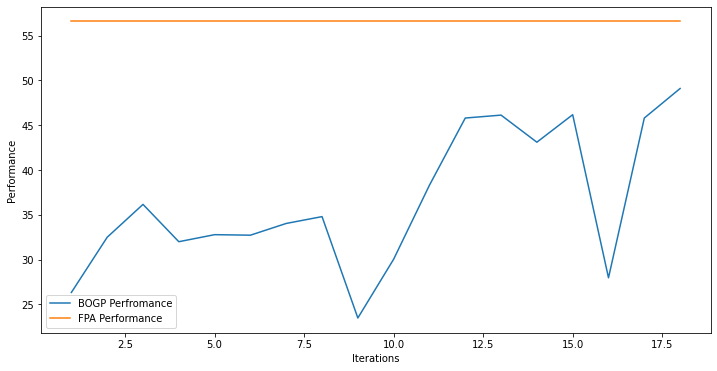

x_next is [ 30.  30. -31. -31.  30.  30.  30.  30. -31.  30.  30. -31.  30.  30.
  30.  30. -31.  30.  30. -31.]
f()=45.768617, actual=47.187
17


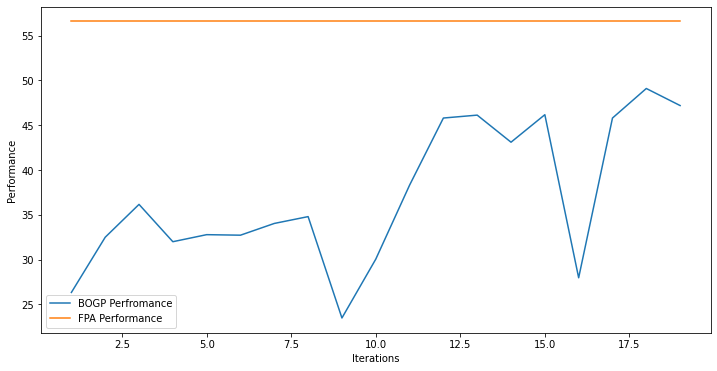

x_next is [ 30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30. -31.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=46.745712, actual=52.378
18


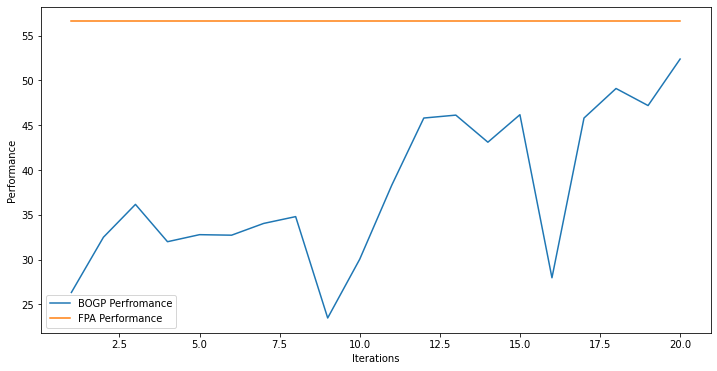

x_next is [ 29.99721643  29.99012591 -30.99196068  29.99441808  29.99657165
  29.99811775  29.99974571  29.99921617 -30.99913544  29.99110373
  29.9994205  -30.9998886   29.99834142  29.9932353   29.99320751
  29.99618709 -30.99219313  29.99747731  29.99971135  29.99928322]
f()=37.741735, actual=53.022
19


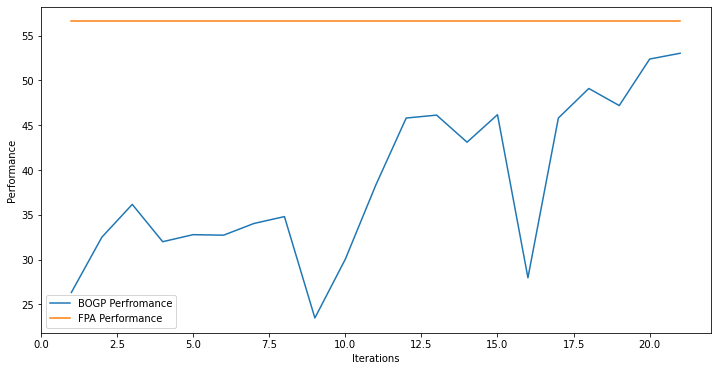

x_next is [ 19.33755634 -28.44938768  17.3788838    2.17946731 -20.75091742
   9.99803056  18.8792926   20.68633967  18.38687178  15.55786569
  20.19447836  12.32566806   5.53490188  24.51832789 -14.30238566
  18.84364119 -17.56675549   2.18623086 -24.66728544  -7.1502104 ]
f()=38.461898, actual=34.487
20


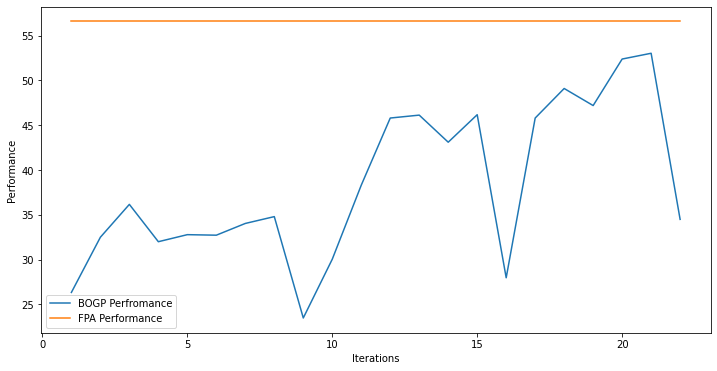

x_next is [-24.41810003  -6.22662401 -12.28263242  12.02246354 -26.39958473
  22.90296886 -24.659413    -0.92606849  29.32844142   3.47526203
 -30.40066476 -28.5849704   16.68428135  26.21199626 -28.04727435
 -14.18545587 -27.10658969  -5.07544086 -28.65055824   6.28004736]
f()=38.284337, actual=27.578
21


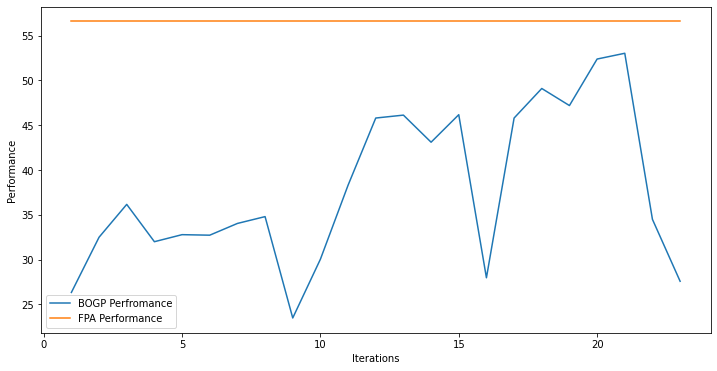

x_next is [ 30.  30. -31.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=52.263421, actual=53.408
22


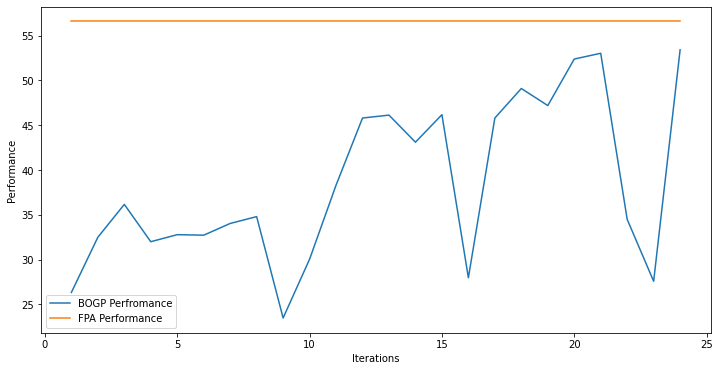

x_next is [ 30. -31. -31.  30.  30.  30.  30. -31.  30.  30.  30. -31.  30.  30.
  30.  30. -31. -31.  30.  30.]
f()=50.148728, actual=48.789
23


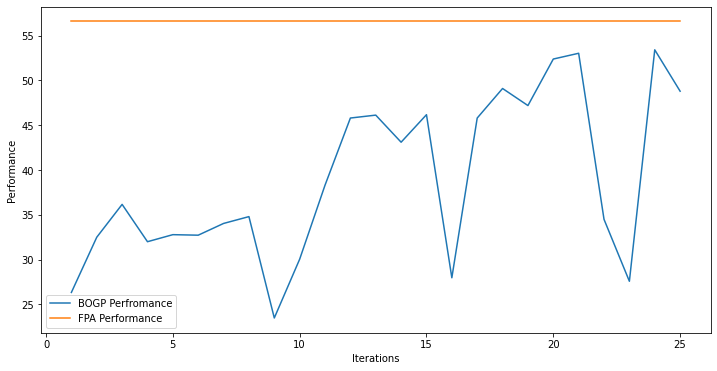

x_next is [ 30.  30. -31.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=52.995922, actual=53.408
24


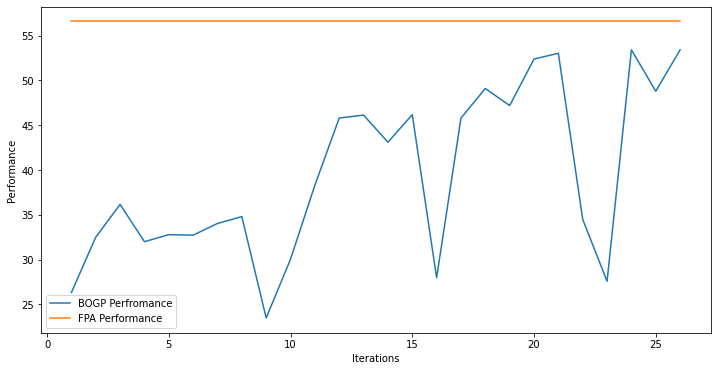

x_next is [ 30.  30. -31.  30.  30.  30.  30. -31.  30.  30.  30. -31.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=52.713299, actual=52.075
25


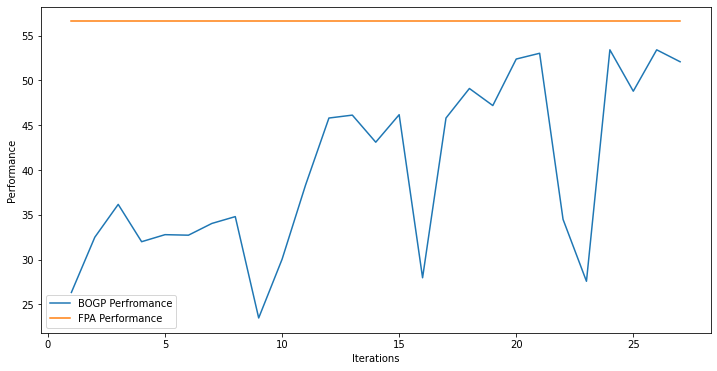

x_next is [ 29.63827715  29.64271219  28.39947539  29.69902259  29.73709468
  29.83429353  29.87921691  29.95879017  28.86521212 -29.69470872
  29.74078324 -30.92750225  29.84387098  29.97280778  29.84874891
  29.75974372 -30.58230817  29.59082112  29.89025635  29.87539068]
f()=51.380822, actual=54.028
26


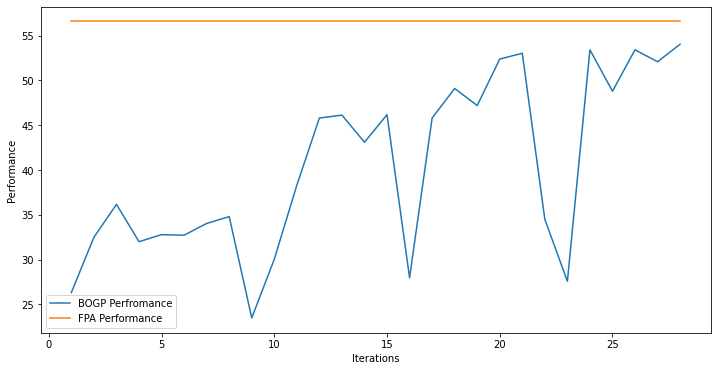

x_next is [ 30.  30. -31.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=50.077715, actual=53.408
27


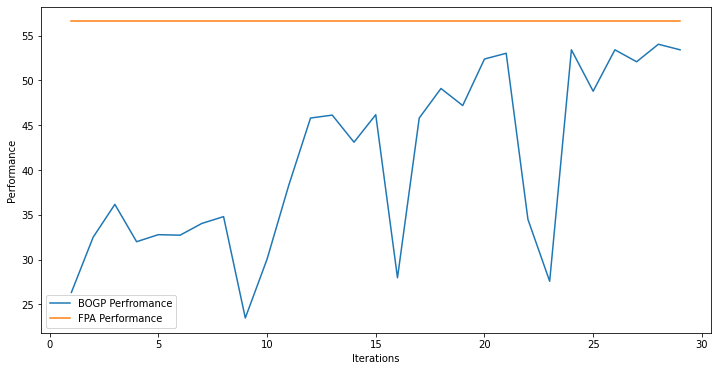

x_next is [ 30.  30. -31.  30.  30.  30.  30.  30.  30. -31.  30. -31.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=53.279366, actual=53.833
28


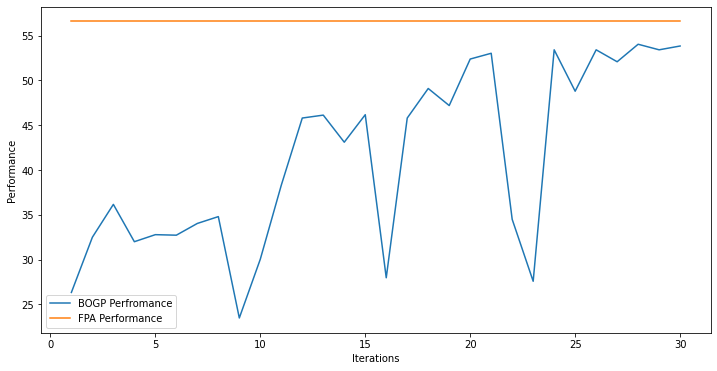

x_next is [ 27.95007998  29.6789893   26.80016213  28.58529772  29.02199086
  28.7298392   29.66631848  28.37763173  27.89212225 -30.59754764
  29.52598831  28.22445256  29.34231595  28.85629246  28.92776754
  29.18344022 -30.79123584  29.92258304  29.31317948  29.89872529]
f()=51.998059, actual=55.035
29


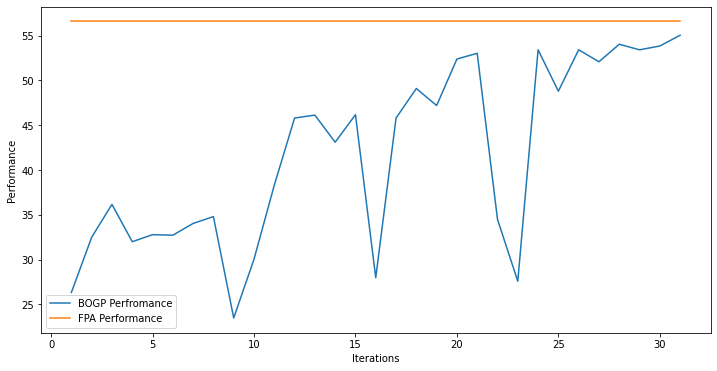

x_next is [ 29.46109402  28.90900457  29.78920285  29.77340895  28.64317667
  28.73318713  29.72449035 -29.8981815   27.95737527 -24.47907643
  27.05171898  29.03329556  28.93983228  27.22098823  27.91887094
  28.89932653 -30.22388828  26.78160189  28.75343375  24.39941551]
f()=53.021846, actual=51.979
30


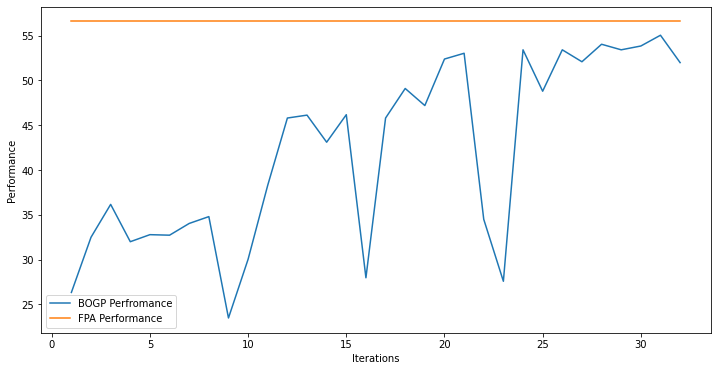

x_next is [  4.55945206  18.25889731 -28.93069814  -6.80038498  23.48118742
  29.73289863  17.37686902   1.92153506 -21.96750932   2.67822999
  29.83229888 -11.00290683  21.22796507  19.942427   -11.67993557
 -20.14072491  -5.0142653    1.67505258  13.73771305  20.0414577 ]
f()=42.041720, actual=37.486
31


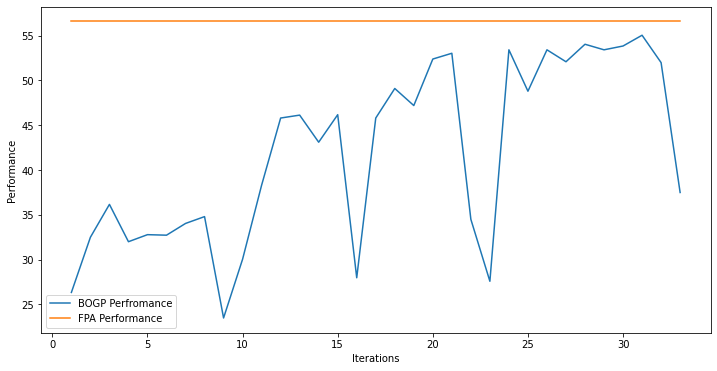

x_next is [ 29.9998848   29.99988692 -30.99977696  29.99995773  29.99983616
  29.99959064  29.99994121  29.99996129  29.99972292  29.99958404
  29.99999344 -30.99992467  29.99980534  29.9996406   29.99997956
  29.99988984 -30.99960695  29.99941755  29.9999012   29.9999657 ]
f()=41.905274, actual=53.408
32


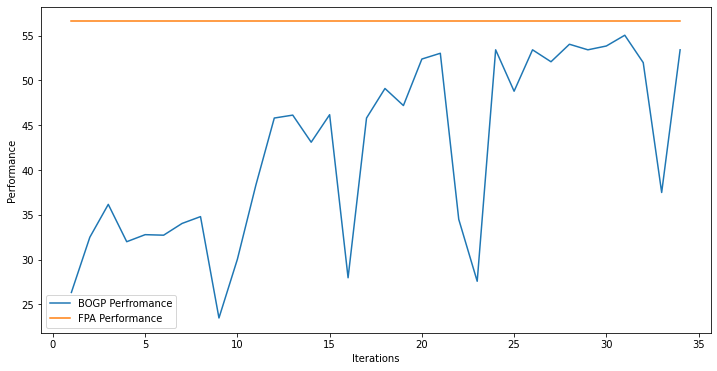

x_next is [ 29.94005375  29.88918557  28.13591406  29.24027842  29.58718195
  29.85665156  29.25543097  28.73139843  27.35138239   7.5247616
  28.69134664  29.46630515  28.89651741  29.0792319   29.65623854
  29.35033024 -30.24693119 -25.46353835  29.72036028  29.5496595 ]
f()=53.722793, actual=52.647
33


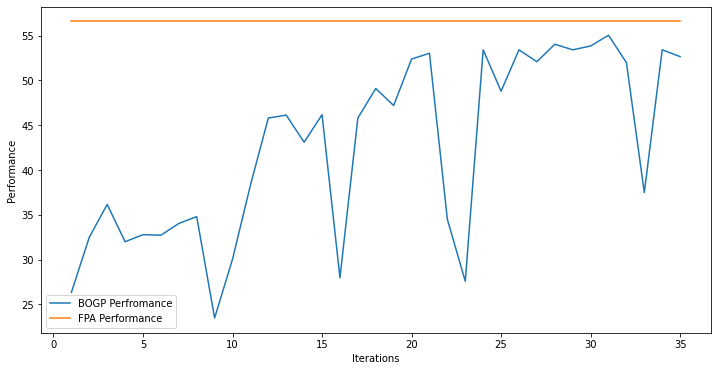

x_next is [ 29.99583549  29.99643034  29.99275586  29.99697096  29.99753452
  29.9956594   29.99726397  29.9991962   29.99897626 -30.99850853
  29.99865067  29.99612825  29.99970683  29.99618362 -30.996581
  29.99915841 -30.99221497  29.99878406  29.99922561  29.99980739]
f()=55.248021, actual=54.092
34


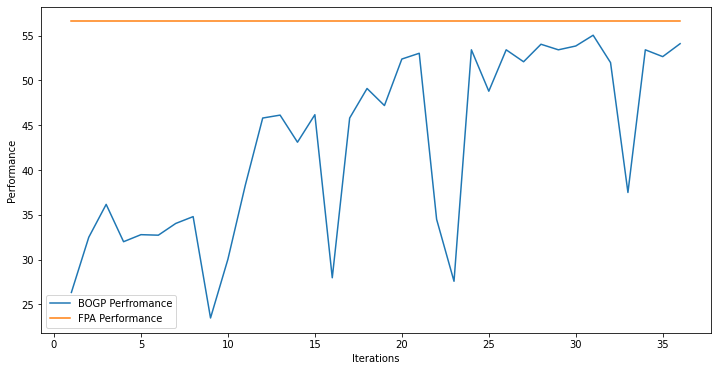

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -30.99991402
  30.          30.          30.          30.          30.
  30.         -31.          30.          30.          30.        ]
f()=55.231750, actual=54.806
35


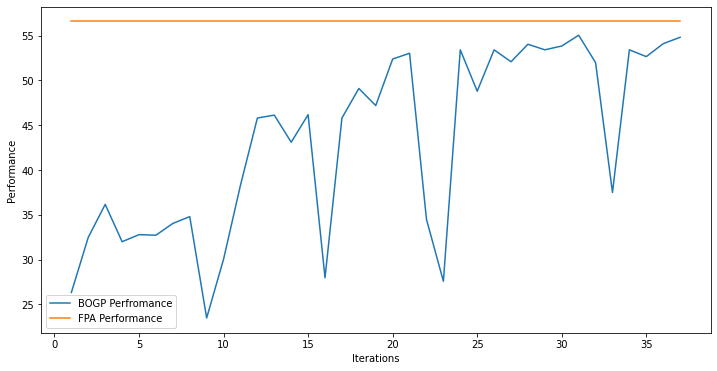

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=55.093344, actual=54.806
36


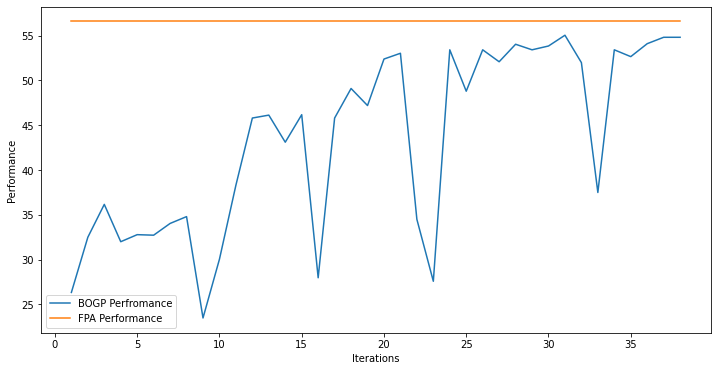

x_next is [ 29.23873056  29.16016567  -6.18314007  28.61836046  29.45978657
  13.09546668  29.99288172  29.51352243  17.61172954  -3.12461023
  29.92471861  18.60040474  29.91007795  28.32292289  28.87004138
  29.97418562 -30.57601609  29.1083033   29.97620698  29.74742053]
f()=55.651333, actual=53.121
37


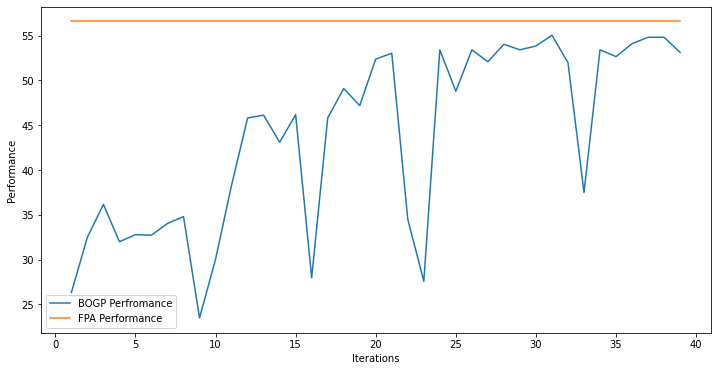

x_next is [ 21.96656551  29.77032041  21.44650165   9.38269212  29.36915152
  29.18535842  29.90639484  27.17404401  26.97039157 -30.9204248
  28.40265294  12.10736991  29.80348838  25.13886206  17.01128773
  29.75977548 -30.3980228   29.76735775  29.47593427  29.41137675]
f()=55.334308, actual=51.322
38


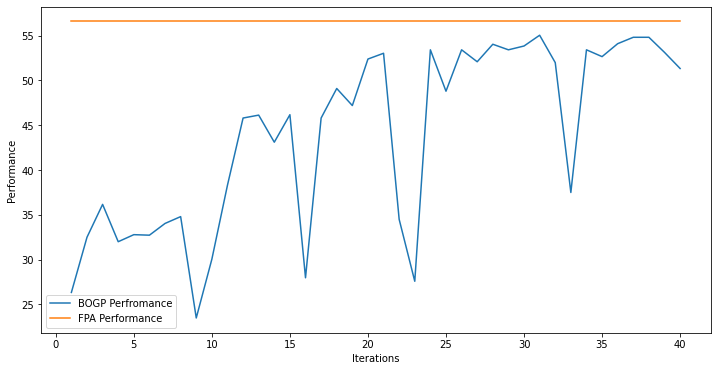

x_next is [ 29.04936778  29.99352775  23.71848543  29.74875936  29.94493398
  29.22405721  29.3696378   24.3604707  -12.86486115 -29.89549309
  29.38323181  24.7257345   29.92682219  29.69424046  27.33965242
  29.56713154 -30.54073829  21.77245609  29.01551269  28.26387511]
f()=55.160311, actual=52.427
39


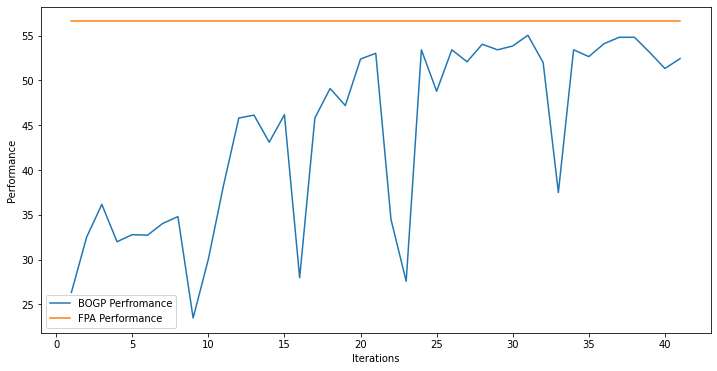

x_next is [ 27.5875966   26.33703459  20.96483638  29.47817011  26.77774788
  24.55672427  29.74850747  24.46389787  28.66233746 -24.20694158
  29.7138135   26.4692734   26.2988443   28.99189798  23.6911101
  29.92526221 -30.18347117  29.7587309   29.54138115  29.82913479]
f()=55.219592, actual=52.676
40


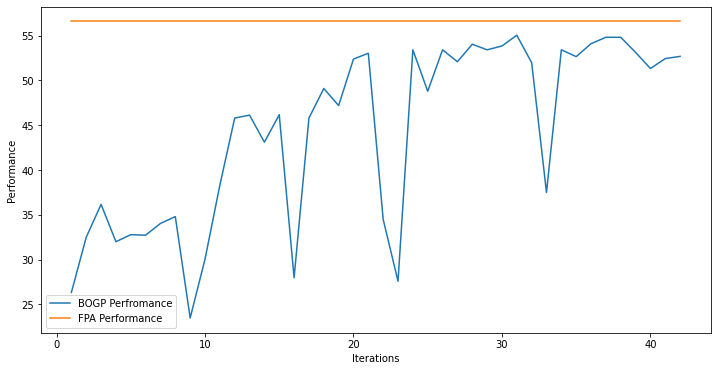

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=54.490642, actual=54.248
41


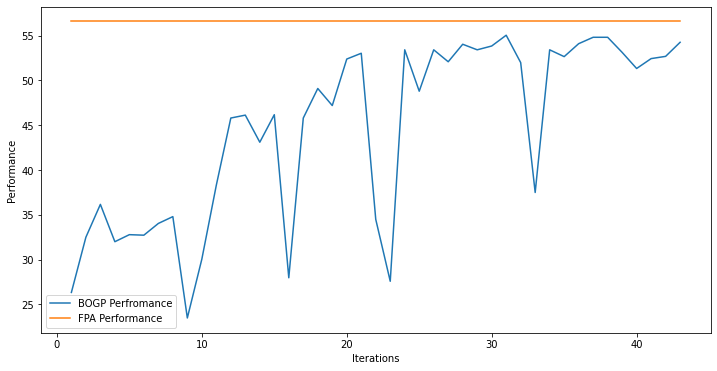

x_next is [ 29.89435292  29.86168902  25.96637028  29.93023518  29.98132934
  29.45715363  29.80286263  29.52905916  29.77004451 -30.4622109
  29.61997537  28.71601193  29.99408386 -18.47198825  29.5910098
  -3.76844818 -30.81482339  29.87445838  29.7353982   29.93221125]
f()=54.971873, actual=49.223
42


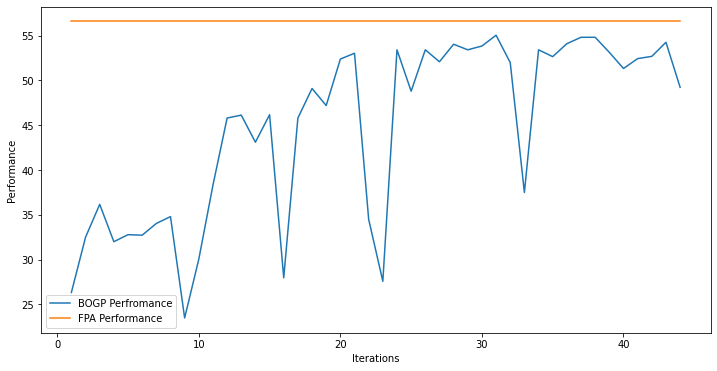

x_next is [  1.49510525  29.96378061  26.2773194   29.78463901  29.62077384
  29.65373711  29.58023401  29.49262664  23.18273246 -30.84694261
  29.41390271  28.82687615  29.95798494  29.6222396   29.65363861
  29.10894297 -30.86754193  29.41733581   2.5758118   29.6752114 ]
f()=54.928860, actual=47.990
43


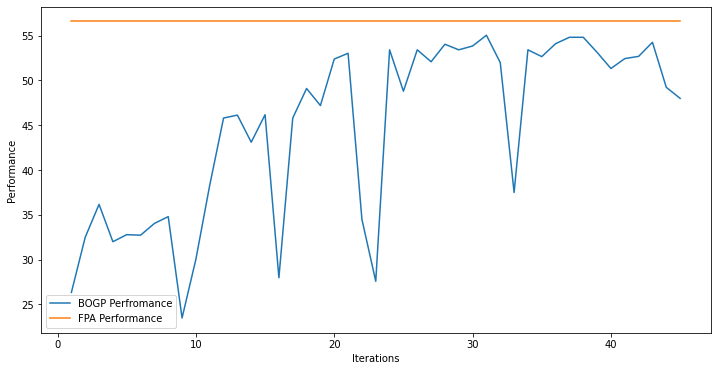

x_next is [ 27.15980416  -3.3667442  -21.13737023   0.59868297 -17.95319614
  -1.74734883 -12.7710403   -0.94266382  17.48940648 -17.16980443
 -12.79591216 -21.46026261 -17.05434517  -0.45689139 -16.80315674
   7.87687575 -26.14711881  29.58372673  24.33995891 -30.71046519]
f()=44.752767, actual=28.502
44


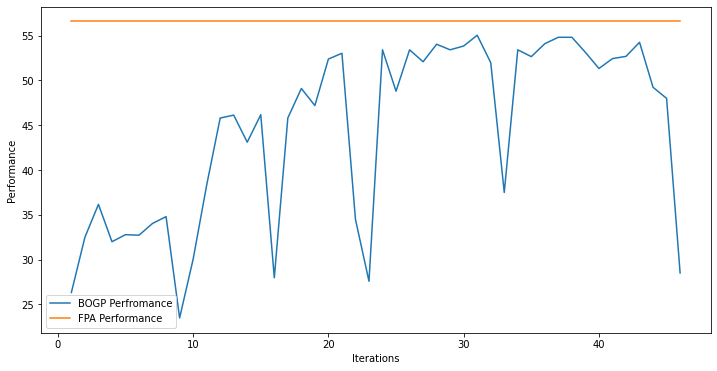

x_next is [ 30.          30.          29.99999996  30.          30.
  30.          30.          30.          30.         -31.
  30.          30.          30.          30.          30.
  30.         -31.          30.          30.          30.        ]
f()=54.755104, actual=54.806
45


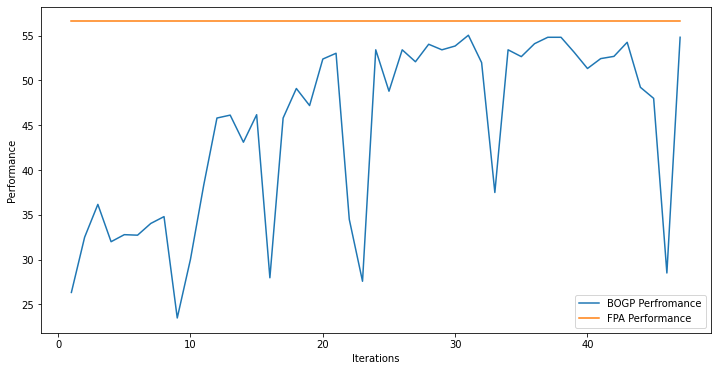

x_next is [-10.80562989 -14.83658974 -22.27261582  11.6440482  -19.93288874
  21.79220912  19.20015094 -17.4635487   14.46891034 -25.11150458
 -20.82662326   7.1126855   20.01282532   6.27834591  -8.47371832
 -29.7732336   27.87231345 -29.35455123  -9.2427447   29.05985364]
f()=30.082654, actual=30.165
46


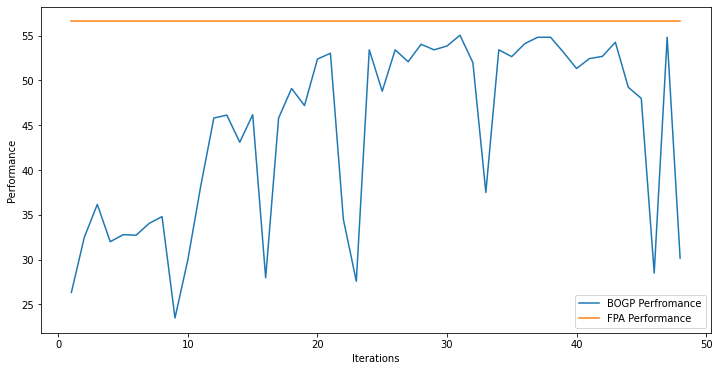

x_next is [ 19.43241453  15.28495309  13.08035897  -5.77196638  11.25287191
  26.59351186 -26.72523204  25.90316163  13.46831054  -1.1518673
  14.06829322  14.99062407  18.52825587  20.66179367   3.97360933
 -17.99106447   4.24436997   8.93608359  28.66042167  17.6302045 ]
f()=39.058785, actual=39.219
47


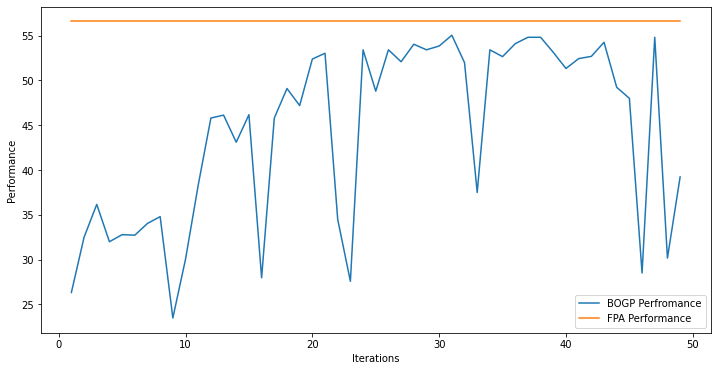

x_next is [ 29.97584971  29.70061439  13.19536536  29.87540377  29.77660502
  29.95286189  29.97782436  28.66394609   9.05974772  28.74658289
   7.08808401 -20.9792332   29.98569274  29.93093099  29.83254234
  29.98172957 -30.75503659  10.01660962  29.98959694  29.94682939]
f()=54.323974, actual=50.688
48


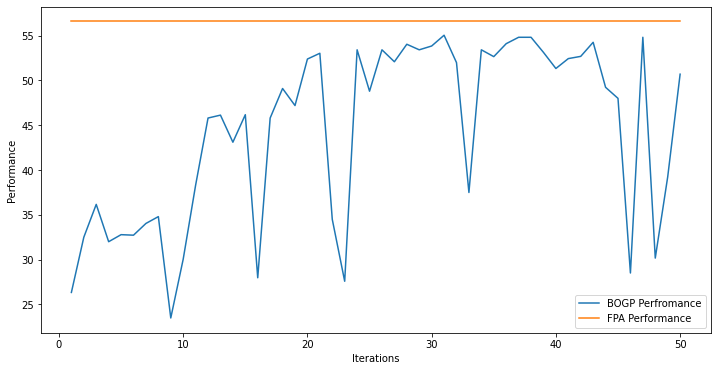

x_next is [ 30.          30.          30.          30.          30.
  30.          30.          30.          30.         -30.99999999
  30.          30.          30.          30.          30.
  30.         -31.          30.          30.          30.        ]
f()=54.849444, actual=54.806
49


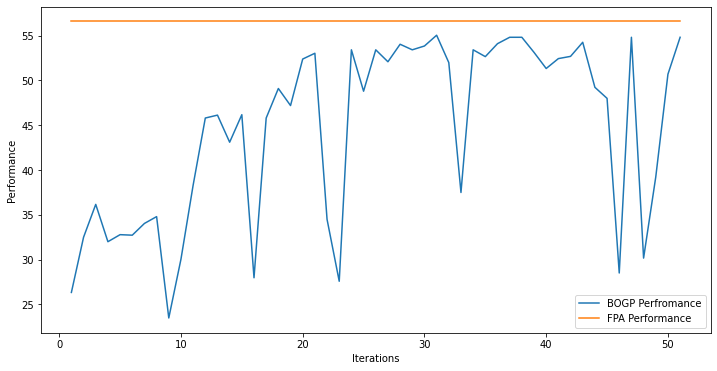

x_next is [ 29.38308981  29.67247551  21.2954137   29.92333758  28.88379855
  29.43490775  25.16837631  29.46248638  20.11582587 -29.87531945
  28.6913166   26.60934035  29.58413885  29.5019976   29.51604585
  15.67455367 -30.5179543   28.65504931  29.48385289  29.9345407 ]
f()=55.265430, actual=50.881
50


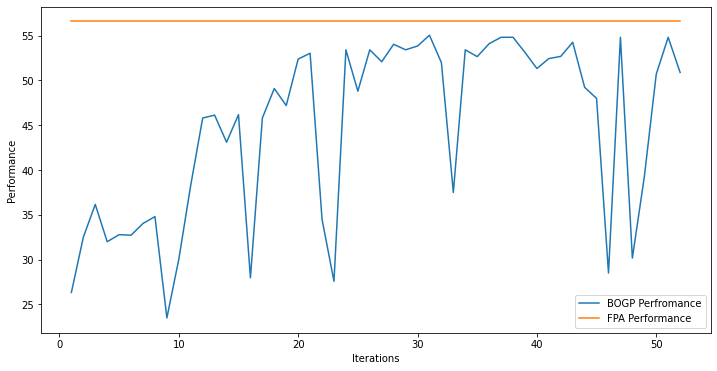

x_next is [ 29.74444154  29.97504811  21.60493502  29.71791244  28.74366949
  29.83335294  29.84665971  20.16940289  17.41559439  29.88277914
  29.9719736   29.13076635  29.95681321 -27.26545662  29.71048494
  29.96579483 -30.85976431  25.39762494  29.88221228  29.81005833]
f()=55.073387, actual=50.855
51


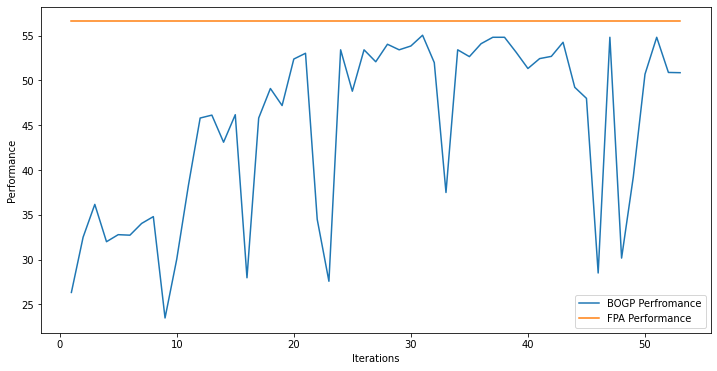

x_next is [  7.63987921 -25.10971015  27.73050544 -25.08901008   2.19533315
  26.35095595  24.97302149   0.40545124   3.43421184 -15.37031271
  -0.63390123   4.54016157 -27.87535848  -5.16106961  23.94711836
  -9.45791402 -11.67986485 -15.02358086  18.00247029 -14.93994813]
f()=44.788258, actual=28.659
52


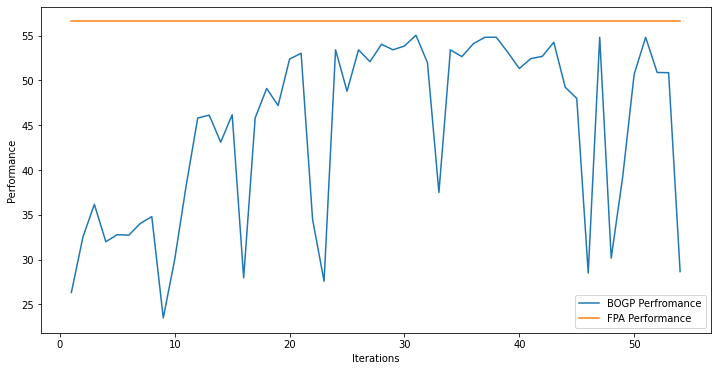

x_next is [ 29.76369657  29.83800567  29.72790278  29.787109    29.69323732
  29.82063617  29.90699711  29.09381755  28.94461025  29.77544425
  29.96816684  29.47244452  29.8888375   29.80144944 -30.76005703
  29.95101949 -30.76545432  10.50949446  29.99995037  29.82243529]
f()=53.261202, actual=50.816
53


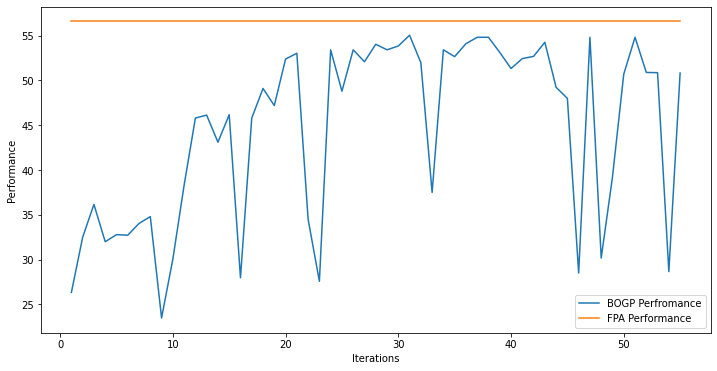

x_next is [ 18.00074477  -2.73839718   0.45439409  24.15572491  12.74354281
   7.69021472  26.40826692 -22.64943664  20.87492804  17.19497641
  27.54843317  13.13009255 -27.03446159  21.94552252   8.68856403
   9.76016539  -1.59086906 -12.71425761   1.40615247  25.78968538]
f()=44.603674, actual=38.569
54


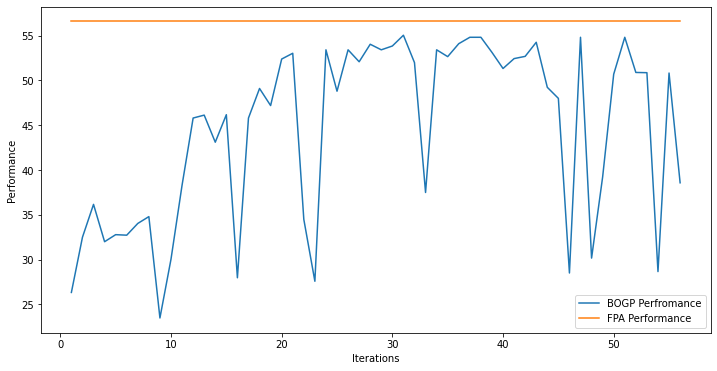

x_next is [ 29.54565085  29.98555315 -30.70136967  29.11332838  29.55056851
   3.63378628  29.70636865  29.94935411  13.26071726   4.37788806
  29.68847016 -30.36666828  29.77155921  29.56566133  29.42346509
  29.98669389 -27.63767894  20.63383338  29.73045295  29.40508099]
f()=53.817731, actual=54.404
55


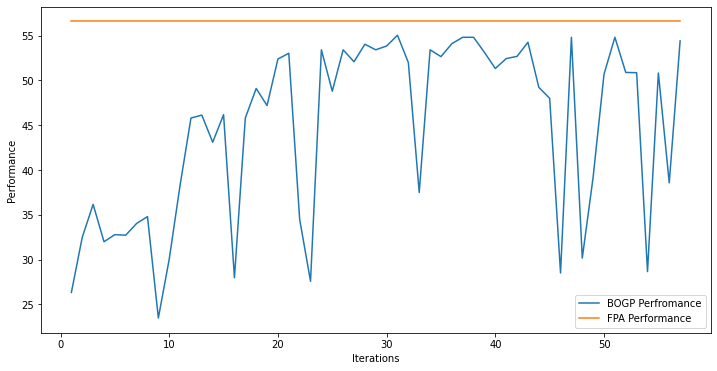

x_next is [ 29.6417303   29.82507588  28.93945334  29.46117743  29.14040211
  27.69847612  29.59241689  23.4059693   22.75768405 -30.88473704
  29.92467722  23.07428605  29.98013866   9.95904798  29.89859295
  29.84487203 -29.45946168  28.04280004  29.97690292  29.93639065]
f()=55.616217, actual=51.700
56


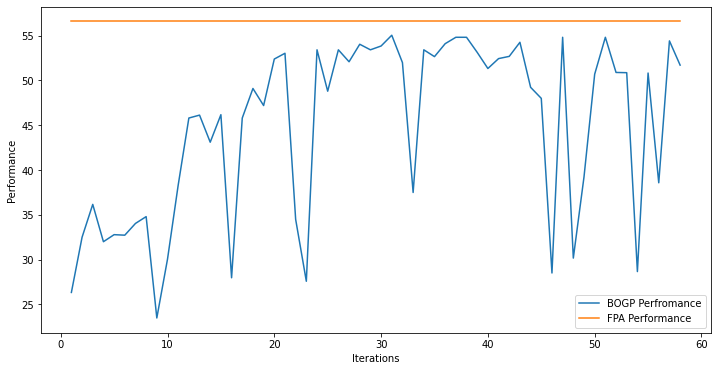

x_next is [ 2.50540816 -1.04230305  0.32750988  0.00455849  0.30580455 -2.03964521
  0.55427361 -1.38159038  1.20622797  0.95488569  0.89029244  1.53590091
  2.55309797  0.04990584  0.36583397  0.26034055 -1.1051479  -1.20573677
  0.83937042  1.06465011]
f()=22.895793, actual=27.375
57


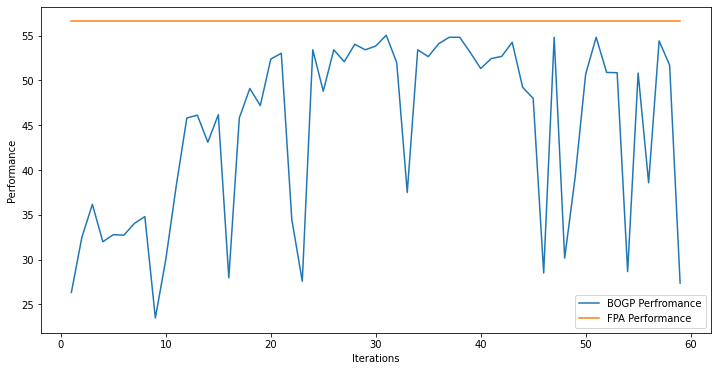

x_next is [ 29.97456274  29.98987768  12.19638563   4.3998002   29.78085664
  20.56051968  29.99274675  29.36081906  15.41049047  29.80036676
  29.7938812   29.87914156  29.73191471  29.92369825  29.91010434
  29.99247273 -30.99835615  28.8997717   29.99585889  29.94549221]
f()=54.227922, actual=50.468
58


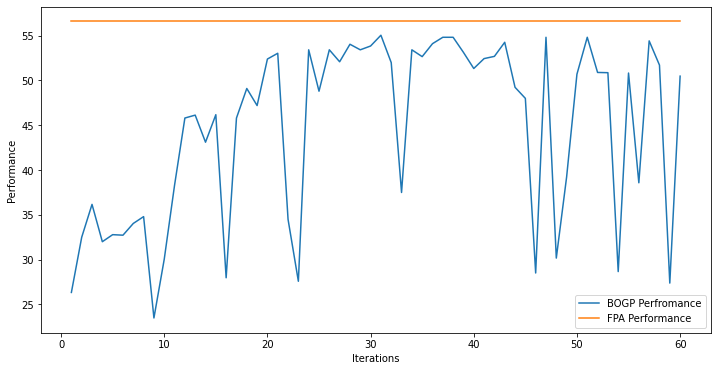

x_next is [ 29.95860999  29.94753415 -26.69521953  29.62485421  28.39950444
   2.6492043   28.68574699  26.66702355  12.45023382  -6.11360023
  29.62984599 -29.632235    29.7646361   29.87172906  29.39901415
  29.85360353 -30.9675505   29.82034615  29.88862799  28.43192857]
f()=54.346725, actual=50.116
59


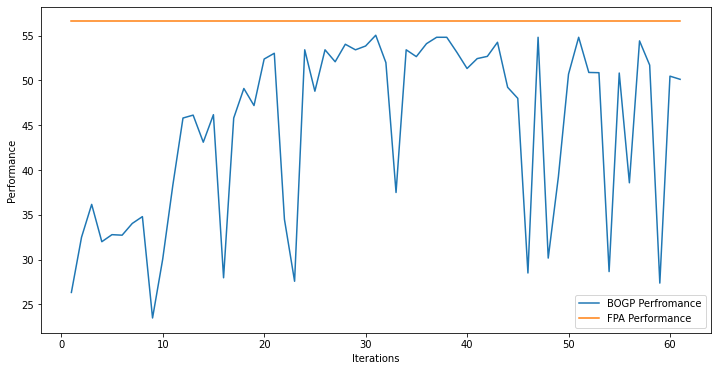

x_next is [ 29.78646253  29.96706534 -30.99342262  29.67777038  29.9404824
  13.24975077  29.942355    29.86446237  26.110228     5.36632333
  29.89130767 -30.95301247  29.81043855  29.95670932  29.95512513
  29.98959916 -11.18652615 -25.858802    29.91203692  29.98009558]
f()=58.375631, actual=53.066
60


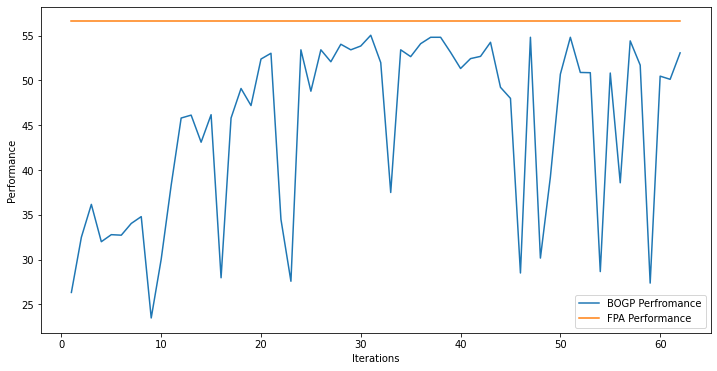

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=54.457167, actual=54.806
61


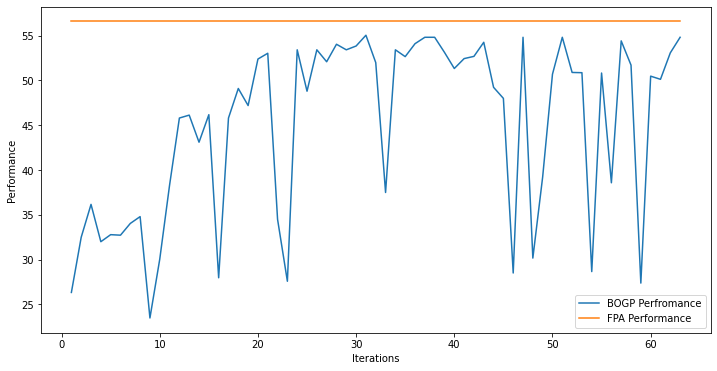

x_next is [ 29.91060381  29.80014108 -30.93152037  29.86597201  29.36311838
   8.64996943  29.9516956   29.68225051   9.02280211  20.59365153
  29.88739793 -14.53394181  29.59079925  29.90653504  29.97646478
  29.64548684 -29.1612215    0.36441661  29.61618411  29.70486033]
f()=56.235217, actual=51.153
62


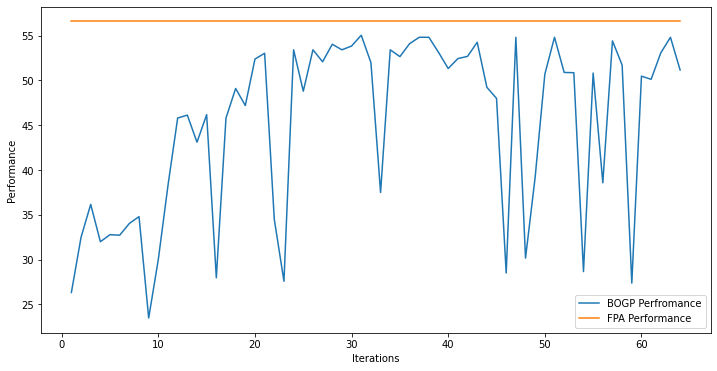

x_next is [ 29.80412429  29.93007446 -30.71454378  29.46037811  29.96125972
  29.96310625  29.9376532   29.92965518  29.25155742  -1.80583039
  29.98324038 -30.99699041  29.98237653  29.9336664   29.64772718
  29.95176563  15.19907874  21.0357254   29.92158398  29.9950357 ]
f()=56.438555, actual=53.812
63


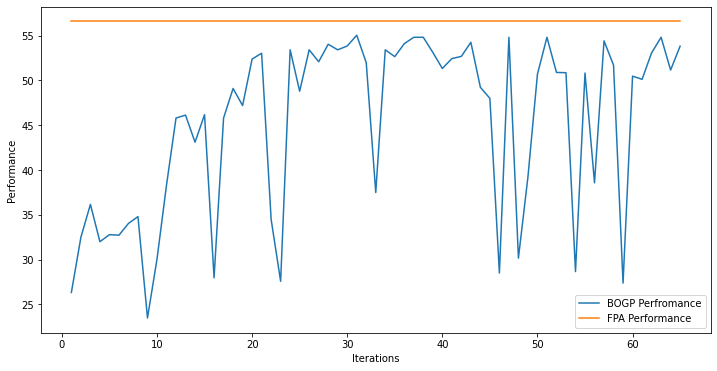

x_next is [ 29.7183992   29.66173689 -30.40901494  29.51178736  29.96775133
  29.35879329  29.87930777  29.57440527  29.34939325  -8.52254275
  29.53251067 -30.62867063  29.76797371  29.92421306  29.92036528
  29.94764302 -20.39294589   6.37325789  29.94849715  29.99875503]
f()=55.545031, actual=50.994
64


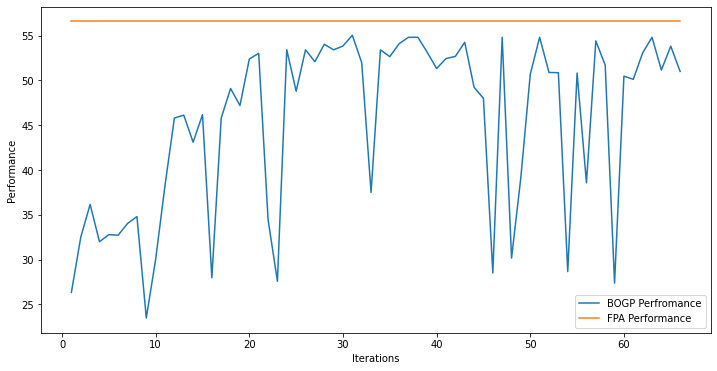

x_next is [ 29.74590001  29.95989056 -30.80868517  29.67603505  29.95879064
 -14.86108965  29.92648476  29.87151012  29.59011512  29.9825986
  29.92921916 -30.97637193  29.99562814  28.98725082  29.72596109
  29.85618565   6.96670535  20.78974866  29.90722145  29.96482662]
f()=57.021794, actual=48.527
65


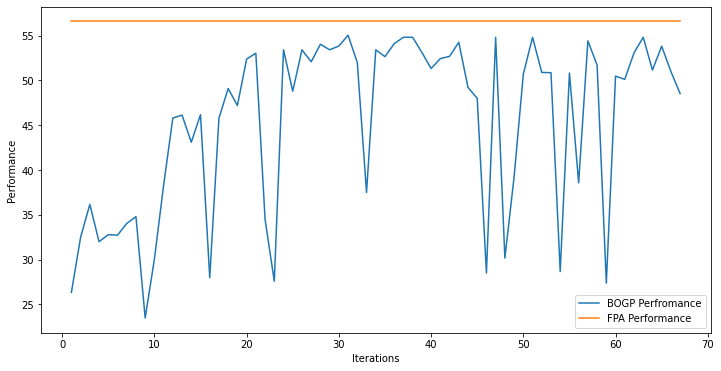

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=54.426383, actual=54.806
66


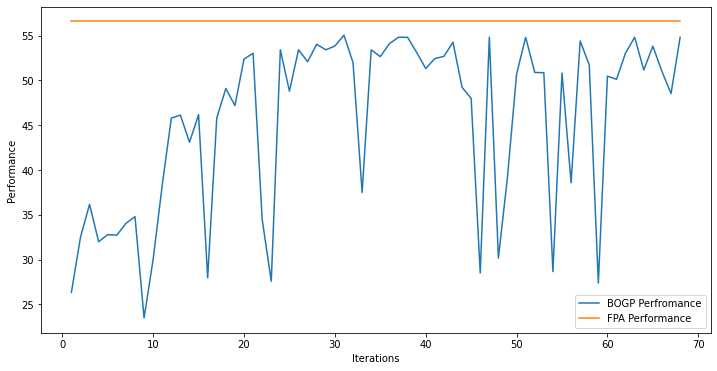

x_next is [ 23.05741239  29.92650088  24.16685436  28.09622635  29.40997897
  29.60567423  29.79691761  29.2560366   28.31308914 -30.84831952
  29.58649833  29.82829002  29.90854104  29.99370205  29.88736263
  29.96451421 -30.70295514  29.68023963  29.94848417  29.75067946]
f()=55.563938, actual=55.251
67


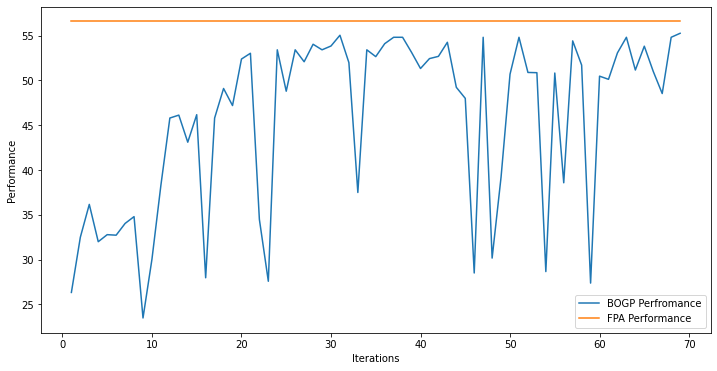

x_next is [ 30.  30.  30.  30.  30.  30.  30.  30.  30. -31.  30.  30.  30.  30.
  30.  30. -31.  30.  30.  30.]
f()=54.581241, actual=54.806
68


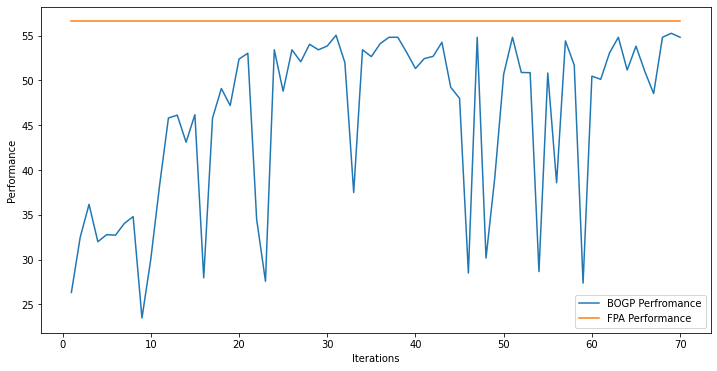

x_next is [ 26.01032327  29.65879729  24.30630802  27.26957739  29.51876142
  29.73680385  29.94940405  29.96491724  27.76105239 -30.23637391
  27.48803695  29.64476153  29.9891319   29.51611046  29.1682112
  29.92649458 -30.37734464  29.80093825  29.87885584  29.92515479]
f()=55.312248, actual=55.751
69


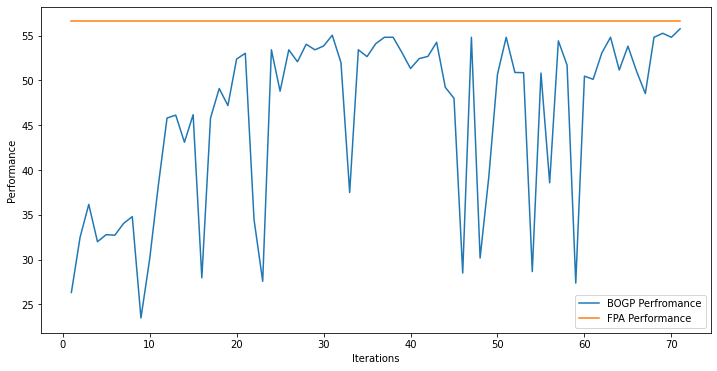

x_next is [ 29.85607822  29.66336035  19.68099     24.29811812  29.89527903
  29.43470485  29.97897044  29.93219126  25.93076319 -30.64975013
   8.68421432  29.87899074  29.7847379   29.81409704  29.92233976
  29.91444481 -27.55799537  29.58943808  29.90095414  29.54511618]
f()=56.180071, actual=56.382
70


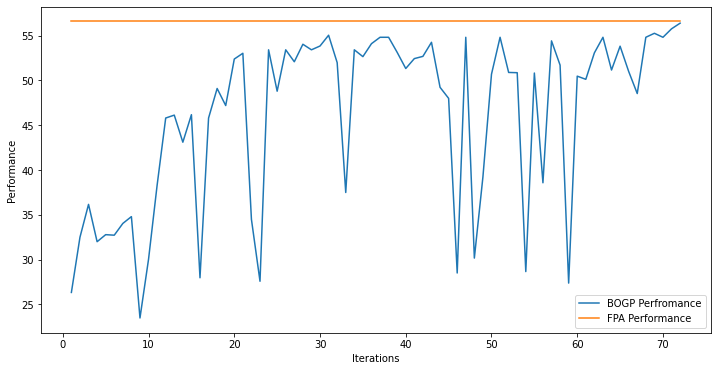

x_next is [ 29.88489771  29.29270965  22.29152403  27.81887929  29.65142657
  29.74827525  29.92409691  29.92770935  26.30088459 -30.98475067
   9.8244481   29.23019355  29.46885768  29.8547275   29.632189
  29.78027336 -27.30229336  29.49422149  29.44394076  29.93358002]
f()=56.212279, actual=55.287
71


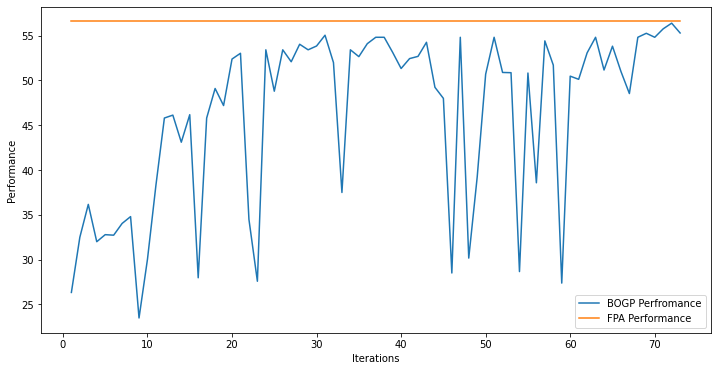

x_next is [ 28.16506829  29.61117868 -14.81668579   3.69463421  27.98653221
  28.92724481  28.79622232  29.55486512  26.95408316 -28.43755373
 -19.09270204  29.77752098  29.39618574  29.39291844  28.14781334
  29.70054623 -30.82639581  29.54162529  29.78613096  28.57337045]
f()=56.675946, actual=53.662
72


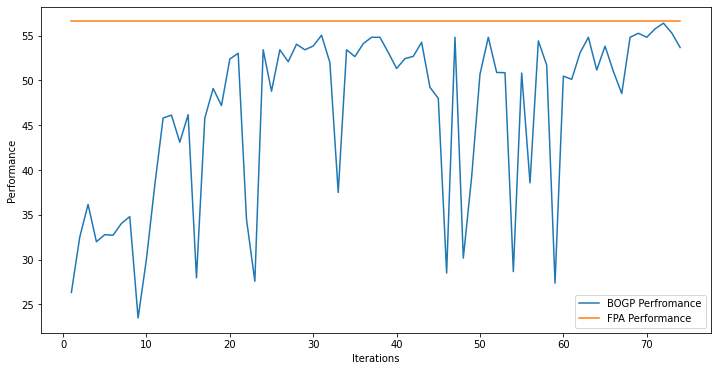

x_next is [ 29.91531665  29.50520299   6.83103637  18.48440329  29.38127462
  28.31236245  29.73683098  27.90351755  23.1025215  -25.48426777
  16.02440688  29.13890618  29.68641983  29.11976881  29.73526115
  29.76715428 -17.69501717  27.1484821   29.58584035  29.07502241]
f()=56.074453, actual=56.156
73


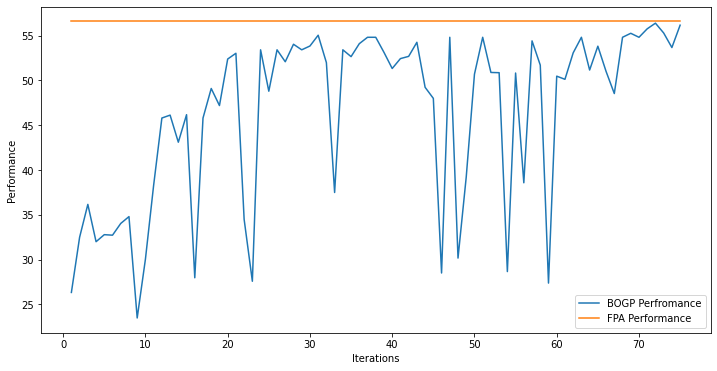

x_next is [ 30.          30.          10.5568802   12.4739293   30.
  29.99992695  30.          30.          25.73666947 -31.
  12.60620396  30.          29.79695054  30.          30.
  30.         -30.57878748  30.          30.          29.99806266]
f()=57.796214, actual=54.957
74


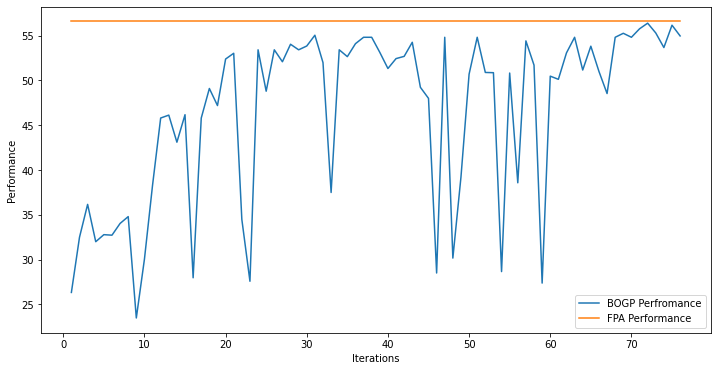

x_next is [ 26.68242468  26.93850824  28.99405665  29.16176018  28.06003572
  28.72655876  26.07075065  25.19945291  29.8816327   -5.26471307
  28.69643724  28.96591637  28.73688023  26.63480305  28.90922629
  29.33969581 -29.55289728  29.22452093  22.39249622  27.37206321]
f()=46.519319, actual=54.732
75


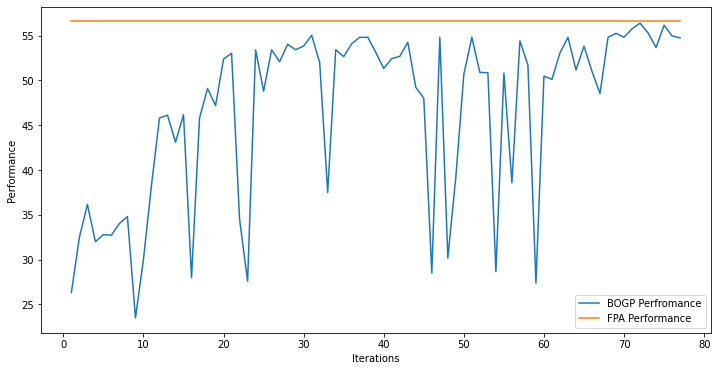

x_next is [ 29.83580914  29.91961525  20.10078296  17.32237569  29.92383506
  29.79358194  29.94454499  29.74843646  25.0648551  -14.20406188
   4.55463614  29.93745218  29.96726331  29.99924412  29.98340905
  29.93604653 -11.74135184  29.76229348  29.94978749  16.97648073]
f()=58.220077, actual=54.170
76


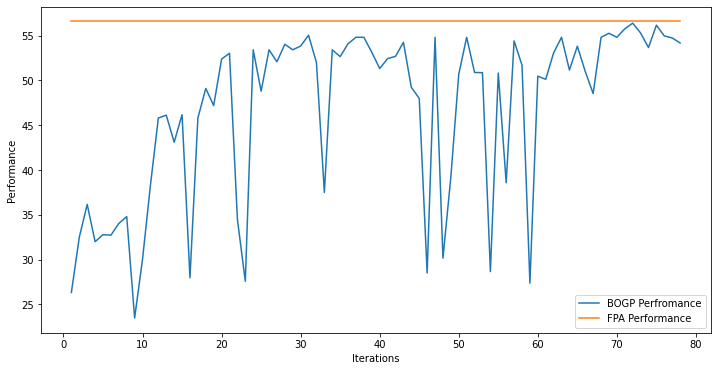

x_next is [ 29.1153825   29.94218237  14.93943562  21.00829018  29.8875667
  29.99292423  29.92192234  29.07255172  23.5499324  -24.67953529
   7.03884814  29.94764454  29.96146287  29.73243023  29.81668491
  29.98303575 -22.55571747  28.91240176  29.738537    29.57024956]
f()=56.897177, actual=56.361
77


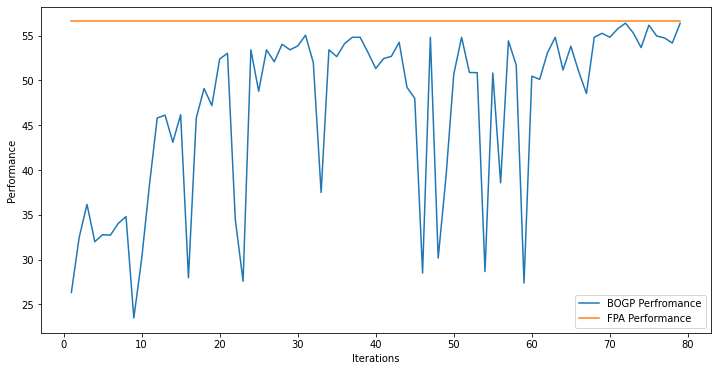

x_next is [ 29.97197412  29.95950262   7.81655673  21.79548107  29.50536591
  25.31511774  29.55685976  29.51560667  26.51194208 -30.85324747
  10.36585514  29.91810015  29.88650212  29.55061372  29.88071419
  29.79468686 -16.06631148  27.30559818  29.95641145  29.9188219 ]
f()=56.557738, actual=57.467
78


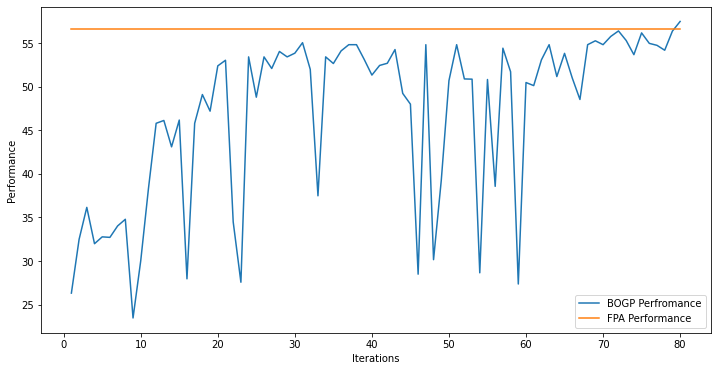

x_next is [ 29.99999389  29.99995041  29.99997058  29.99994103  29.99979468
  29.99964905  29.99997124  29.99999407  29.99983124 -30.9995915
  29.99999591  29.99989209  29.99997082  29.99965165  29.99991533
  29.99975405 -30.99993266  29.99988157  29.99962818  29.99995853]
f()=46.977892, actual=54.806
79


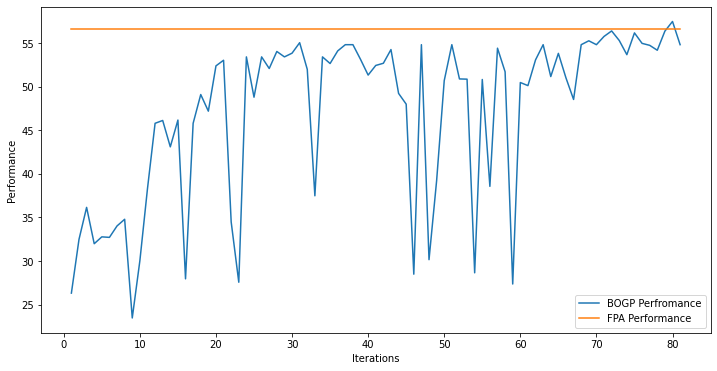

x_next is [ 29.71406776  29.99758009   7.85237322  20.60849246  29.97831084
  13.87760264  29.93116131  29.99807053  29.90586932 -30.97950222
   7.91262915  29.90459354  29.92932821  29.55041844  29.88825892
  29.8928732  -10.76205014  22.14659161  29.97957857  29.76458829]
f()=57.946642, actual=57.166
80


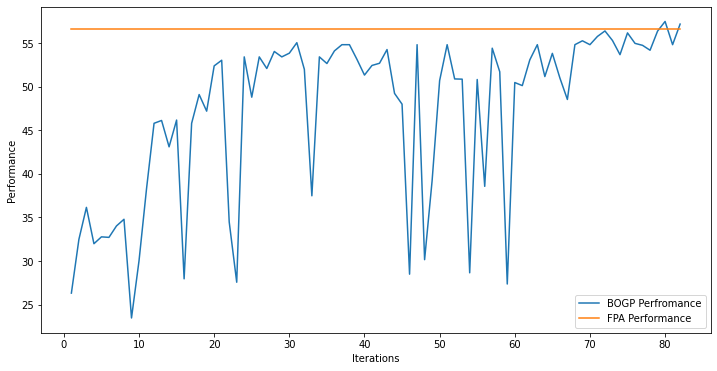

x_next is [ 29.99999984  29.99999999   6.84802572  22.77639071  29.99999999
  22.64806841  29.99999999  29.99999999  28.58360586 -30.99999907
   8.73463069  29.99999996  29.99999999  29.17122198  29.99999999
  29.99999999 -14.16717743  27.73849688  29.99999997  29.99999998]
f()=57.730195, actual=57.659
81


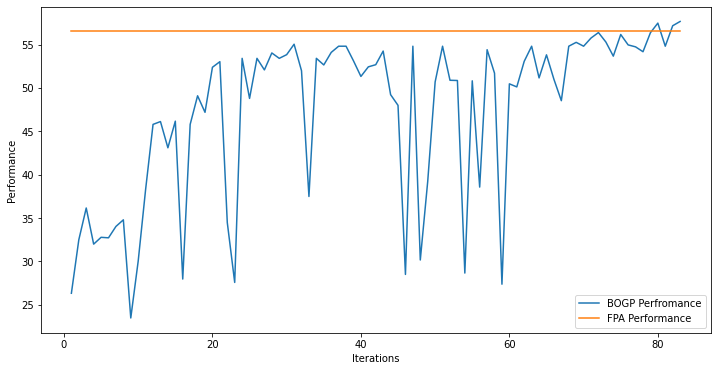

x_next is [ 29.98223178  29.89788943   8.84203778  22.23529655  29.8947971
  23.18146005  29.87999882  29.97463152  27.65603517 -30.74736646
   9.25067497  29.98584647  29.97335674  28.9466538   29.709787
  29.9695727  -15.05830828  26.75370306  29.74576329  29.77023836]
f()=57.614772, actual=57.764
82


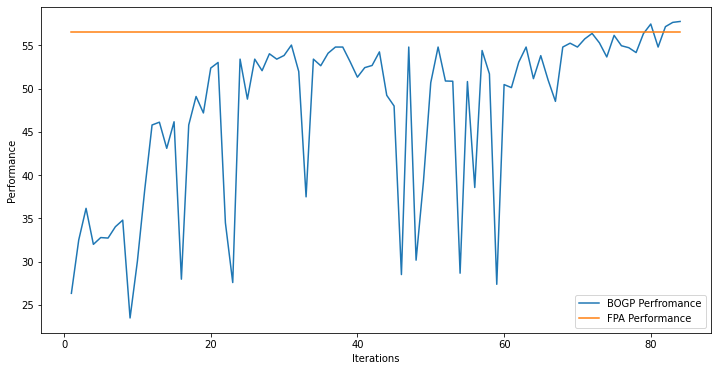

x_next is [ 29.73150516  29.93999736  12.17973481  22.70686652  29.83706026
  21.83263965  29.98131264  29.91066904  28.80999978 -30.84550062
   9.6816786   29.98231855  29.99920585  26.55076196  29.78885574
  29.97659833 -17.34981771  23.45450491  29.4105412   29.27773107]
f()=57.834997, actual=57.992
83


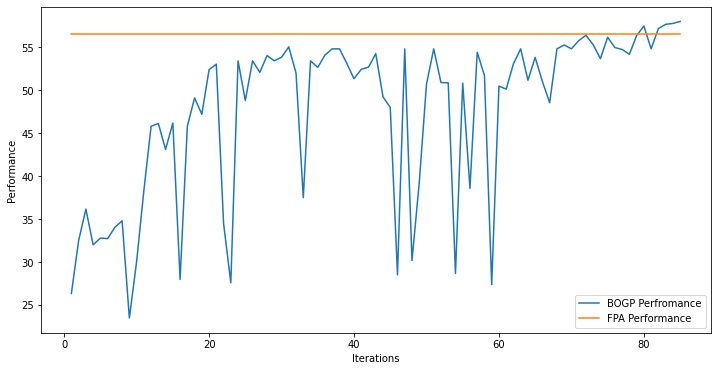

x_next is [ 29.95160501  29.19960787   6.52796187  23.34904684  29.97662398
  20.94733527  29.99699274  26.13682425  25.53161623 -21.13493941
  29.81383894  29.97889245  28.23912413  16.09689808  30.
  29.96874907  10.66266869  14.24425471  30.          30.        ]
f()=54.878450, actual=54.040
84


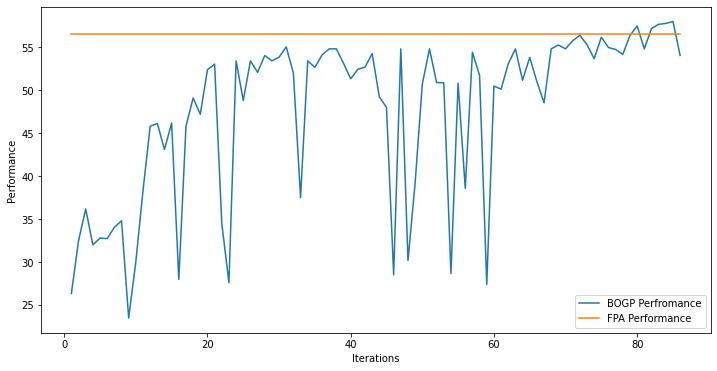

x_next is [ 29.989177    29.90761636  11.79242283  21.69384206  29.92328762
  21.47275563  29.9274966   29.91018691  29.90888311 -30.83211801
  10.19163284  29.90564464  29.98363373  27.11824636  29.90988374
  29.995484   -17.63168921  22.25393999  29.65250266  29.82175053]
f()=57.995272, actual=58.035
85


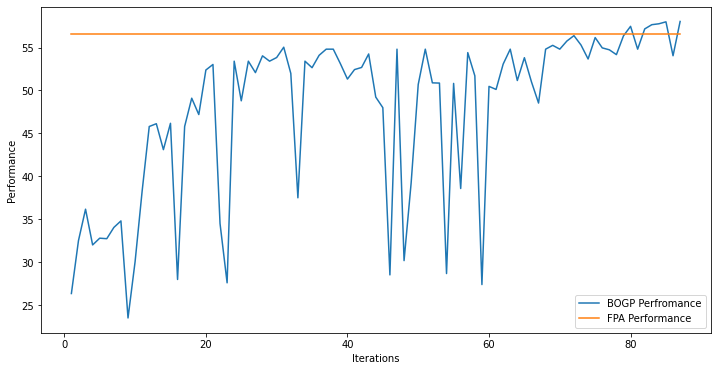

x_next is [ 29.9684705   29.93301701  11.99836617  21.69538098  29.89881331
  21.47720705  29.70782994  29.99615912  29.57226327 -30.36683632
  10.97491739  29.57686935  29.88135607  27.50536849  29.83769801
  29.83667588 -17.4771672   22.45531712  29.58735247  29.00948501]
f()=57.917928, actual=58.020
86


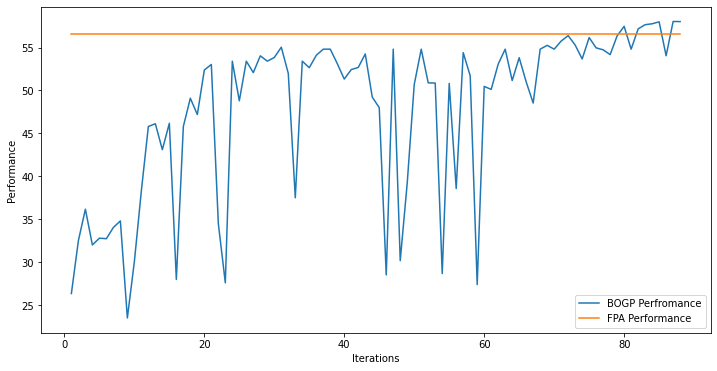

x_next is [ 29.86161321  29.76290042 -30.93557471  24.3453463   29.88737333
   9.72383533  29.74874087  29.91698485   6.52598888  16.37580493
  29.95301815 -30.99912781  29.98239915  27.11515249  23.16821156
  29.80622088 -19.04767037  19.00143418  29.92324073  29.97459394]
f()=55.134454, actual=56.292
87


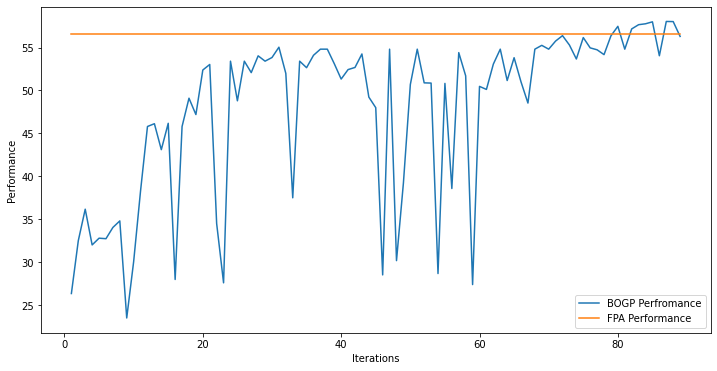

x_next is [ 29.61915284  29.93446459  13.79837998  22.04895717  29.92768734
  20.66891749  29.97809649  29.85278462  29.51229417 -30.58596
  14.08615783  29.90284219  29.94166416  28.56953788  29.88653934
  29.99494983 -18.81027475  22.67693775  29.17338516  26.14004732]
f()=58.127086, actual=58.003
88


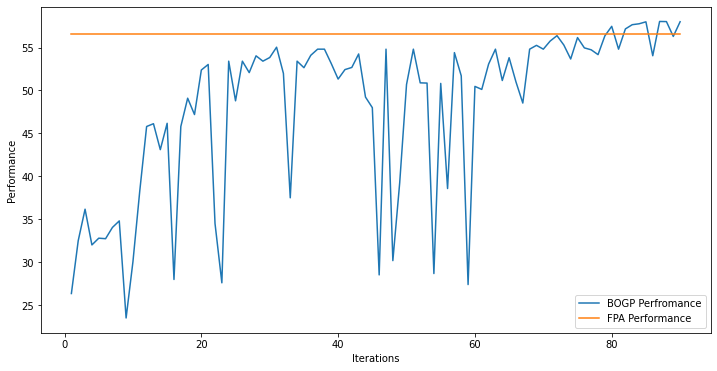

x_next is [ 29.60235821  29.95507238  12.32748202  22.14983819  29.93125506
  22.35948311  29.68951337  29.98299242  29.58989426 -30.67672795
  11.94455444  29.86006695  29.9613549   27.10814708  29.86417066
  29.86891081 -18.2690196   22.39141775  29.82404144  27.89102331]
f()=58.052340, actual=57.910
89


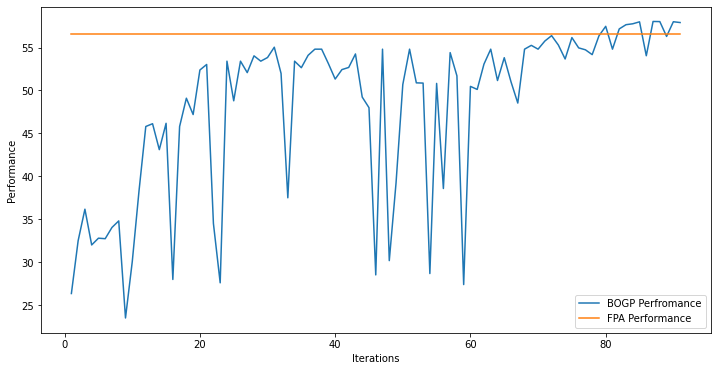

x_next is [ 30.          30.          11.88386761  30.          30.
  30.          30.          30.          30.         -31.
 -11.26524946  30.          30.          30.          30.
  30.           8.00640783  30.          30.          30.        ]
f()=58.202234, actual=54.803
90


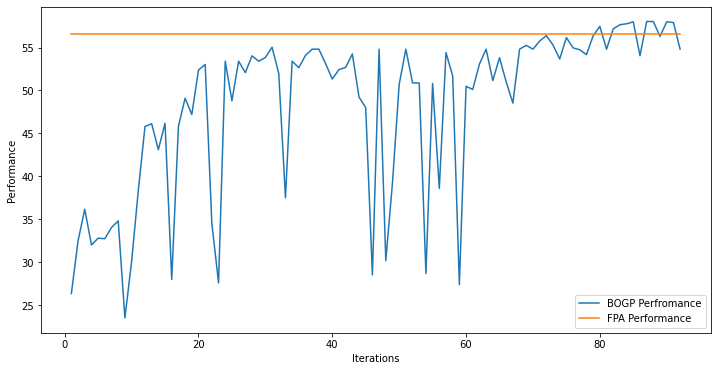

x_next is [ 28.46684589  29.9474541   20.52471073  18.60114756  29.58881205
  17.62457517  29.41096006  29.0874978   28.55801396 -29.647768
  17.19622392  28.88220116  29.77527266  29.84360797  29.99424034
  29.43378513 -17.30406892  22.08069747  25.26982641  29.54535326]
f()=57.800437, actual=58.374
91


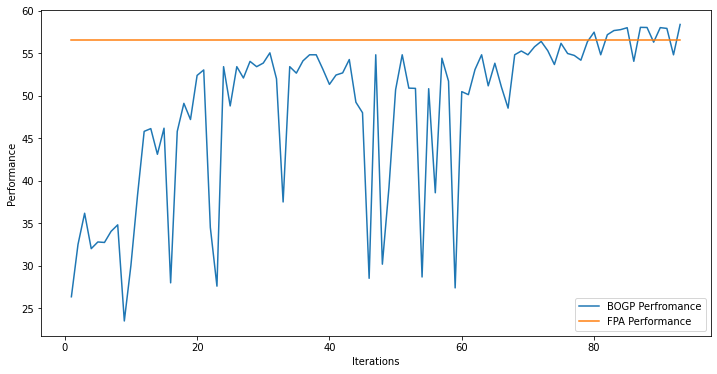

x_next is [ 29.4635848   -4.84012089 -15.44571475  10.79693286 -23.45753032
  27.01543898 -30.39974226  21.07726504 -10.4280117  -22.84363722
  -9.70855394  25.94281517 -20.85066544  10.19473911 -15.01862113
   3.43264773  29.32554665   4.83815856 -15.42723298   6.98557059]
f()=48.378128, actual=34.620
92


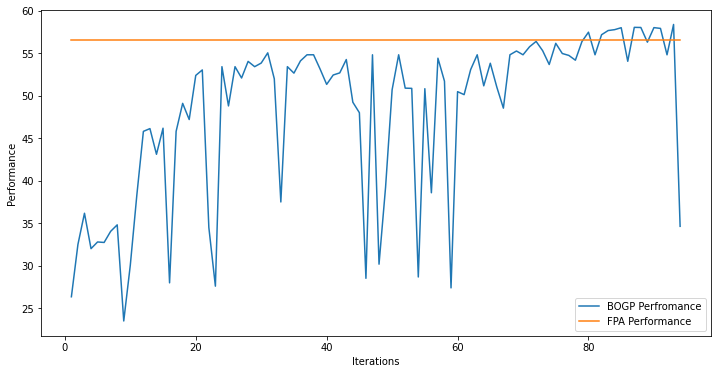

x_next is [ 29.9991874   29.99999996  22.78813208  18.14777091  29.99682624
  17.24052649  29.99993481  29.99999993  29.71863015 -28.80476165
  17.8801457   29.99999979  29.99999998  29.9995008   29.9990203
  29.99964705 -17.04323363  22.41529528  24.84380718  29.99999982]
f()=58.814356, actual=58.142
93


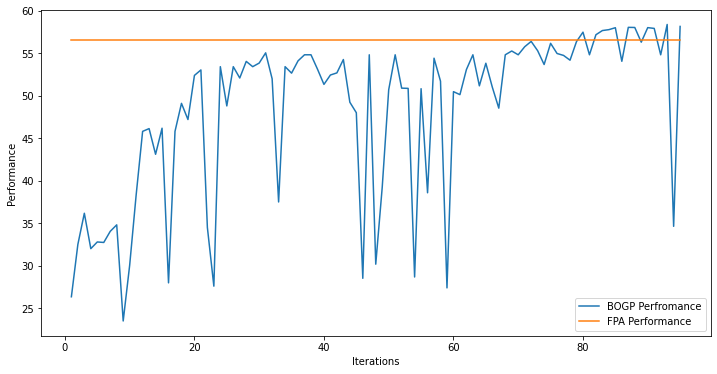

x_next is [ 28.11425137  29.99659862  18.31027508  19.05620048  29.92877953
  18.43180693  29.47309136  29.88206371  26.62357938 -30.71409863
  14.58428393  29.00286286  29.93960554  29.67986068  29.78090948
  29.95104989 -18.10867655  21.43046681  25.99454044  29.94610023]
f()=58.628409, actual=58.119
94


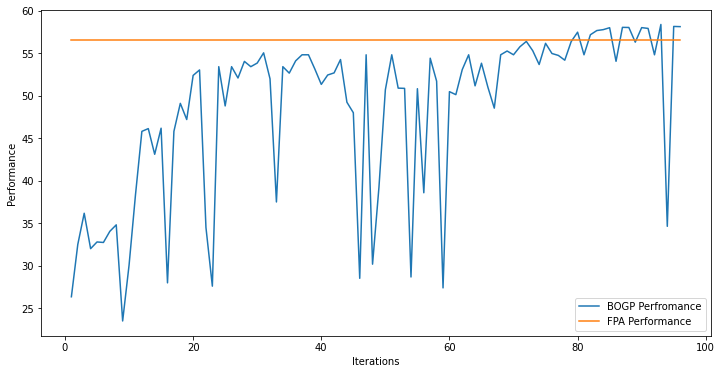

x_next is [ 28.16090698  29.97919533  18.4983157   19.95209801  26.69759539
  19.02063794  29.92149984  28.02180134  29.99004421 -30.35887973
  17.28289307  29.42443909  29.99495216  29.76025904  29.94983148
  29.99161187 -15.96726582  24.06022969  26.39637293  28.9441562 ]
f()=58.614520, actual=58.496
95


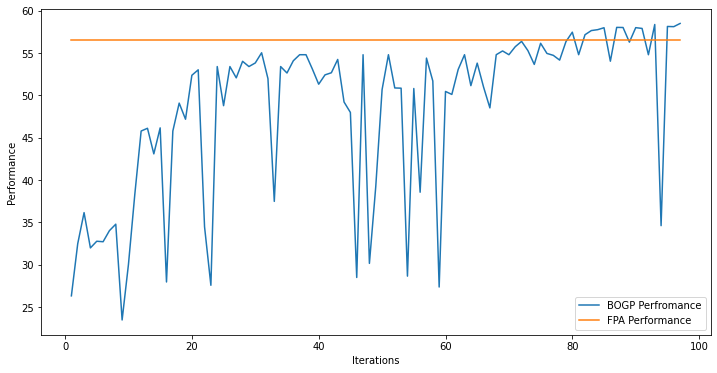

x_next is [ 27.67337388  29.92059036  18.84598556  18.94522383  29.02012588
  18.1821414   29.32731549  27.22448731  29.88433653 -29.8248517
  17.05863884  29.02246881  29.99850426  29.17723647  29.94627982
  29.77151048 -16.93857352  23.6697403   26.07231621  29.14214896]
f()=58.543431, actual=58.469
96


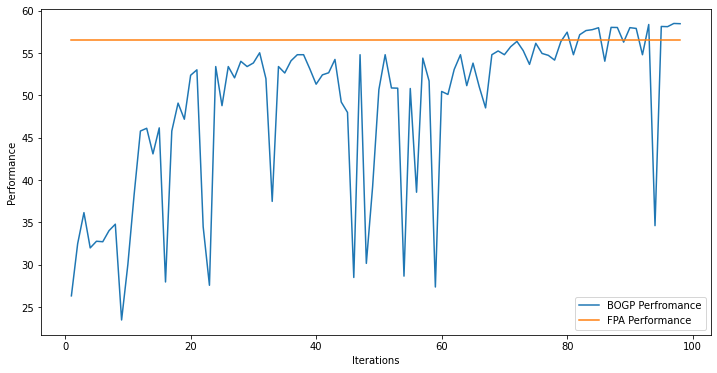

x_next is [ 27.4337883   29.96917257  19.1359834   19.42052894  27.88741656
  17.8357861   29.84688981  28.35604143  29.35346195 -29.60984561
  17.935256    28.5845994   29.9318892   29.74622825  29.90869003
  29.96177766 -16.13575726  22.82140762  26.16859523  28.96755225]
f()=58.506860, actual=58.384
97


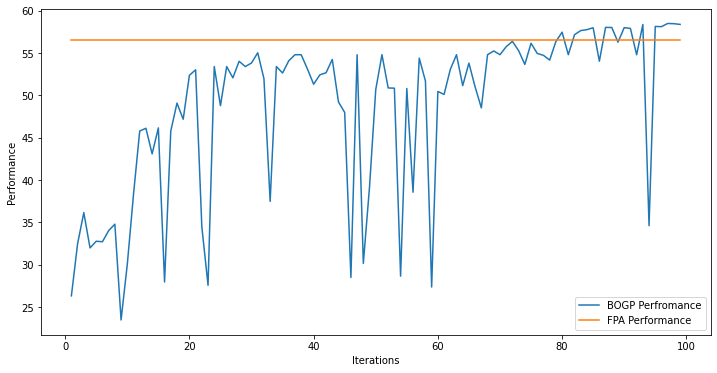

x_next is [ 30.          30.           8.85606018  28.32990576  30.
  17.71811776  30.          30.          30.         -31.
   5.75939795  30.          30.          30.          30.
  30.          -1.44013315  29.10589586  30.          30.        ]
f()=57.240829, actual=55.506
98


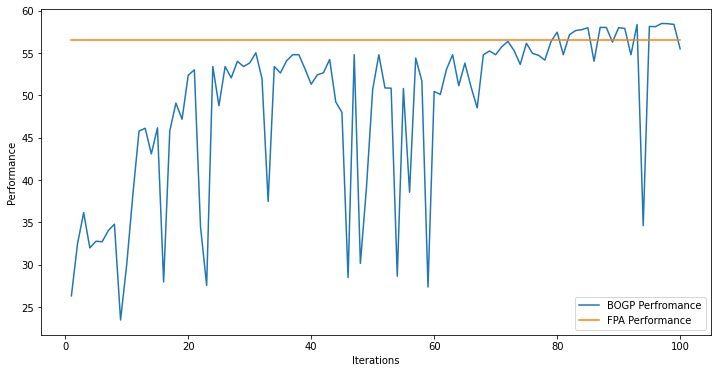

x_next is [ 29.53151918  29.88506965  17.94903142  18.08939895  26.1736946
  19.05093676  29.72731258  27.27427692  29.83548779 -30.88194095
  15.2652945   29.98603712  29.97953305  28.89661262  29.99147518
  29.82635256 -16.06619801  23.08952268  24.36394258  29.73509383]
f()=58.609131, actual=58.246
99


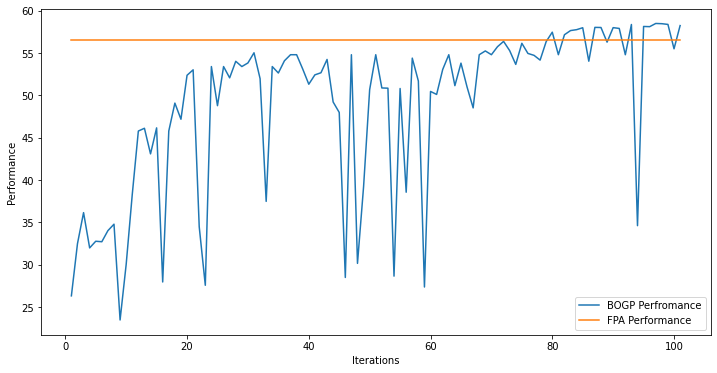

x_next is [ 28.15339987  29.94114567  18.91810265  19.27958557  27.71851781
  19.19266365  28.68927066  29.18686632  29.71230393 -30.68622253
  15.82466987  29.62743907  29.79956245  29.47311807  29.99999959
  29.36186957 -16.55410922  25.95106465  27.27963696  29.75932327]
f()=58.540735, actual=58.275
100


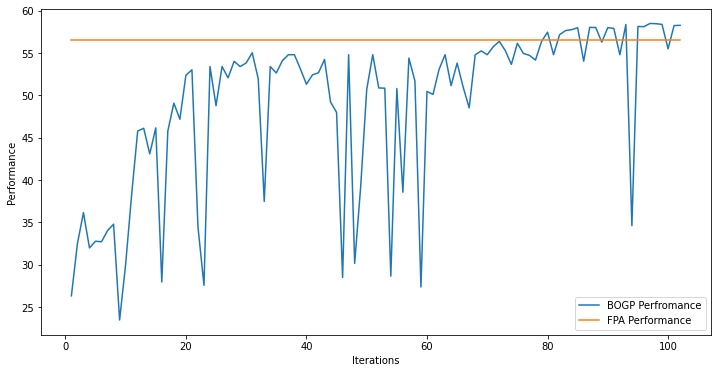

x_next is [ 28.9022735   29.99999998  19.09196504  20.03143456  29.4536854
  19.66868777  29.99997774  26.69315734  29.99964542 -30.73257787
  17.6563523   29.99995595  30.          29.99995533  29.99999996
  29.99999988 -17.33194971  23.42518897  26.04243645  29.08039882]
f()=58.644786, actual=58.679
101


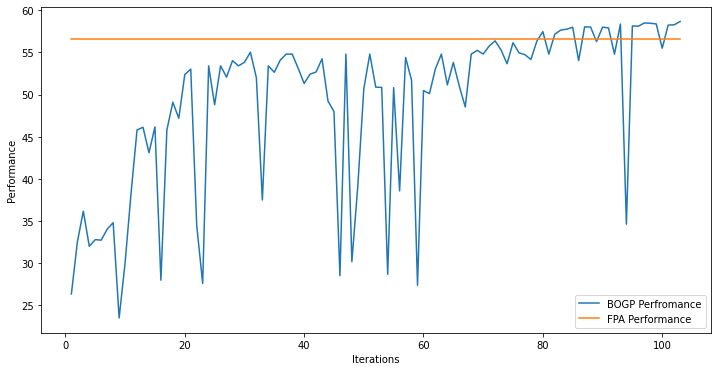

x_next is [ 28.50973767  29.99131853  19.4291176   20.5316946   29.91288505
  20.23807829  29.98461036  25.96830242  29.93879353 -30.71025659
  17.75193246  29.99290948  29.94201708  29.96588007  29.94612001
  29.99907432 -17.03628637  23.61169081  25.94015061  29.63236004]
f()=58.649198, actual=58.745
102


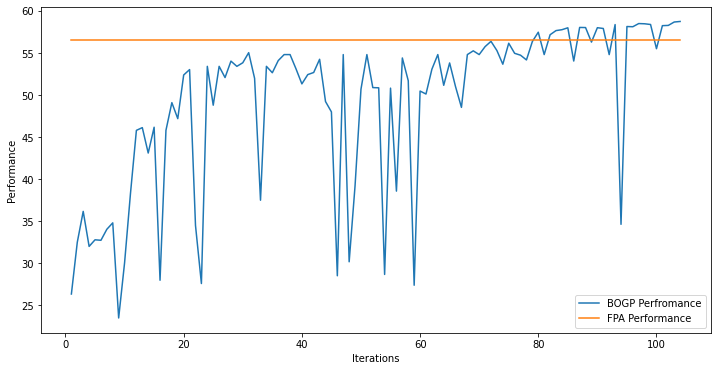

x_next is [ 27.77978725  29.93706527  19.92007634  21.06878618  29.94471136
  21.20267662  29.99966817  24.27425063  29.9812171  -29.93783877
  17.6518786   29.3470849   29.918946    29.99759887  29.9999999
  29.98813651 -15.83172283  22.530958    25.4843085   29.97697509]
f()=58.757258, actual=58.695
103


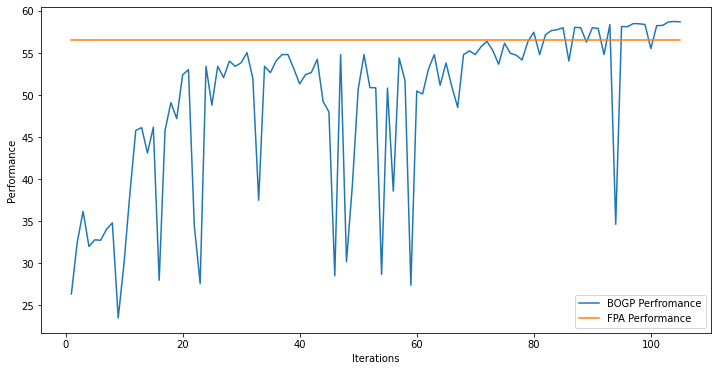

x_next is [ 28.37304481  29.81428345  20.47176088  21.2062899   29.31087448
  20.34692652  29.44998971  26.64761638  29.09744388 -28.98682653
  19.52499132  29.01943674  29.93129089  28.85349916  28.70127345
  29.01418679 -16.5681247   22.49287597  26.36434571  29.96139271]
f()=58.393731, actual=58.749
104


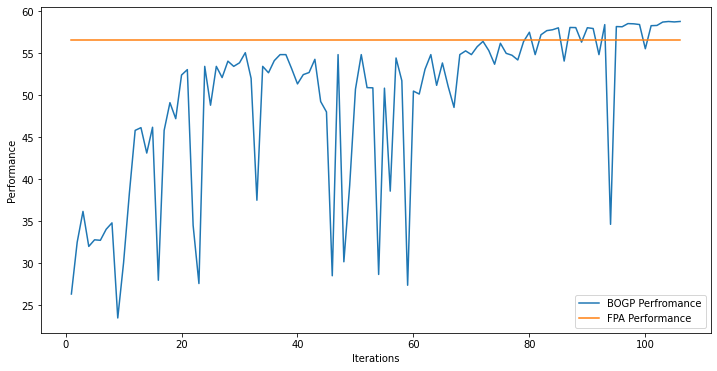

x_next is [ 28.8978332   29.99999997  20.00101962  21.44435403  29.99500876
  20.70327508  29.99910695  26.03970871  29.86176377 -29.41583282
  19.68282742  29.98303045  29.99999997  29.35994728  29.55621457
  28.74006882 -16.40200834  22.57159639  26.16153753  29.92398362]
f()=58.867496, actual=59.137
105


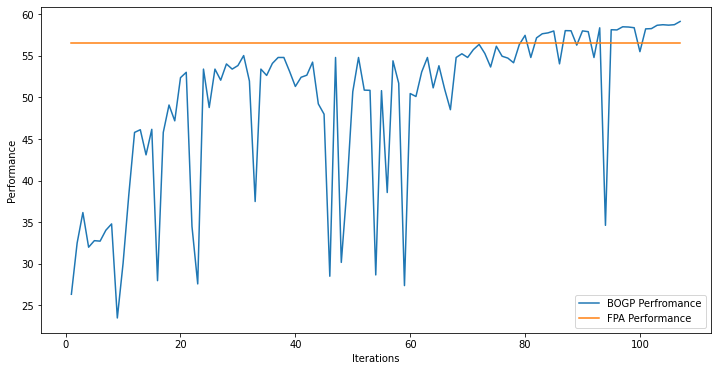

x_next is [ 29.5647584   29.91930211  18.9152773   21.2317854   29.90166236
  19.69920564  29.99770536  25.29124361  29.94834324 -28.28424695
  20.93272385  29.95869072  29.98819661  29.03522516  29.84771696
  23.82362471 -14.00328477  22.22417037  25.19515935  29.98562937]
f()=59.436764, actual=59.681
106


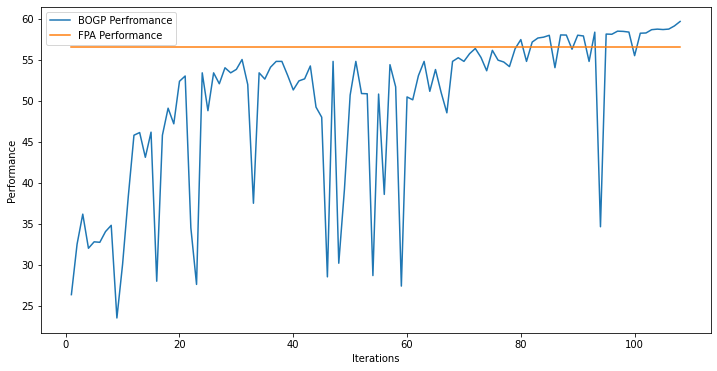

x_next is [ 29.5389486   29.94135874  19.07837509  21.14707988  29.79330761
  19.83081567  29.98895163  25.66040125  29.92808744 -28.54922267
  21.52629061  29.99822745  29.96026155  29.83191328  29.64311326
  22.54729671 -13.8853553   22.23205824  24.86720215  29.94634949]
f()=59.677554, actual=59.649
107


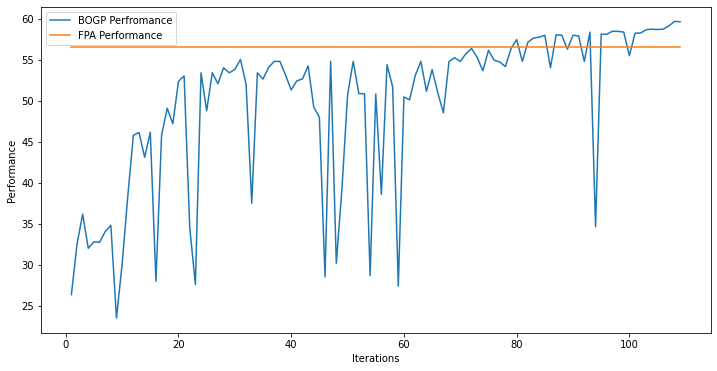

x_next is [ 29.76008968  29.99999998  18.32464164  21.15465089  29.99999993
  19.42188348  29.99999998  25.32716806  29.99999994 -28.20127763
  20.62790858  29.99999998  29.99999999  28.81440166  29.73508135
  22.6022559  -13.92514834  21.71907119  25.34420627  29.99999996]
f()=59.721225, actual=59.549
108


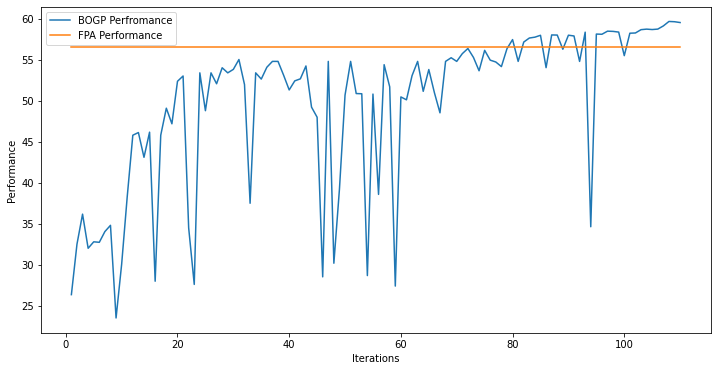

x_next is [ 29.98047775  29.9881476   19.17977196  21.79370511  29.870724
  20.97194979  29.96494376  25.5094221   29.90386646 -28.41533298
  23.75785226  29.90589036  29.97255153  29.59260184  29.99730794
  24.87860067 -12.96229413  23.66112711  23.1686739   29.90673042]
f()=59.841221, actual=59.745
109


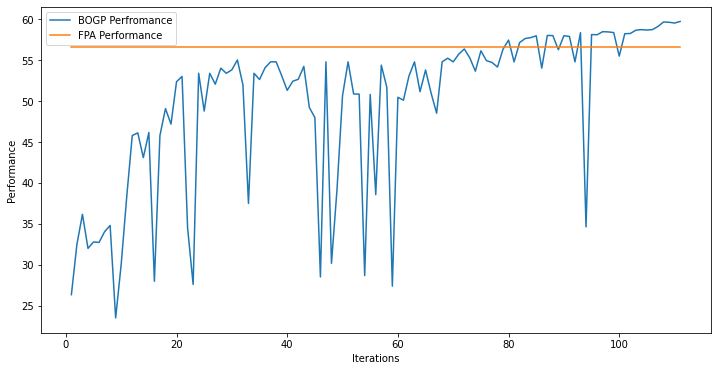

x_next is [ 29.2200985   29.99502033  20.48525161  21.48948165  29.22485653
  20.58812221  29.67025271  24.35135587  29.93848563 -26.87011162
  23.26999929  29.85268105  29.79181347  29.93227843  29.91363942
  25.55107559 -14.11775291  23.19746674  24.35991578  29.94205071]
f()=59.636550, actual=59.631
110


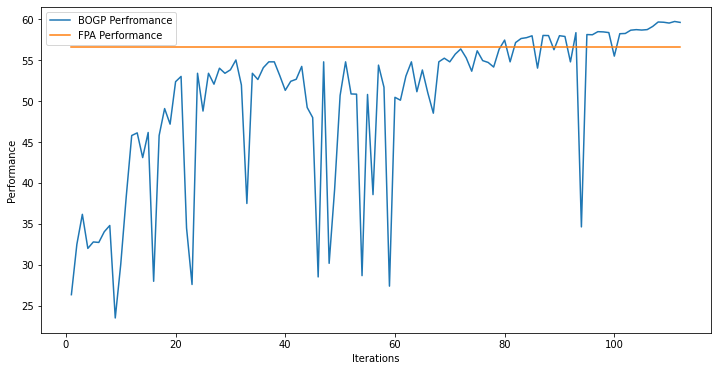

x_next is [ 28.27308306  29.83323155  21.58631997  20.57165878  29.13230708
  19.62519855  29.77329882  25.91880727  29.27180493 -26.74805613
  26.71004478  29.09511025  29.32752607  29.79210179  29.37998158
  22.61587261 -12.97293678  24.18131794  23.18649515  29.93901359]
f()=59.276162, actual=59.703
111


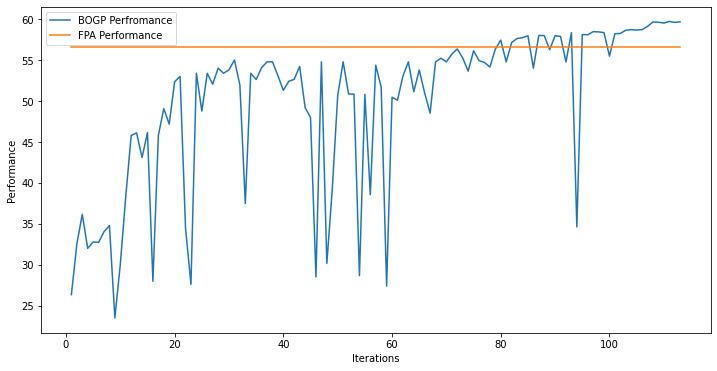

x_next is [ 28.02971063  29.99828762  23.14757764  19.77052692  29.94568821
  19.25082104  29.95861736  24.83724491  29.95843967 -26.96080367
  27.71226296  29.99350472  29.97806401  29.64086924  29.97782817
  22.28572509 -11.18723868  23.72538676  23.69021365  29.96794165]
f()=60.028488, actual=59.975
112


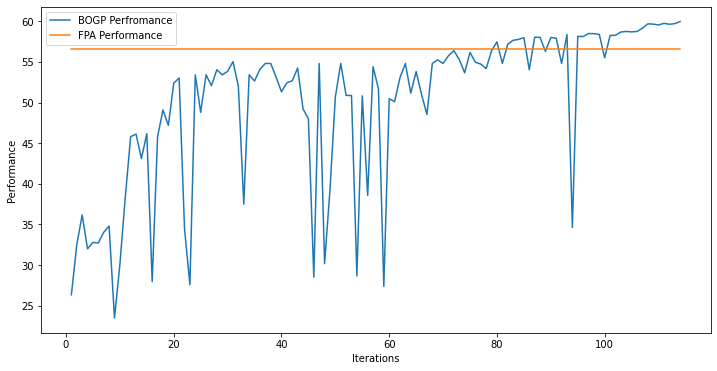

x_next is [ 29.7708355    7.75573128 -16.96825959  14.69024272  25.793469
  14.85522452  29.96870586  14.14209006  -6.44971505  26.20697824
  26.92637791 -28.74339238  29.24525485  27.43268612   0.91506887
  14.56411651 -26.16448948  22.66573475  29.01373546  24.66866983]
f()=59.682436, actual=48.246
113


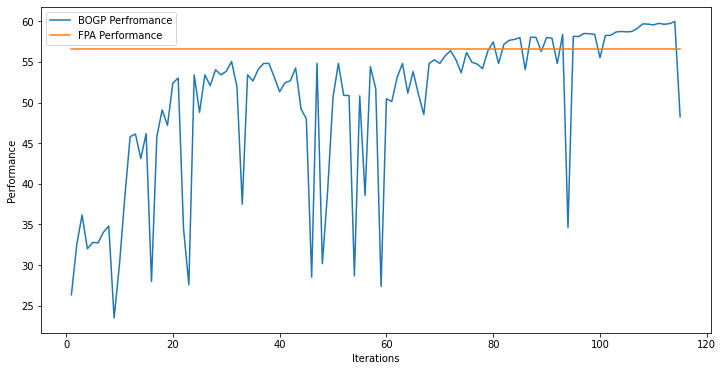

x_next is [ 28.69484723  30.          22.57087018  19.48441244  29.64851794
  19.58144468  30.          25.64941108  29.98921054 -26.97927548
  27.1865454   29.97547184  29.99555594  29.67940656  29.99297216
  22.09509373 -12.20169691  24.10092649  22.35650939  29.99948271]
f()=59.977358, actual=60.028
114


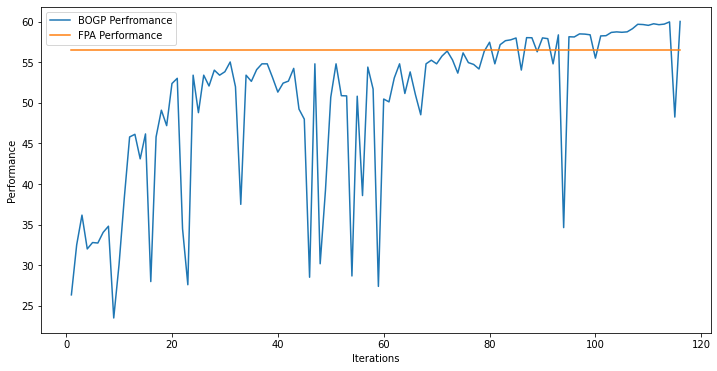

x_next is [ 28.60383851  29.99999994  22.42225183  19.33624306  29.99981063
  19.73878255  29.99997229  25.67082243  29.99996352 -26.68905959
  27.12548959  29.99999524  29.99999996  29.3484099   29.99987249
  22.19649138 -12.23771308  24.39571406  22.53541505  29.99999977]
f()=60.046528, actual=60.061
115


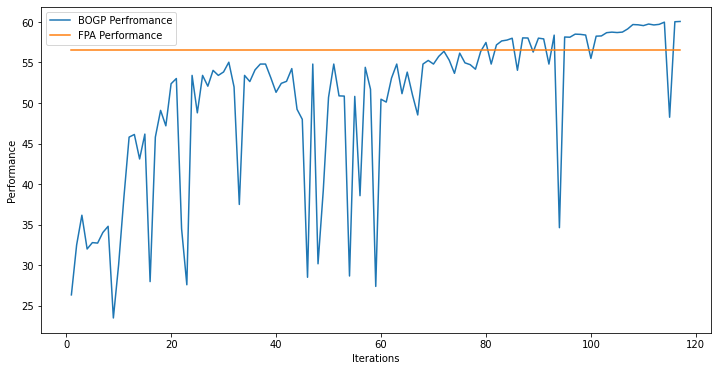

x_next is [ 28.84093083  30.          22.19225145  18.30152691  29.62860621
  19.29965942  30.          25.25842759  29.99915386 -26.51103593
  27.03446216  29.92767689  30.          29.40534098  30.
  21.85317879 -12.03041907  24.63564539  22.52513585  29.99932096]
f()=60.025408, actual=59.938
116


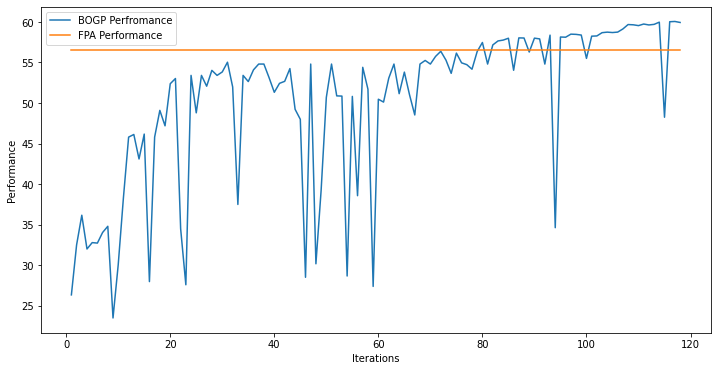

x_next is [ 27.86233361  29.99999994  22.93821562  20.41409856  29.9999998
  20.54567866  29.99999993  26.59826173  29.99999983 -26.30171739
  27.08245048  29.9999998   29.99999997  28.78642786  29.99999994
  22.40906938 -12.48553434  24.02721573  22.44331873  29.99999977]
f()=60.118817, actual=60.222
117


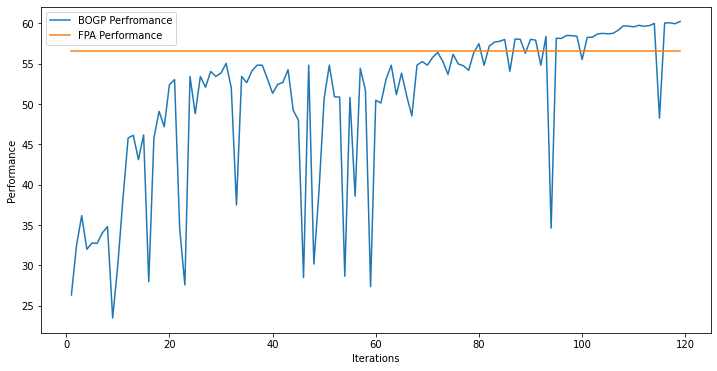

x_next is [ 27.20581012  29.98511851  24.00752451  20.46189036  29.98650008
  21.5932798   29.9787018   27.41250068  29.98400169 -24.53041399
  27.26002862  29.90425444  29.99472547  27.87424645  29.99954005
  22.31293487 -12.07799     23.49387494  21.94545024  29.95754922]
f()=60.285331, actual=60.319
118


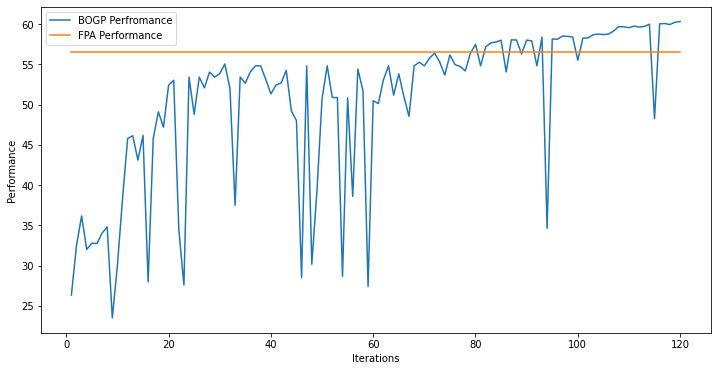

x_next is [ 27.09108677  29.98576818  25.02618653  20.34681089  29.96767627
  21.88232635  29.91254864  28.3229036   29.92575028 -23.87514556
  28.31653791  29.95667986  29.95447492  27.85368069  29.99675722
  21.40922284 -10.60958606  23.026294    20.83118247  29.98736004]
f()=60.313070, actual=60.138
119


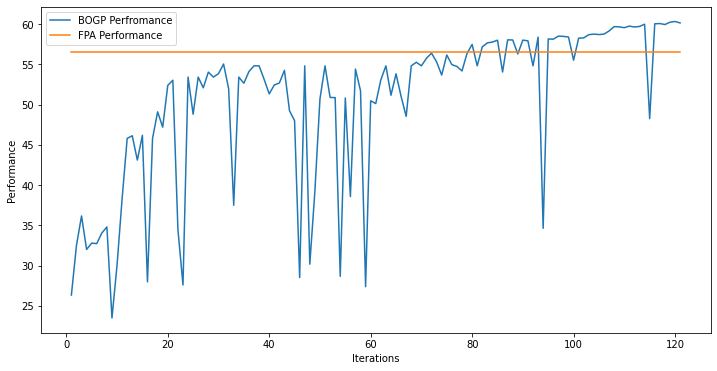

x_next is [ 27.00171781  29.99999995  23.79657245  20.29622513  30.
  22.23311885  30.          26.78060041  29.81876693 -24.68552092
  26.55308743  29.96892397  30.          27.53336761  30.
  22.32365055 -12.47017605  23.08060553  22.35698347  29.97598316]
f()=60.343001, actual=60.315
120


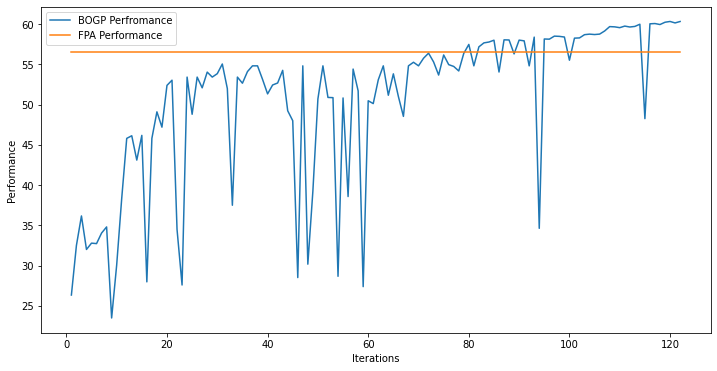

x_next is [ 26.90080844  29.99999999  23.90257767  20.27783945  29.99999986
  21.58682107  29.99999999  27.25971399  29.99999994 -24.35946705
  26.88073382  29.99999521  30.          27.61720313  29.99999989
  22.4709175  -12.61288449  23.42322951  22.29070081  29.99876436]
f()=60.343278, actual=60.365
121


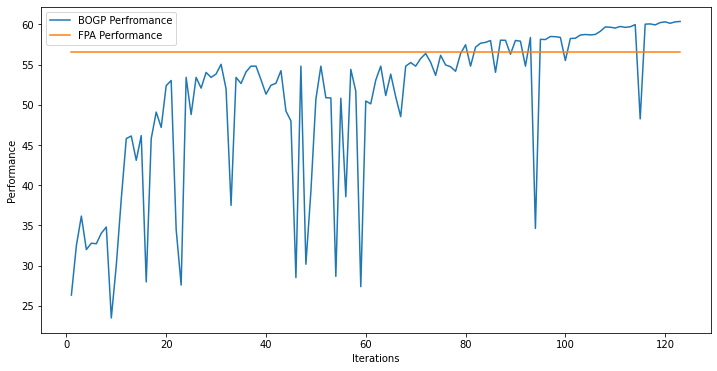

x_next is [ 26.44736477  29.99999984  23.73394488  20.26755127  29.76804877
  20.94217203  29.99999984  27.34330735  29.99999984 -23.52875517
  26.79509113  29.99998816  29.99999999  27.70610289  29.97337872
  22.48721272 -13.53354406  22.55327152  22.43319733  29.99325675]
f()=60.356587, actual=60.390
122


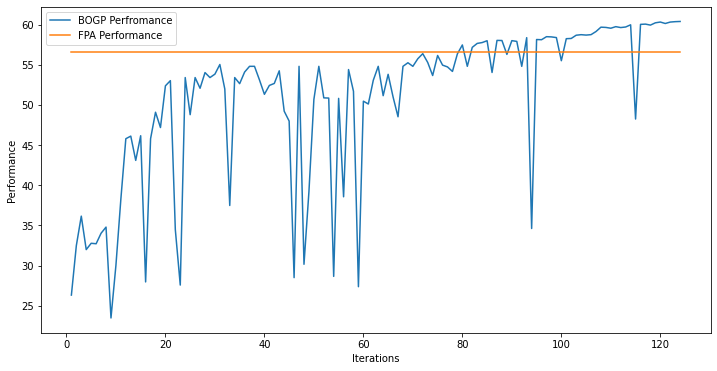

x_next is [ 27.41284535  26.76320657  11.39666462  25.44241665  27.35683491
  25.72718139  28.58541019   9.35735324  20.84993563  11.52438707
  25.79940682   4.88019755  28.67221268  19.78994562  18.74334498
  23.30708118 -21.18805313  13.1628233   26.28493795  27.19039391]
f()=65.773989, actual=52.651
123


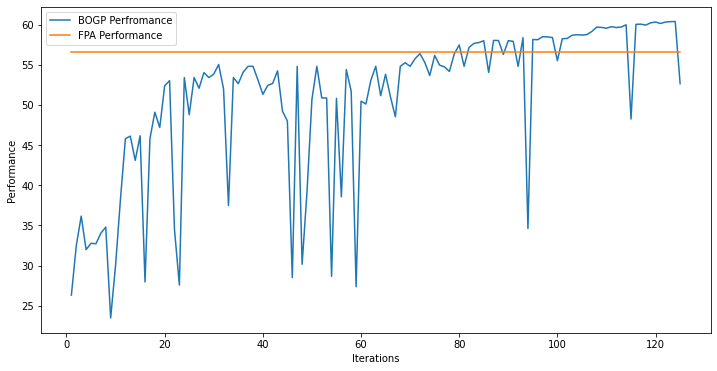

x_next is [ 26.01770731  29.99267894  23.79538248  20.51517401  29.98054779
  20.57616382  29.97833889  27.25848303  29.96810357 -23.18290138
  26.90674748  29.9787334   29.98757561  27.48343047  29.99923503
  22.71949055 -13.29119012  22.90562743  22.18863728  29.99935371]
f()=60.392610, actual=60.350
124


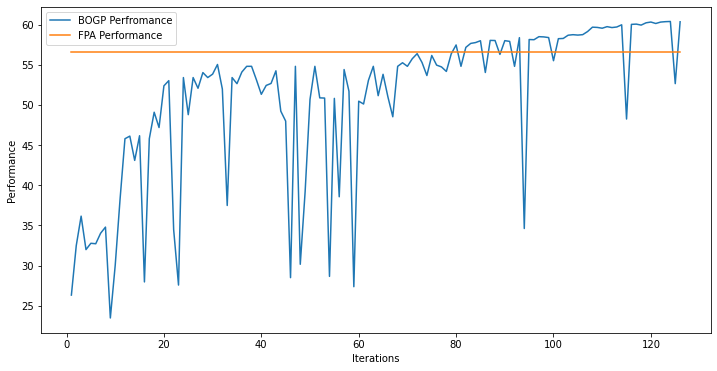

x_next is [ 26.69013281  29.99603682  23.63567285  20.16242016  29.99216431
  21.3718968   29.99446471  28.10315561  29.98795692 -23.98047173
  27.13302695  29.97831391  29.99950011  27.85714365  29.98715829
  22.44357908 -13.55398637  22.12362883  23.10135446  29.98643986]
f()=60.413392, actual=60.301
125


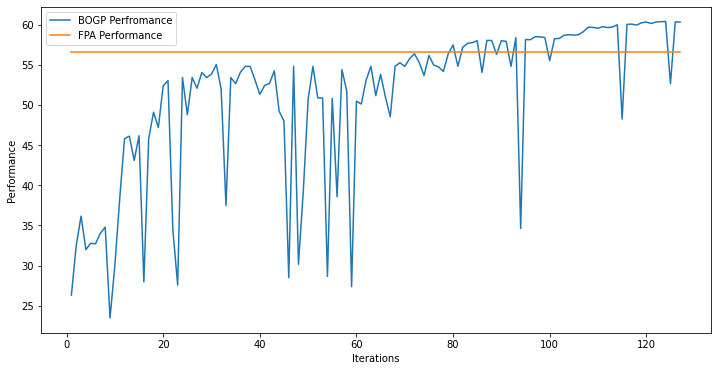

x_next is [ 27.21680244  29.96892964  24.39981222  20.37017175  29.31922907
  20.71823393  29.99912124  26.60037598  29.99312531 -22.90878245
  26.69715718  29.96236051  29.98742899  27.47644785  29.99771551
  21.2171734  -13.60303948  23.12509552  21.86608769  29.95643534]
f()=60.418855, actual=60.305
126


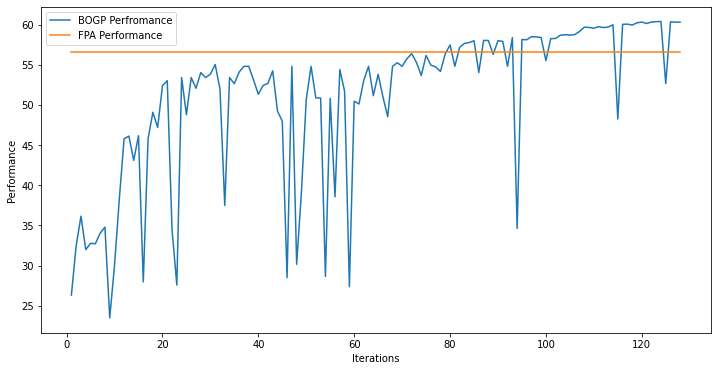

x_next is [ 26.52049631  29.99999999  23.68093254  19.92302264  29.8018715
  21.07857258  29.99999999  26.89180295  29.99999999 -23.80728887
  26.43544877  29.99999993  29.99999998  28.18989803  29.99999986
  22.53326144 -13.3558322   22.63778364  21.69267649  29.99977126]
f()=60.422513, actual=60.435
127


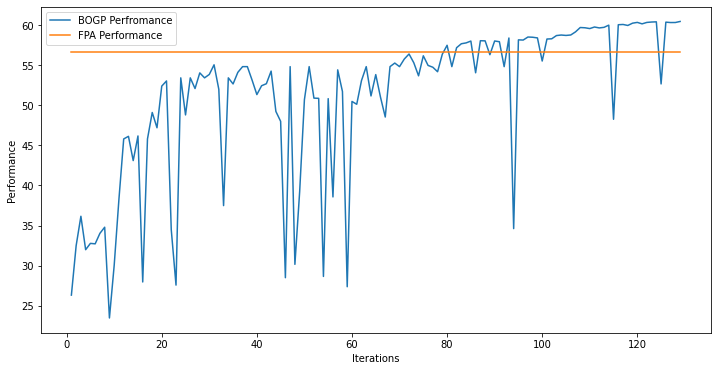

x_next is [ 26.51926782  29.99299684  23.52960862  19.78492111  29.92114502
  21.07056968  29.99899393  26.8656288   29.96976083 -23.81559432
  26.15859879  29.99667785  29.98856982  28.22371158  29.96527995
  22.66881587 -13.45837557  22.61433696  21.598465    29.94588355]
f()=60.426023, actual=60.449
128


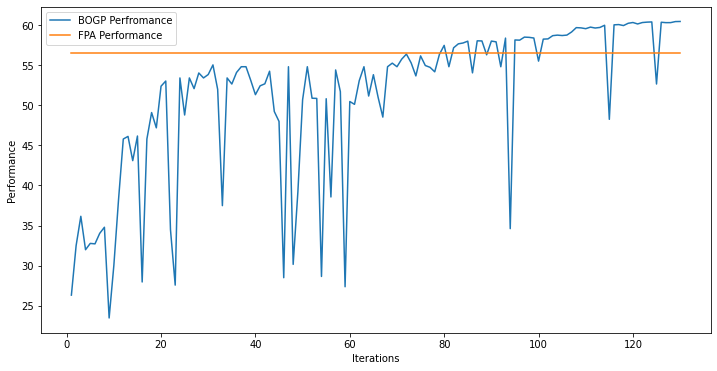

x_next is [ 26.78196865  29.99995524  23.3583909   19.60470716  29.99267809
  20.89267902  29.99987983  27.2158045   29.9999071  -23.7196246
  25.2248485   29.99847896  29.99997939  27.81089685  29.99991392
  22.65630954 -13.53976816  22.50209215  21.26024002  29.88574221]
f()=60.479286, actual=60.475
129


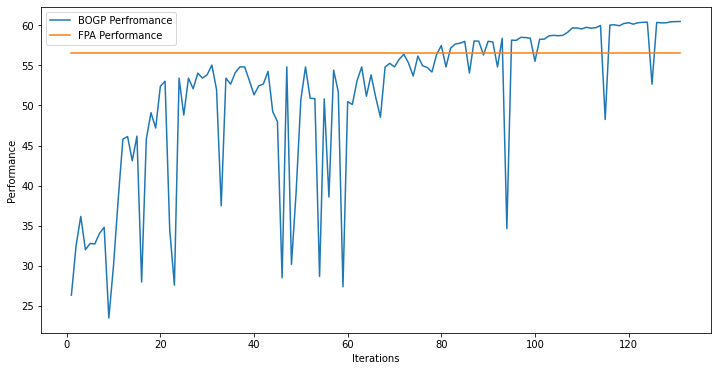

x_next is [  9.02145867  13.54120942 -12.1116647    9.866632    18.30427603
  28.96699787  29.072736    26.39873098  13.85014209  17.31399697
   8.38496094   6.72670042  28.02955096  28.44591241  -5.71509018
 -21.72391037  29.18452605  29.01949166   6.25357974   1.9638305 ]
f()=51.255474, actual=45.863
130


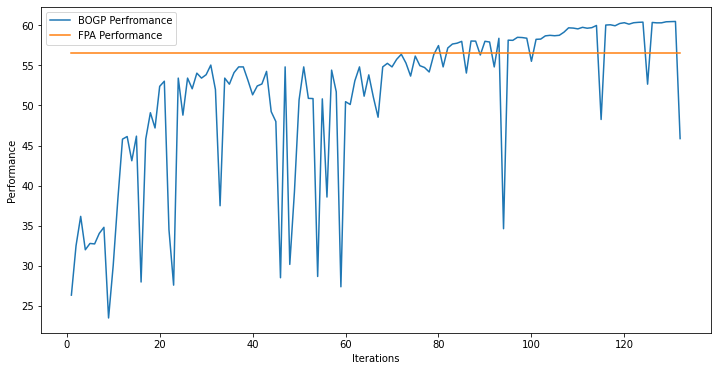

x_next is [ 26.85805355  29.94512129  23.48125341  19.6839532   29.98005179
  20.73914712  29.96602726  27.25049596  29.91881979 -24.02800585
  25.29324024  29.89794965  29.90858824  27.92190897  29.86660805
  22.30431753 -13.62633079  21.74235269  21.2714095   29.34213768]
f()=60.427785, actual=60.531
131


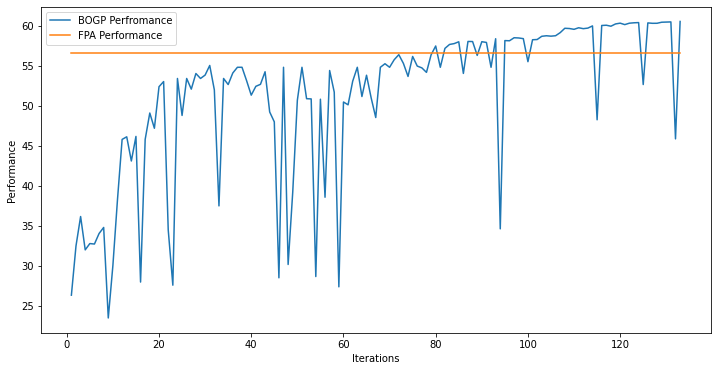

x_next is [ 26.85974374  30.          24.72808571  19.38513221  30.
  20.18836152  29.99976041  26.58153709  29.97365599 -24.53766108
  25.91794627  29.96013629  30.          27.39348254  29.87187213
  21.84320175 -13.28781839  21.07238249  20.41283754  26.00521058]
f()=60.714792, actual=61.095
132


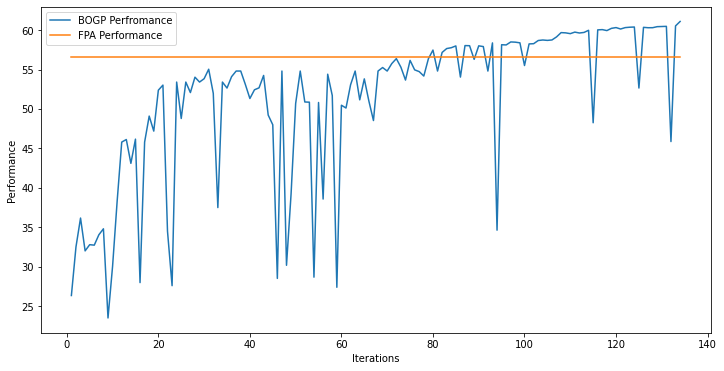

x_next is [ 26.82709579  27.89547618  25.75747875  27.29290937  11.97805544
  21.34477434  28.33749275  20.4792698   20.14212087 -22.40335398
  23.77890088  19.4307271   28.25244224   0.14066768  22.19973468
  24.19087557 -19.19708787  24.45235688  27.99047873  21.3009628 ]
f()=51.357976, actual=46.853
133


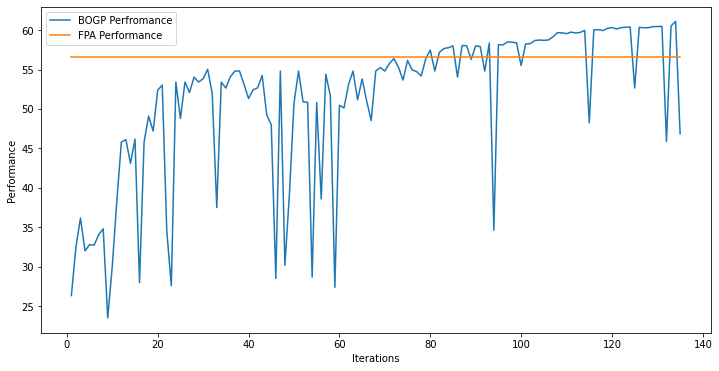

x_next is [ 26.60932606  29.99186295  26.45794133  18.37525116  29.96737382
  20.11106175  29.99474382  26.18792636  29.97243386 -24.02122321
  27.53777692  29.97806722  29.99976028  27.32974852  29.97837176
  21.0284289  -12.54155829  20.252452    18.57903253  21.10649618]
f()=61.329954, actual=60.927
134


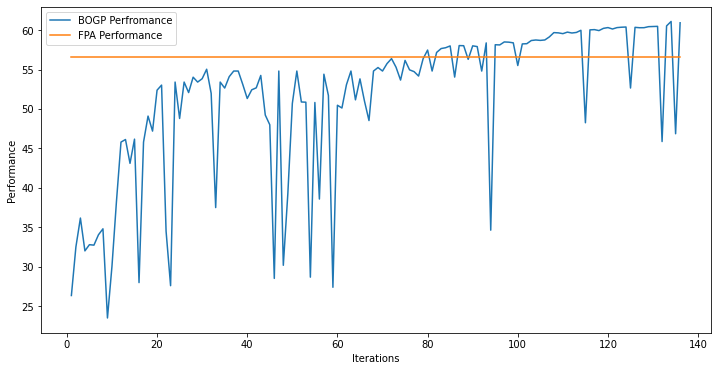

x_next is [ 26.62679478  29.99909117  24.97396681  19.24237737  29.97033569
  20.05457995  29.98990247  26.52853971  29.99056916 -24.95742075
  25.99504444  29.99477697  29.98673693  27.12495991  29.98545096
  22.06864362 -13.27167399  21.33387902  19.9550769   24.16932379]
f()=61.167101, actual=61.147
135


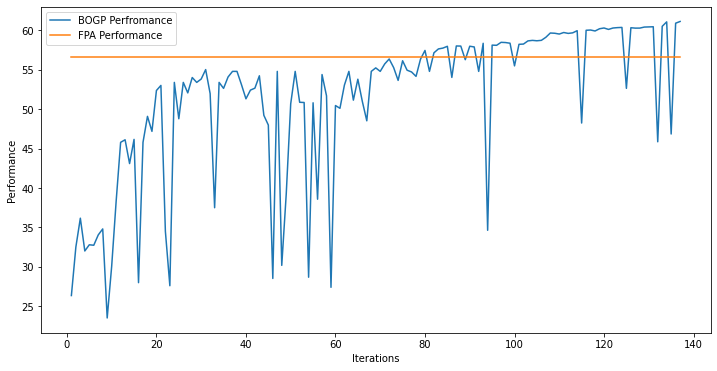

x_next is [  1.02638676  -4.85108742  29.75126097  29.1026377   -8.27183239
  14.38650724  -4.9579407   20.49617659   4.19090868 -10.40087619
  21.85600154 -18.27890802  20.81752862   5.64811228  -7.4073928
 -22.39477436  -1.34821734 -13.8471207  -18.97499235 -25.27022068]
f()=51.466493, actual=25.877
136


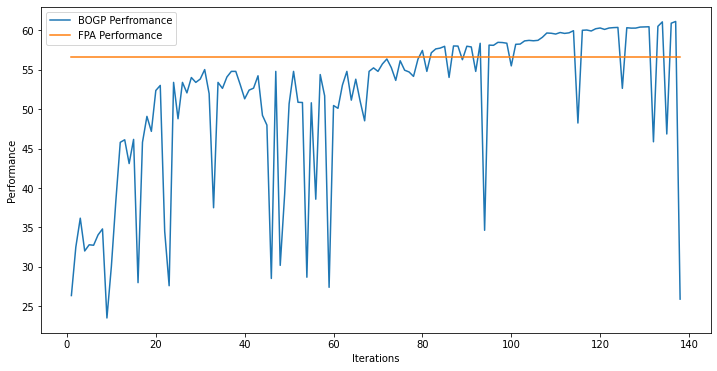

x_next is [ 26.78259254  29.99999999  25.08471219  19.16101936  29.99999987
  20.072991    30.          26.36764234  29.99999591 -24.4693321
  26.22142323  29.99999998  29.99999999  27.23541886  29.99988823
  21.99486157 -13.3360207   21.02629737  20.09533897  24.46880748]
f()=61.161825, actual=61.167
137


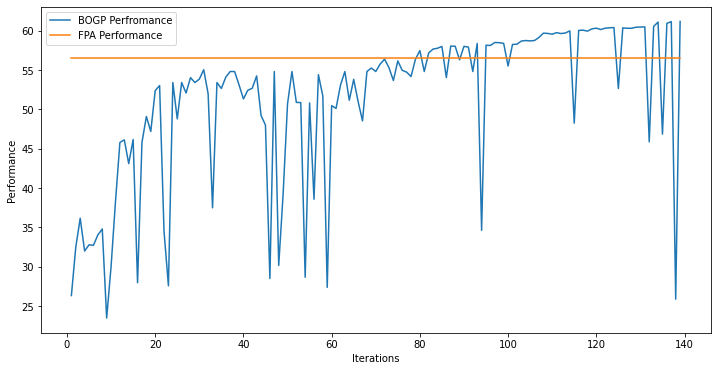

x_next is [ 26.90577907  29.99520923  25.14547303  19.27174575  29.97799708
  19.84939499  29.99571739  25.99529058  29.97731473 -24.32668716
  26.28670414  29.98097486  29.99750791  27.09099454  29.99000906
  21.97532758 -13.31079242  20.8833477   20.1348492   24.40687491]
f()=61.158174, actual=61.139
138


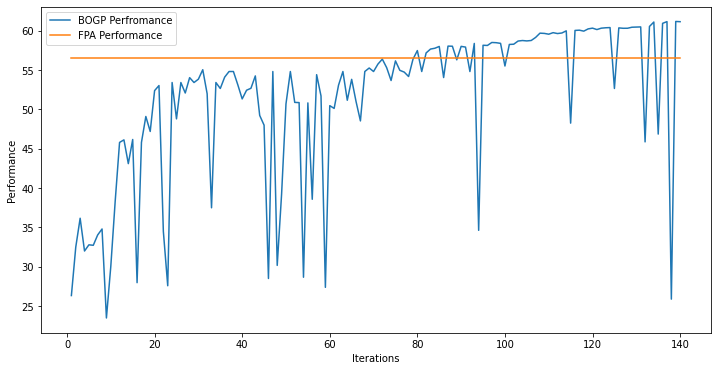

x_next is [ 26.63576478  29.99999996  25.1400014   18.86607949  29.99999984
  20.49059247  29.99999998  26.8387043   29.99982875 -24.31417147
  26.29875875  29.99999991  29.99999999  27.62142599  29.99999758
  21.99177746 -13.49087935  21.147039    20.15426721  24.36833883]
f()=61.182957, actual=61.212
139


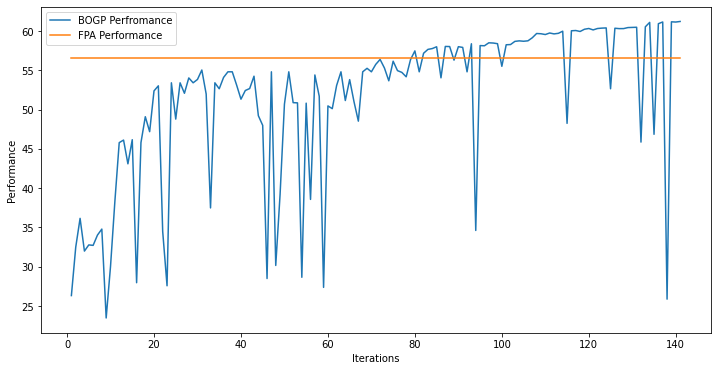

x_next is [ 26.85429328  29.98695738  25.8849427   18.20648437  29.76710522
  21.14368153  29.99056711  27.0663904   29.92102527 -23.53789114
  26.88237997  29.93241691  29.89065751  28.4978734   29.88043201
  22.4644007  -13.80764758  20.85861495  20.47411177  23.64113336]
f()=61.161818, actual=61.202
140


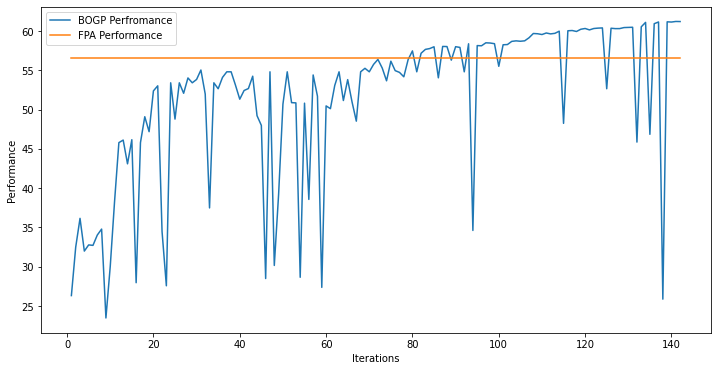

x_next is [ 26.69870866  30.          25.69334687  18.55976928  29.9975285
  21.02045553  29.99999999  27.07271476  29.99999998 -23.72176676
  26.39310667  29.99999999  29.99999999  28.45607764  29.93454545
  22.31142711 -13.63678686  21.45952336  20.68858329  23.73125696]
f()=61.254059, actual=61.257
141


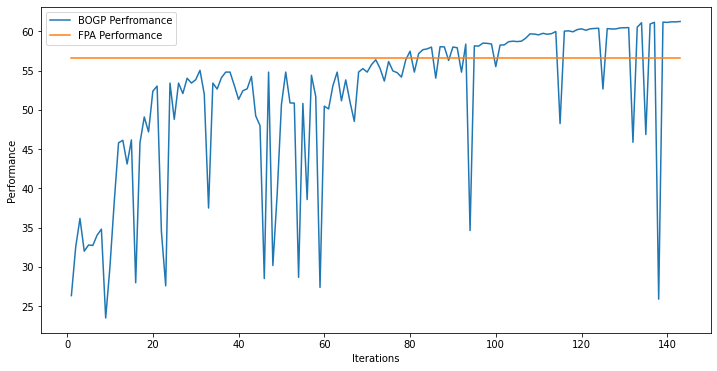

x_next is [ 24.47338011   1.61674479  27.27508758  25.79847977 -20.67953699
  -7.09228826  14.50248896  -5.92691752   2.95211783 -29.75838668
  14.16365474 -17.47775306   0.4518131   17.10596293   1.81863693
  29.79414113  -6.20964957  -7.14570122   4.0473146   11.76400365]
f()=51.627204, actual=32.136
142


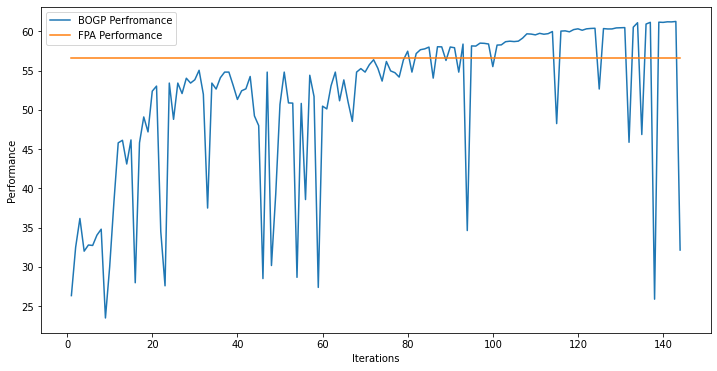

x_next is [ 26.62247365  29.99999995  25.72583602  18.6188464   29.99998893
  21.01105456  29.99999998  26.99623842  29.9998201  -23.75361217
  26.34912878  29.99980289  29.99999998  28.46455287  29.99990517
  22.32373487 -13.74579945  21.50073545  20.74222316  23.73151868]
f()=61.258736, actual=61.271
143


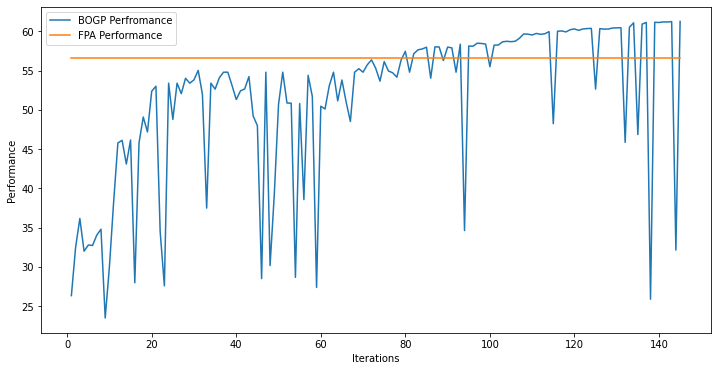

x_next is [ 25.96019043  29.9839411   26.26478062  18.70033671  29.96590678
  21.23553855  29.99953887  26.53316944  29.99202264 -24.03848328
  26.46022834  29.97565507  29.99296884  28.73374166  29.9780868
  22.18472528 -14.53119627  21.72872306  21.01185153  23.66728483]
f()=61.296308, actual=61.344
144


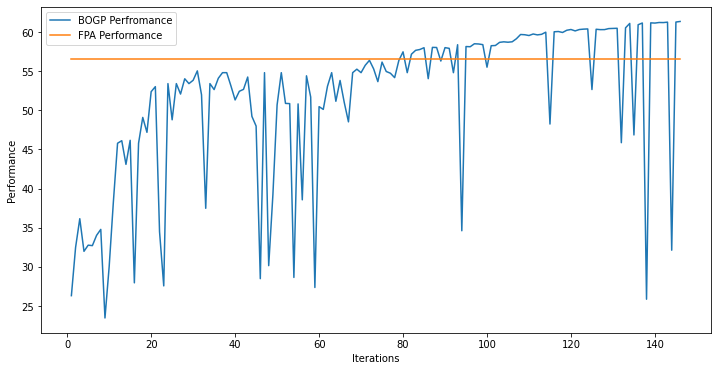

x_next is [ 25.5459822   29.99588074  27.04070886  18.41304937  29.99497652
  21.32716095  29.99792918  26.2703593   29.99489439 -24.27755709
  26.48694998  29.99734745  29.99714434  28.73277078  29.99483956
  21.91746199 -15.16906169  21.59948584  21.21131393  23.43418012]
f()=61.369809, actual=61.445
145


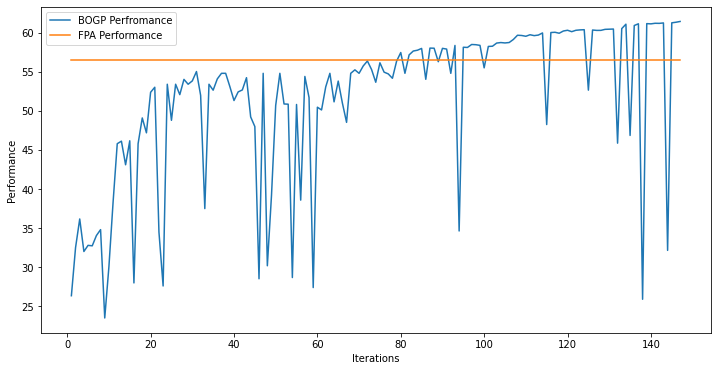

x_next is [ 25.10645857  29.99372474  29.26806198  17.61823302  29.99178982
  21.03654851  29.99045217  26.08268955  29.99516625 -24.24474078
  26.17112401  29.98380537  29.9994141   28.61614335  29.97579497
  21.12280752 -15.38820845  21.11902398  21.3342467   23.11022859]
f()=61.526483, actual=61.733
146


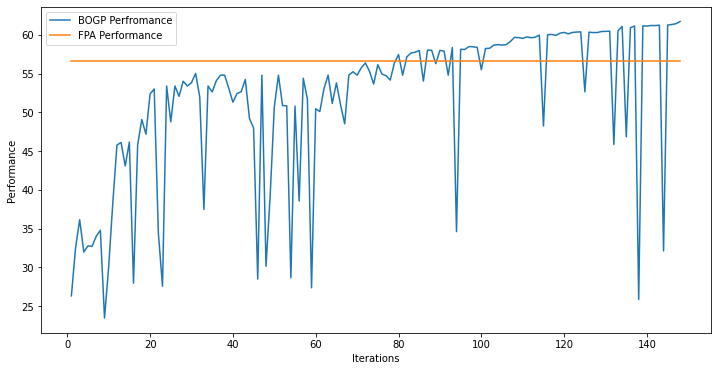

x_next is [ 24.38875272  29.99943855  29.99221265  16.55800969  29.98803117
  20.44735556  29.99866029  26.12700466  29.96668157 -24.25494853
  25.30417574  29.99542781  29.99688876  28.65899183  29.98927431
  20.37834141 -15.45309065  20.62040365  21.4409312   23.121529  ]
f()=61.838486, actual=61.853
147


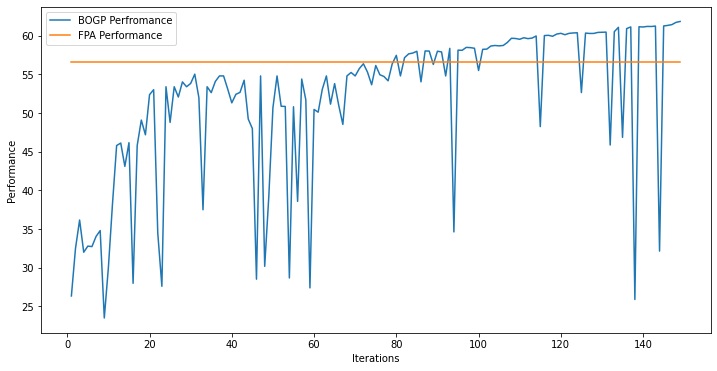

x_next is [ 24.12701985  29.99999153  29.99940179  16.22256801  29.99973959
  20.39219268  29.99995271  26.14175638  29.99991395 -24.01617329
  25.15945161  29.99993757  29.99999081  28.74840785  29.99965539
  20.1300255  -15.2637244   20.48536012  21.52722443  23.06182233]
f()=61.862162, actual=61.840
148


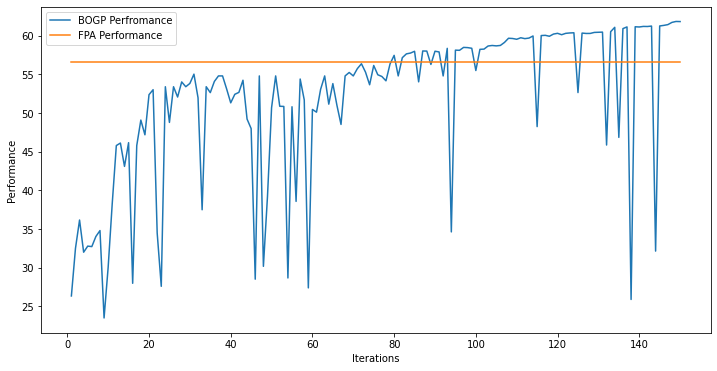

x_next is [  3.67735662  21.51314745 -19.19857583 -15.51581517 -30.82894154
  -6.17813477  11.01576845   0.86225356  29.24650288  18.26088064
  26.6562322   20.05430885  12.35912864  20.73118694  -7.47718987
  16.02433413   7.32652635  -7.75679055 -29.93025569 -10.96666704]
f()=37.332389, actual=28.491
149


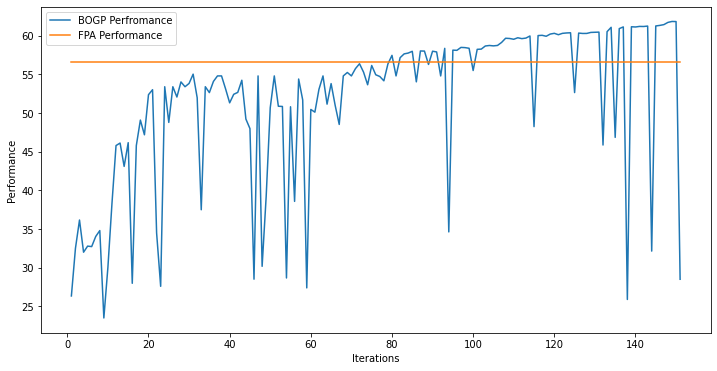

x_next is [ 24.66442707  30.          30.          16.57683907  30.
  20.1753122   30.          26.23068003  30.         -24.66306988
  25.05456839  30.          30.          28.47047185  30.
  20.40535327 -15.81885814  20.65612682  21.20778532  23.18698912]
f()=61.868359, actual=61.884
150


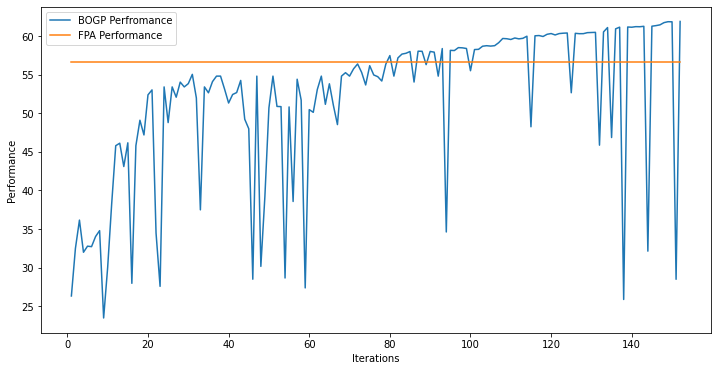

x_next is [ 24.90042036  29.99999998  29.99999992  16.4368702   29.9999897
  19.94938386  30.          26.40105176  29.99999988 -24.84702052
  24.78036152  29.99999995  29.99999999  28.35181878  29.99999978
  20.2362963  -16.05807261  20.637346    20.97016947  23.17614074]
f()=61.891437, actual=61.899
151


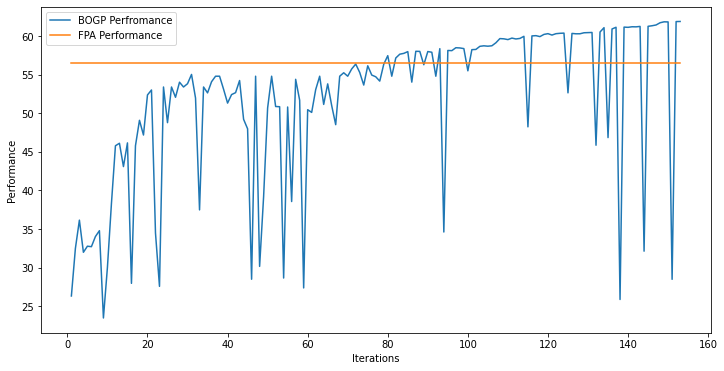

x_next is [ 14.36689049  28.04038147  -9.78990151 -24.46337383  15.68965662
   8.13488232 -28.43472274 -13.18734779  18.86932079  21.20332262
  -8.29764748   2.55048921  28.98111758 -11.86808432 -11.59471609
 -26.38942887 -14.86723987  11.39945418  20.59296393  24.57902712]
f()=51.872541, actual=34.758
152


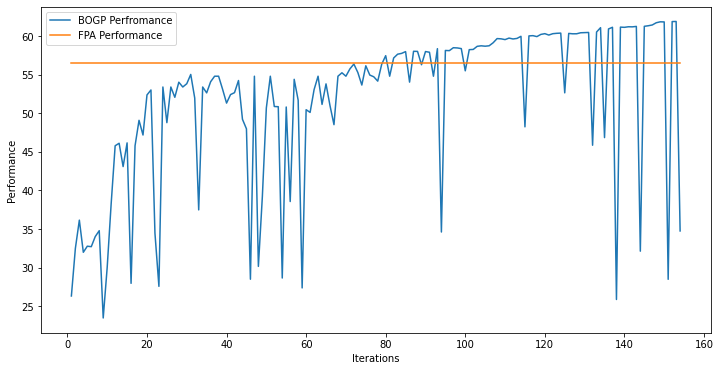

x_next is [ -4.77980348  22.43554794 -27.82747763 -21.50565578  12.98146203
  15.56118209  14.77014938  -6.92069921 -22.44075969 -19.96605289
 -23.08759245 -21.49924338 -25.01377062 -25.70761261 -17.16807099
 -30.29420912  24.53058051 -17.16721669 -21.20313425  24.05641414]
f()=51.761226, actual=26.520
153


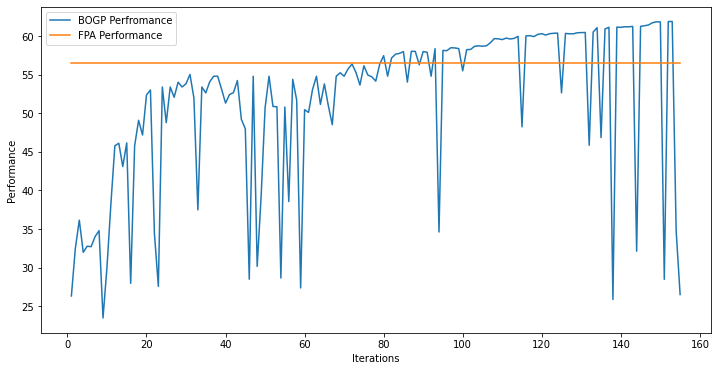

x_next is [ -5.24615779  12.48738698 -23.68927341  15.93947279  -2.50851261
   1.60930774 -27.3509761  -26.85329736   1.15198738 -22.85044221
  21.87397495  27.12105721   1.3691104  -18.5234338   -2.87021902
  25.14733193 -17.195012     0.80196978 -29.2831231   -0.41510611]
f()=51.610899, actual=19.975
154


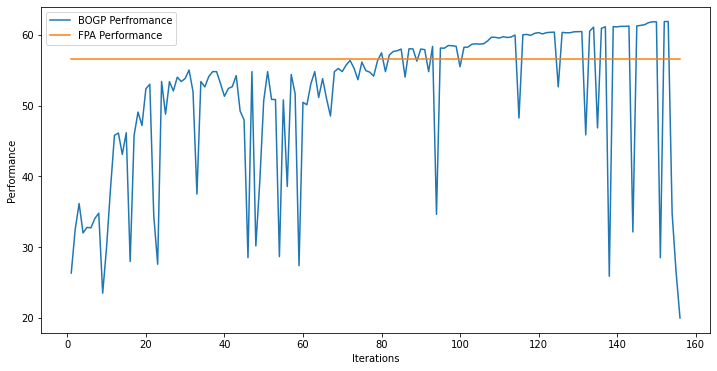

x_next is [ 25.30514884  17.09569249  18.51169665   5.94472361  18.19289024
 -10.44380863  -1.29499154 -26.00733092  11.25964709 -18.37144917
  16.59699431 -15.21145799   8.10954037   8.47904338  26.58478693
   0.8702692   -1.48246522 -12.98342881 -20.99348565  -5.34011742]
f()=51.394432, actual=28.918
155


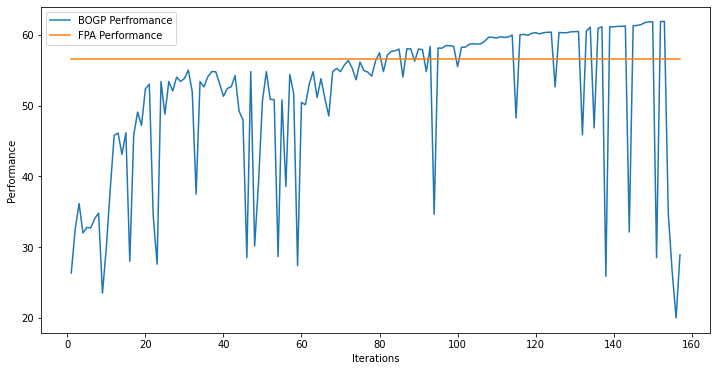

x_next is [-22.86878652  -6.29360626  -9.02478926  16.45968812  25.44140457
 -26.72174998  -2.76089577 -30.51663457  24.02990589  -3.95527633
  -4.42569796  13.91188433  -2.54867978   1.27525453  21.429255
  13.80072216 -10.1575714    5.66860001  -7.01270233   8.32376664]
f()=51.250921, actual=28.968
156


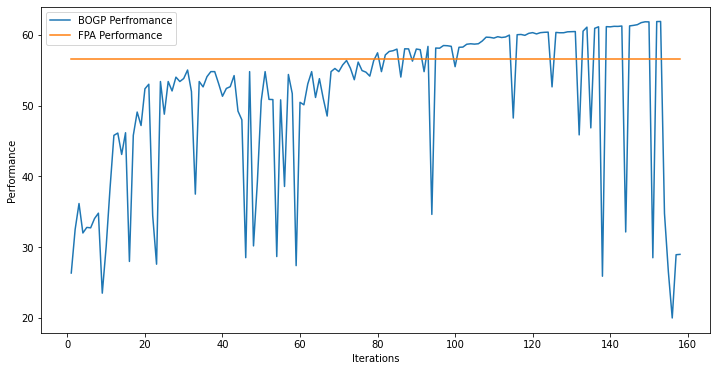

x_next is [ 25.08642938  29.99999994  29.99999987  16.2947206   29.99644476
  19.9403313   29.99999993  26.64955007  29.99999993 -24.74696064
  24.5570234   29.91899634  29.99703862  28.6845713   29.9476215
  19.89845643 -16.27074641  20.69102728  20.7526397   23.04783241]
f()=61.893888, actual=61.882
157


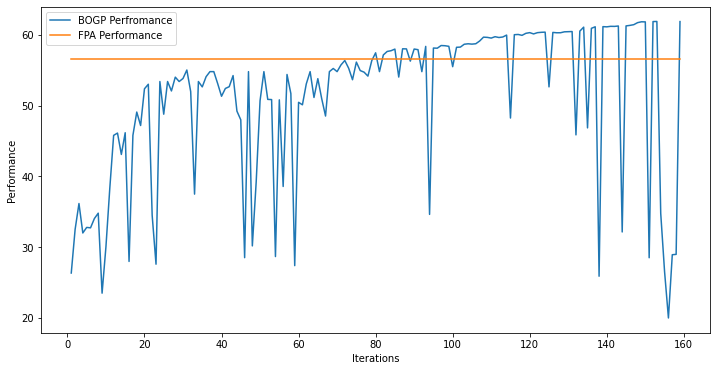

x_next is [ 27.74655592  26.42144623  29.22001259  29.96777393  27.98601835
  25.36226243  29.78010515  25.81967953  29.75942637 -28.25376766
  27.77048872  29.77418002  26.75921146  26.08310021  29.47052884
  28.9647856  -30.17138757  26.5031917   25.85051852  29.99160104]
f()=51.177321, actual=55.058
158


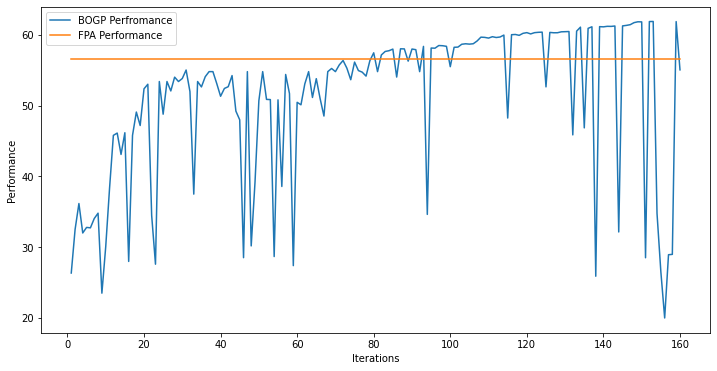

x_next is [ 30.  30.  30. -31.  30.  30.  30.  30.  30. -31.  30.  30.  30.  30.
  30.  30.  30.  30.  30.  30.]
f()=60.298379, actual=55.986
159


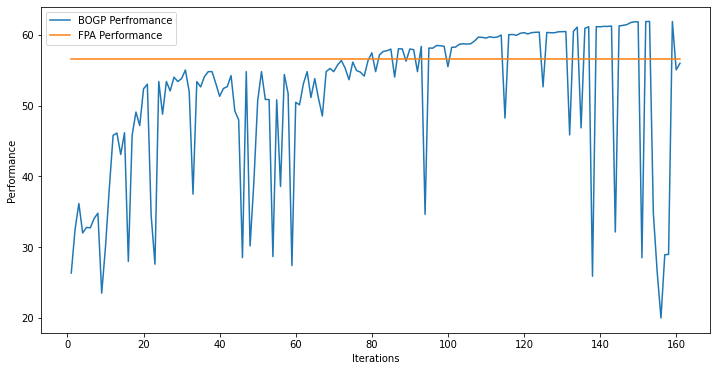

x_next is [ 27.59433078  29.44713803  16.16113558  23.3388683   29.05637592
  24.74531931  29.71992754  25.06024826  21.05747359  -3.60887988
  25.13099815  18.68558038  29.84044093  24.06413864  26.11165748
  27.1868848  -23.73694846  20.92347559  27.33478376  27.39091187]
f()=63.677650, actual=56.194
160


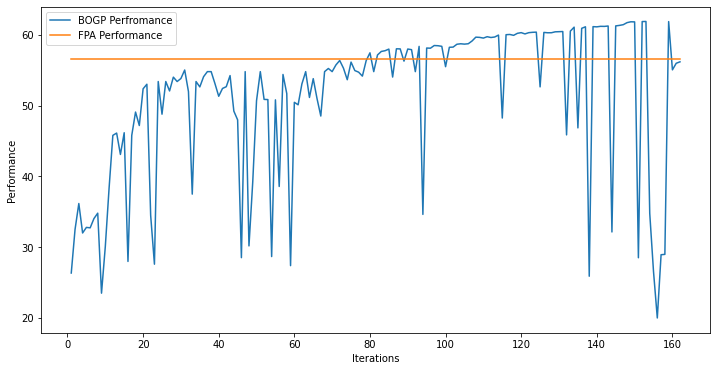

x_next is [ 25.12598363  29.99999998  29.99999994  16.21522862  29.99999998
  19.99875141  29.99999999  26.69907783  29.99999988 -24.6853167
  24.67306499  29.99737493  29.99866521  27.86566079  29.99749447
  19.99915761 -16.14818602  20.77495693  20.88667298  23.20744385]
f()=61.903907, actual=61.926
161


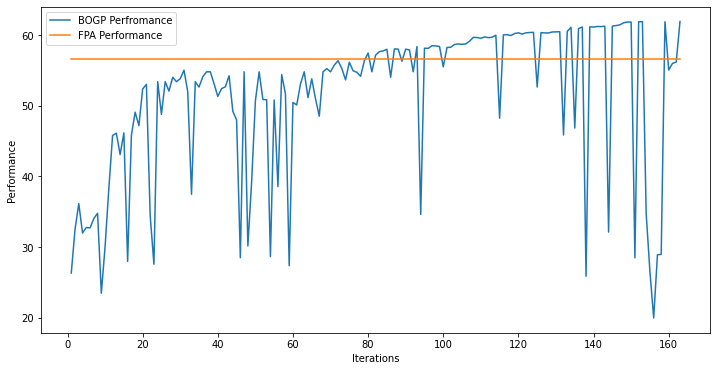

x_next is [ 25.25143238  29.99863112  29.98985025  15.94451397  29.99856883
  20.1732379   29.99873023  26.91125455  29.99495558 -24.42521861
  24.73571419  29.99695654  29.99835951  27.13540426  29.99866587
  19.90459426 -16.24430798  21.03991074  20.91428608  23.15263608]
f()=61.935674, actual=61.938
162


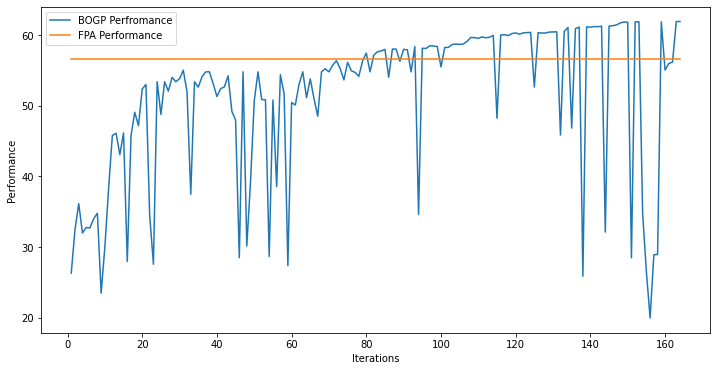

x_next is [ 29.15179274  27.90188462 -17.07746628  26.9082008   28.85173828
  19.97537746  29.30981767  23.36147266  17.43154505   8.98295577
  26.42627968 -20.70412268  29.56913323  29.30534881  26.60311315
  27.44589408 -18.48504445  19.15717861  29.12949478  28.51035908]
f()=64.392942, actual=57.144
163


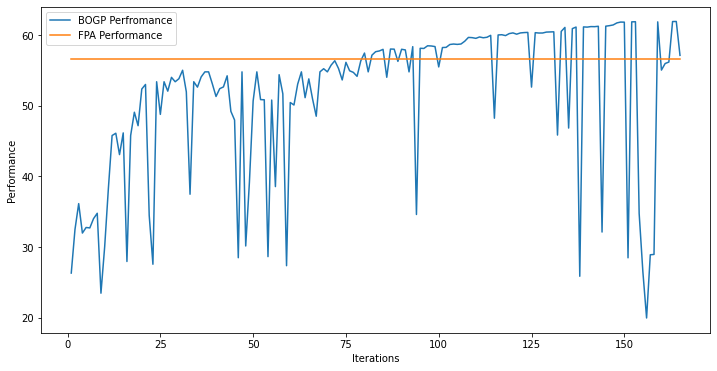

x_next is [ 25.16856927  29.99999996  29.99999993  15.84883168  29.99989974
  20.18040532  29.99999999  26.96136531  29.99999977 -24.55543938
  24.78503252  29.99997334  29.99999987  27.15381222  29.99999911
  19.93700277 -16.26568848  21.03854717  21.00458732  23.17029056]
f()=61.940879, actual=61.931
164


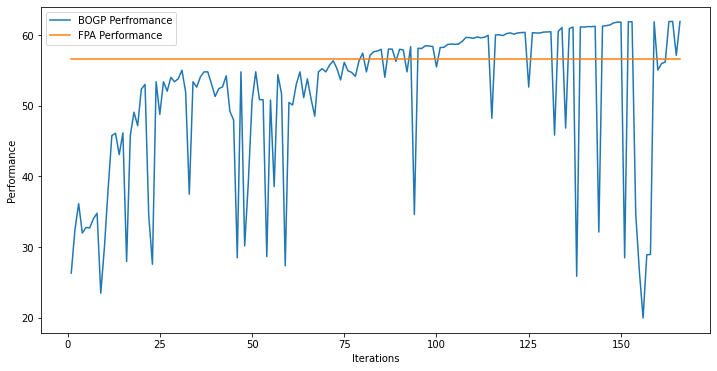

x_next is [ 25.03593018  29.99963433  29.99979006  15.81505579  29.99991295
  20.1109843   29.99996684  26.93974698  29.9999736  -24.4327649
  24.65843991  29.99999532  29.99995973  27.18940878  29.99994135
  19.8230768  -16.39672704  20.93678324  20.91341012  23.2100794 ]
f()=61.936248, actual=61.923
165


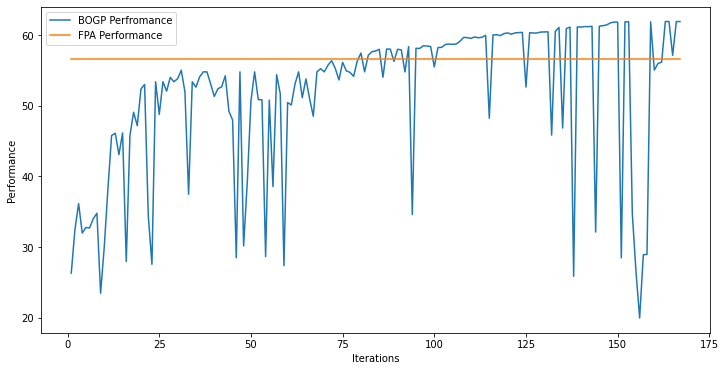

x_next is [ 25.90926448  29.99999997  29.99999997  16.21845048  29.9999861
  20.23400446  30.          26.45717571  29.99999988 -24.14212193
  24.39278564  29.99999993  29.99999999  27.12111999  29.99999989
  19.97236249 -15.68292394  21.24374733  20.7903479   23.02583874]
f()=61.969323, actual=62.028
166


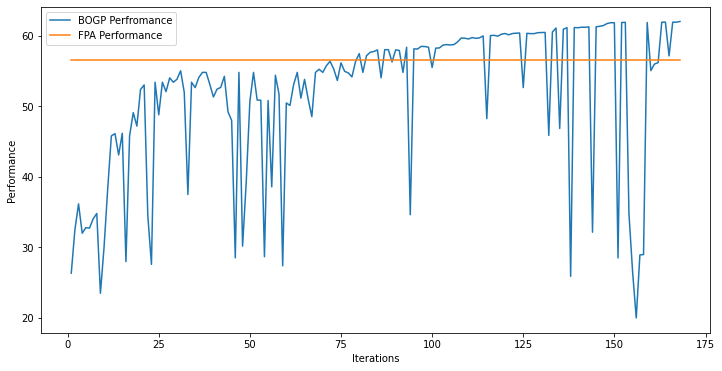

x_next is [ 26.5280014   29.99999994  29.99999999  15.37821505  29.99992664
  20.73521376  29.99999999  25.27333229  29.99999993 -24.34587846
  23.1666347   29.99999996  30.          26.98227654  29.99999995
  19.80404857 -15.18193656  21.58815159  20.70557815  22.92321525]
f()=62.108319, actual=62.221
167


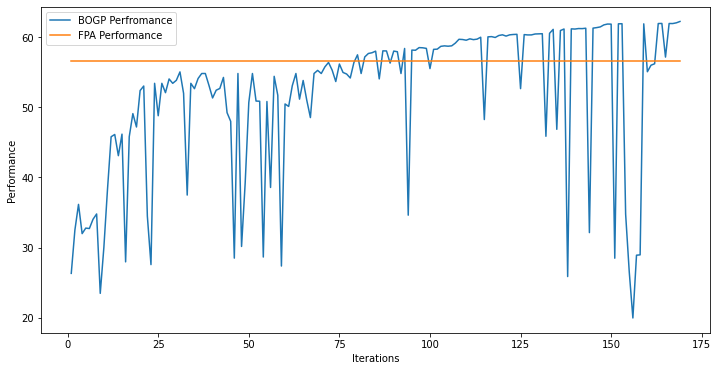

x_next is [ 26.81824069  29.9994609   29.99911281  14.18978363  29.99841887
  21.69154527  29.9997266   24.01360683  29.9940448  -24.97627808
  22.23312414  29.99816792  29.99942082  26.82284025  29.99720499
  19.17906026 -15.02111286  21.5249898   20.30957821  22.61985222]
f()=62.291543, actual=62.259
168


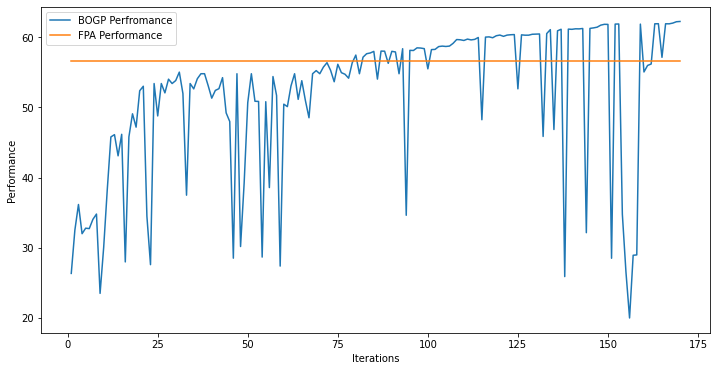

x_next is [ 26.81486198  29.99999987  29.99999987  14.58172977  29.99999988
  21.34170301  30.          24.554791    29.99999987 -24.75930252
  22.52329602  29.99999987  29.99999988  27.00387438  29.99999988
  19.4672975  -15.21040248  21.79286343  20.58627807  22.79024458]
f()=62.265490, actual=62.280
169


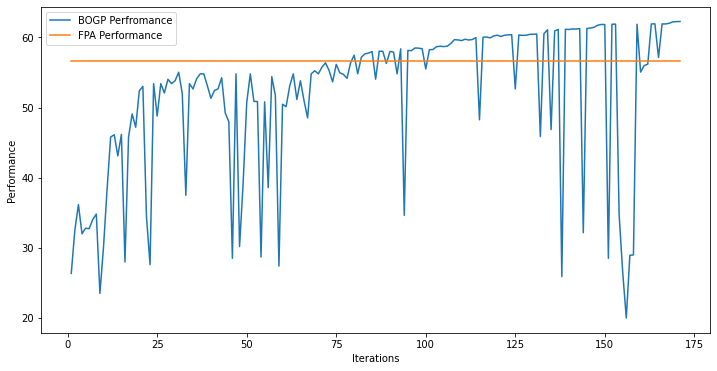

x_next is [ 26.87276901  29.99999997  29.99999989  14.45862884  29.99999984
  21.38131153  29.99999999  24.36219824  29.99987068 -24.74162851
  22.41395029  29.99999993  29.99999995  27.10408673  29.99999986
  19.51781625 -15.35703012  22.17034719  20.61188645  22.80528226]
f()=62.284269, actual=62.308
170


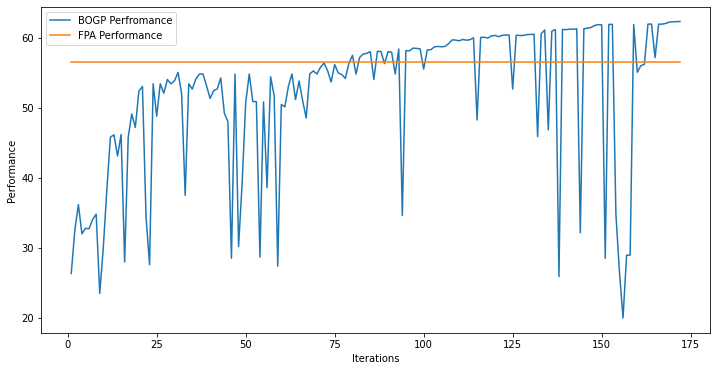

x_next is [ 29.99409786  29.99521517  29.99949553  29.99015431  29.99834436
  29.99805075  29.9943793   29.99712772  29.99556058 -30.99317559
  29.99031955  29.99950432  29.99866328  29.98814959  29.99971068
  29.99881884 -30.99604361  29.99955424  29.99763622  29.99405503]
f()=51.863167, actual=54.808
171


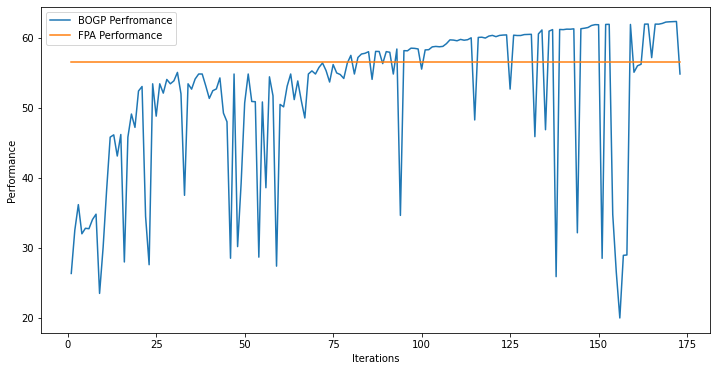

x_next is [ 26.77114834  29.9987318   29.9988777   13.95685625  29.99768012
  21.1012248   30.          23.68688732  29.99895352 -24.44639357
  22.24876107  29.99999437  30.          27.34349361  29.99990245
  19.59426061 -15.41488294  23.1319831   20.25092061  22.75793538]
f()=62.347416, actual=62.347
172


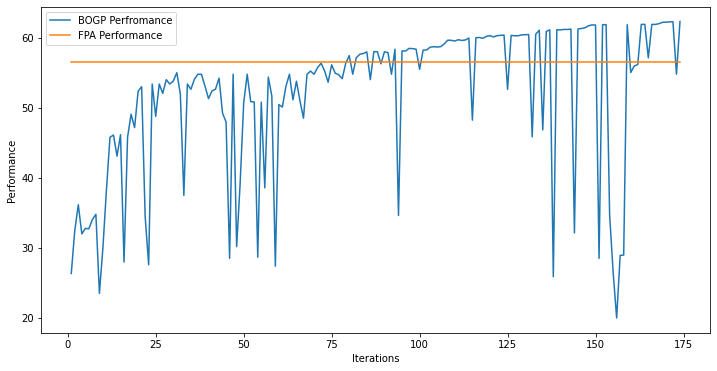

x_next is [ 26.71089689  29.99286744  29.99999998  13.93556225  29.99889772
  21.04425627  29.99971433  23.50632044  29.9977942  -24.4433615
  22.14179633  29.99657864  29.99910024  27.12688289  29.98608471
  19.48172126 -15.67841555  23.36639291  20.20666913  22.79088081]
f()=62.345872, actual=62.342
173


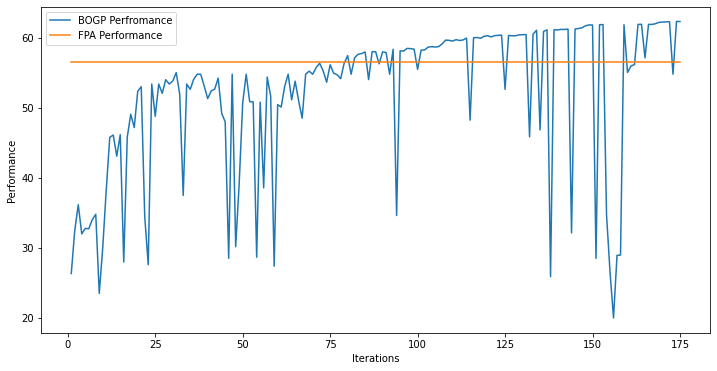

x_next is [ 26.72875376  30.          29.99999979  14.08633473  29.99999995
  21.16147383  29.99999995  23.68082549  29.99999983 -24.51630481
  22.46580678  29.99999995  29.99999983  27.37152612  30.
  19.71484112 -15.353571    23.28928202  20.38470737  22.72224705]
f()=62.347289, actual=62.346
174


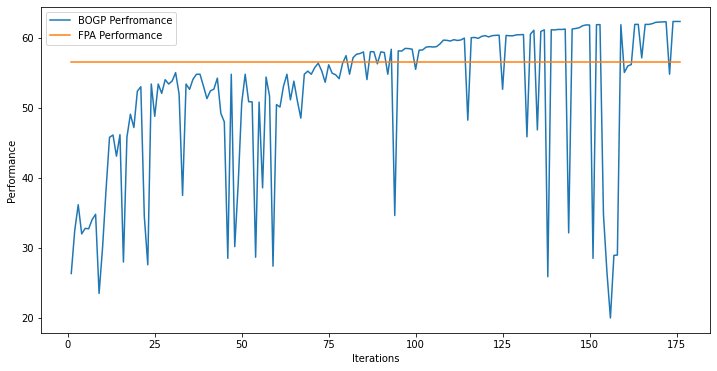

x_next is [ 26.80302092  29.99976832  29.99903741  13.88487424  29.99720773
  21.04689303  29.99939986  23.69229276  29.99971753 -24.42214846
  22.30901933  29.99556723  29.99931546  27.29020464  29.99570248
  19.60640056 -15.46798259  23.23024955  20.26977319  22.72369173]
f()=62.347136, actual=62.341
175


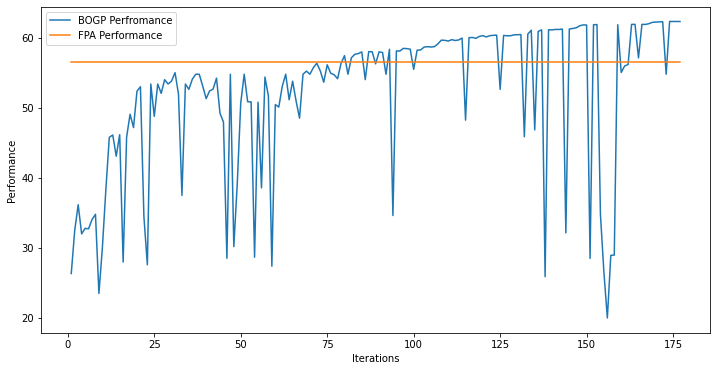

x_next is [ 26.34512838  29.99621709  29.99894887  14.46348771  29.99229923
  21.36965601  29.99884538  23.60587855  29.99617176 -24.61803322
  21.68390666  29.99881934  29.99327693  27.63778602  29.99598061
  19.52658816 -15.3740712   23.29548582  20.08581007  23.05172435]
f()=62.364229, actual=62.383
176


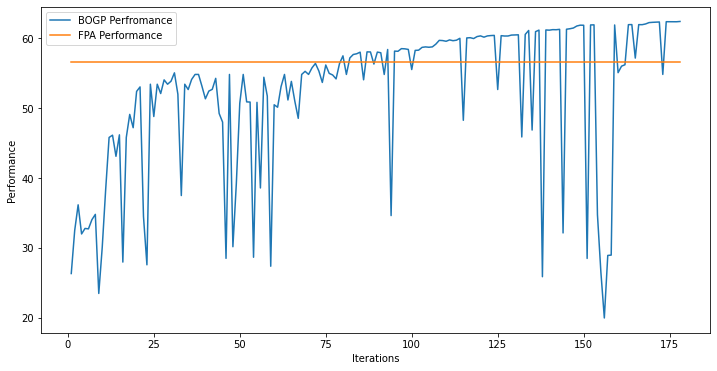

x_next is [ 26.13494612  30.          30.          14.39523521  30.
  21.51720077  30.          23.85121902  29.98936398 -24.81135253
  21.31905707  29.99592116  29.99999987  27.75854594  29.99334505
  19.50796087 -15.15727605  23.6828157   19.92851909  23.04989712]
f()=62.393200, actual=62.390
177


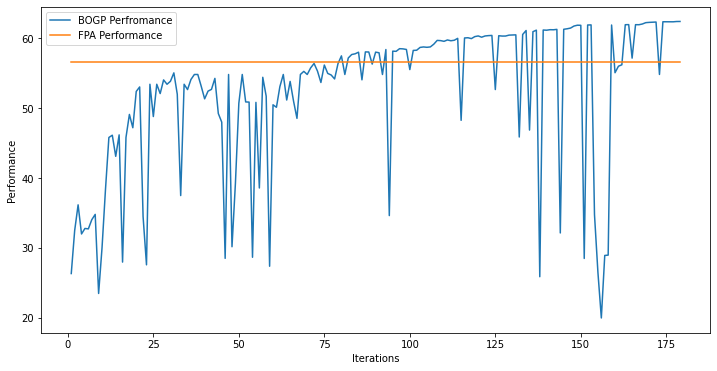

x_next is [ 25.69257757   6.95627251 -26.68393151 -10.78741702  -6.25665089
 -29.81574155   9.43351375 -28.84937071   2.52606269  12.31550056
   3.64136609   6.62747929  13.76828865 -16.17510759  26.70240209
  24.06570219 -20.04184987 -13.45488255  21.04112132 -19.84687154]
f()=52.231583, actual=29.229
178


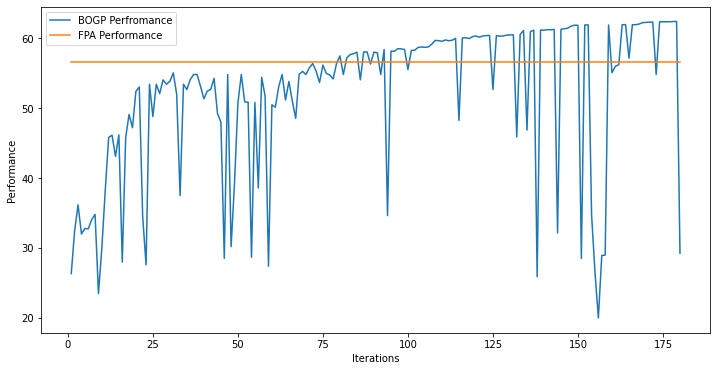

x_next is [ 26.15002397  29.99799195  29.99753114  14.43225806  29.99897002
  21.40857025  29.99816211  23.7304762   29.99659243 -24.73174316
  21.46020308  29.99832359  29.99745344  27.68967848  29.99638637
  19.57192441 -15.26585318  23.55206237  19.81625892  23.08786637]
f()=62.388982, actual=62.382
179


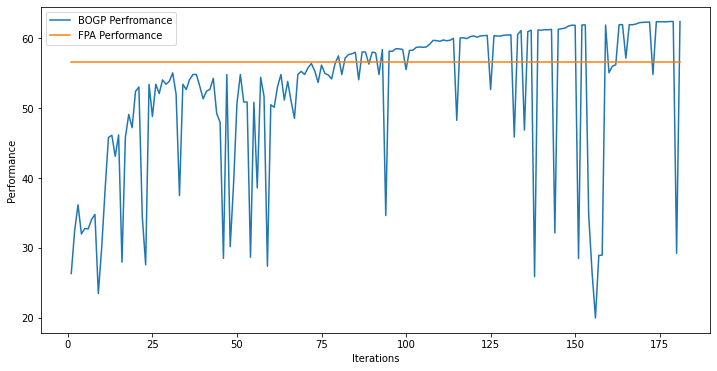

x_next is [ 26.2128621   29.99999841  29.99999996  14.34672753  29.99954856
  21.45667512  29.99999895  23.5993132   29.99175824 -24.71779194
  20.94239539  29.99976246  29.99270772  27.97149075  29.98561401
  19.01257383 -14.99475669  23.773124    20.56758073  22.78680206]
f()=62.405510, actual=62.415
180


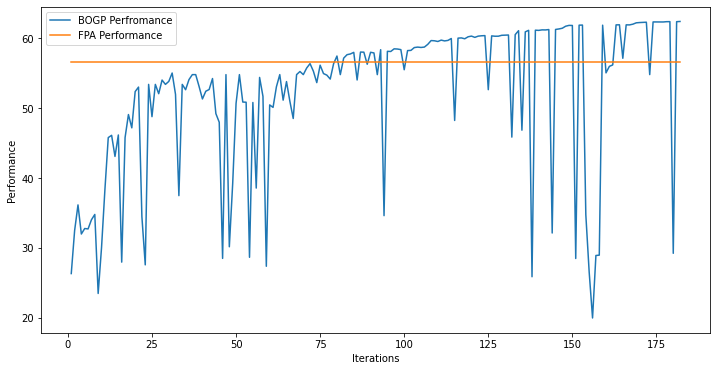

x_next is [ 26.17346689  29.99999997  29.99999999  14.29564937  29.99999998
  21.34135929  30.          23.46174998  29.99999996 -24.71957499
  20.76044307  29.99999998  29.99999998  28.02112436  29.99999994
  18.82558234 -14.94742272  23.83283875  20.67487503  22.7004902 ]
f()=62.418168, actual=62.419
181


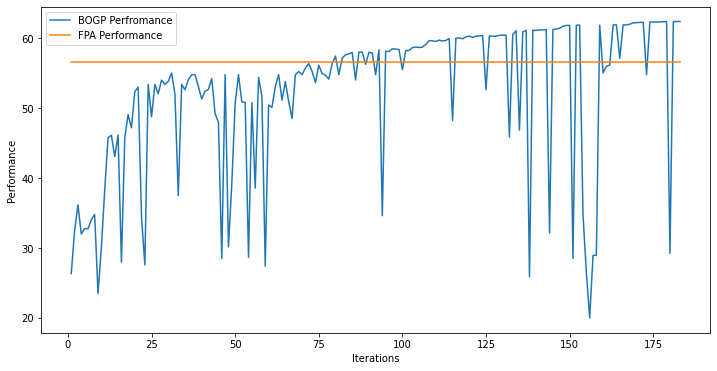

x_next is [ 29.99994819  29.99977633  29.99938657 -30.99968799  29.9999621
  29.99957127  29.9999622   29.99981754 -30.99966054 -30.99990655
 -30.9998767   29.99995108  29.99984489  29.99993654 -30.99963507
 -30.99980333  29.99938978  29.99994308  29.99929789  29.99904283]
f()=65.010047, actual=52.521
182


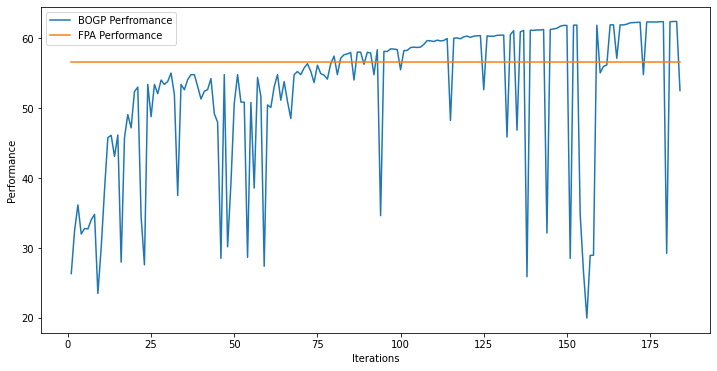

x_next is [ 29.97841081  29.88184303  29.86990829  29.98578581  29.87992769
  29.93094988  29.8708775   29.93734433  29.99519763 -30.9140428
  29.93336493  29.88521422  29.97955673  29.85934668  29.94989487
  29.78201573 -30.97605532  29.91384432  29.98553389  29.85719727]
f()=52.273865, actual=54.713
183


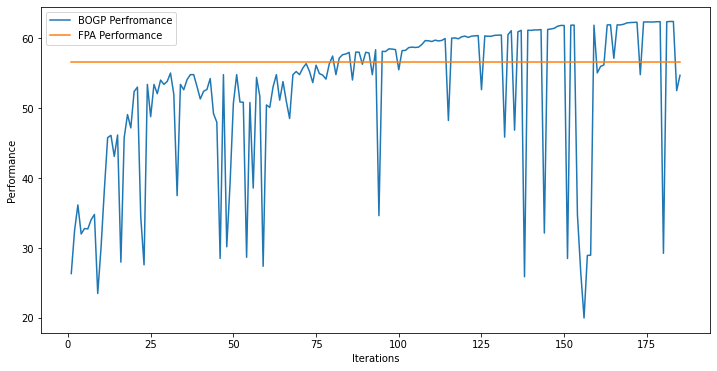

x_next is [ 26.25579531  29.99990133  29.99956066  14.28454944  29.99957337
  21.25958989  29.9997274   23.44736514  29.99667023 -24.69734643
  20.74670017  29.99893506  29.99880333  28.01710804  29.99801034
  18.72057966 -14.94150955  23.88094987  20.6611118   22.75919551]
f()=62.418223, actual=62.412
184


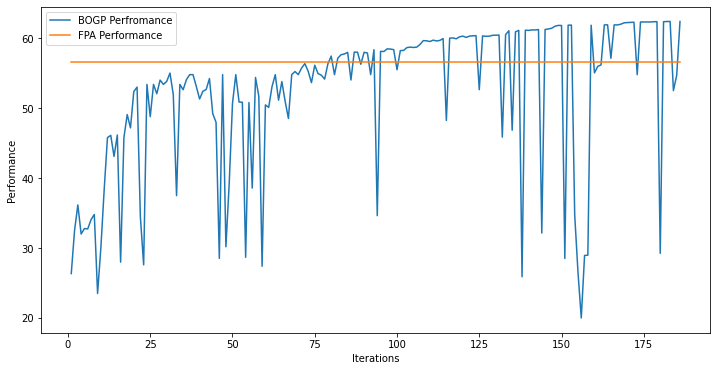

x_next is [-25.735682    19.5097504   26.96580153 -18.84547234 -20.45154707
   9.16602642  -9.94238277  26.51184103 -19.98723521 -16.10799225
 -13.17346311 -15.67287429   1.30724413 -23.62624806  -2.41474729
  -6.43811938  18.57775242  26.32784432  25.38173613 -14.82801253]
f()=52.341565, actual=25.188
185


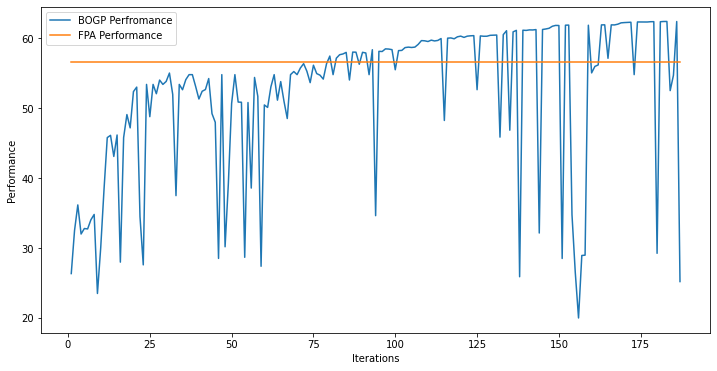

x_next is [ 25.70309117  29.99999995  29.99999992  14.14624983  29.99999944
  21.46962649  29.99999998  23.29474056  29.99999953 -24.71957675
  20.46836741  29.99999981  29.9999999   28.04738087  29.99999984
  19.18782401 -15.1596978   23.67687895  20.8803815   22.21322268]
f()=62.436470, actual=62.425
186


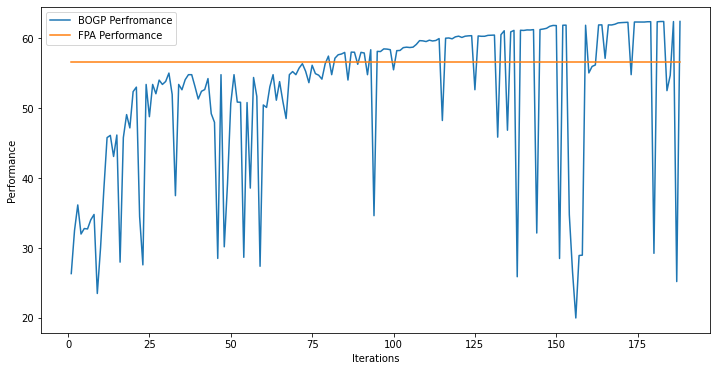

x_next is [ 25.78736122  29.99999997  29.9999999   14.25758873  29.99982385
  21.48208282  29.99999999  23.38659069  29.99986924 -24.81933128
  20.69776233  29.99999966  29.9999958   28.03625994  29.99994381
  19.05043121 -14.96835578  23.69265646  20.8047108   22.40083427]
f()=62.428558, actual=62.427
187


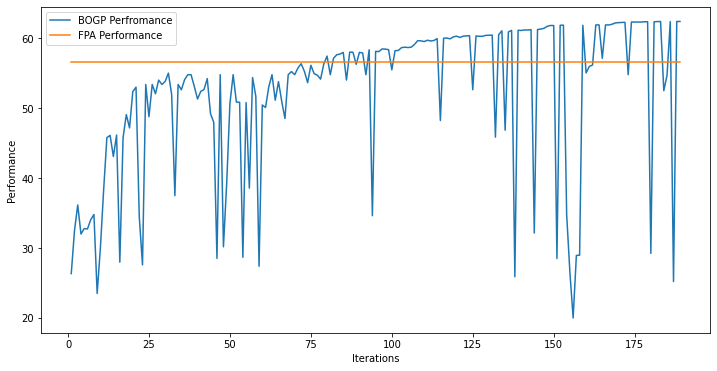

x_next is [ 25.90691236  29.99968302  29.99692536  14.36533179  29.9979184
  21.451534    29.99987929  23.42585205  29.98462494 -24.81266413
  20.62639752  29.99873726  29.99558564  27.98398665  29.99818602
  19.11164395 -15.07250319  23.63305011  20.79547523  22.39285025]
f()=62.425492, actual=62.427
188


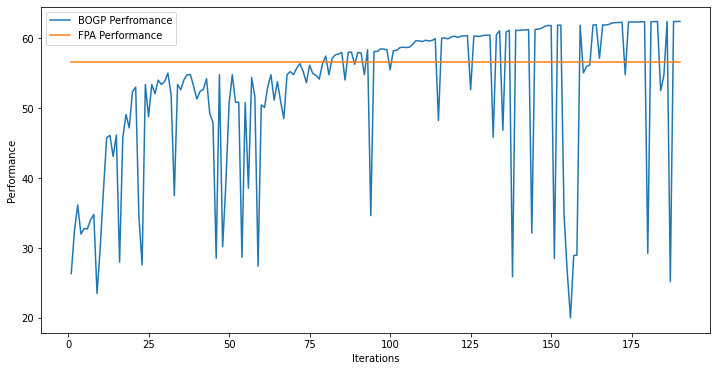

x_next is [ 25.88924975  29.99349908  29.99746616  13.96235952  29.96989289
  21.07220666  29.99999999  23.47039823  29.98085746 -25.16952716
  20.61248836  29.99999998  30.          27.9115301   29.99999996
  19.25699514 -14.68792298  23.36495245  20.9215694   22.54283571]
f()=62.407898, actual=62.415
189


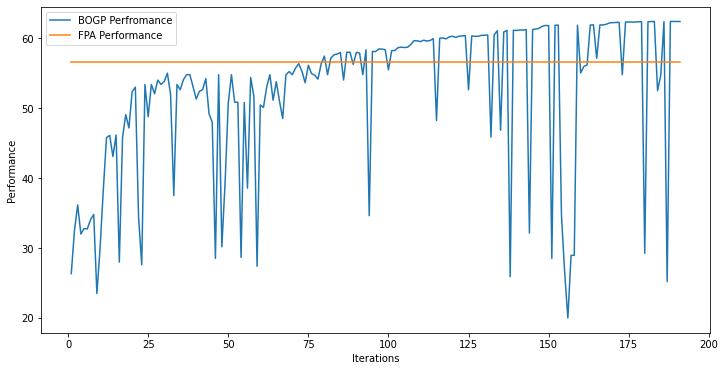

x_next is [ 25.9483233   29.99984701  29.99999989  14.34063082  29.9999309
  21.37207318  29.99999996  23.41038447  29.99979451 -24.87753695
  20.57954215  29.99997659  29.99999179  27.96512459  29.99971685
  19.18588663 -14.99228785  23.63943863  20.82105954  22.40004096]
f()=62.429264, actual=62.426
190


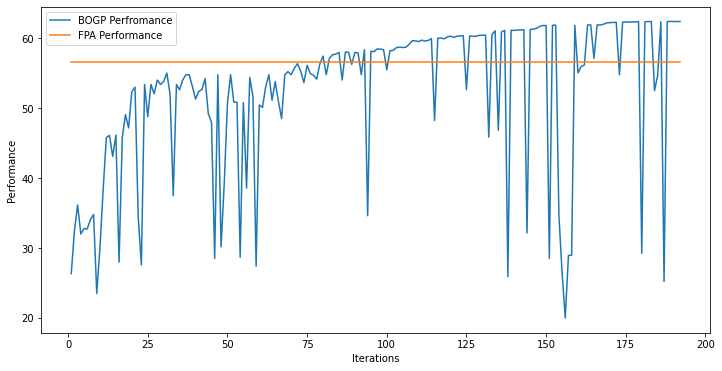

x_next is [ 25.78286916  30.          30.          14.1850491   30.
  21.38164774  30.          23.47788959  29.87155526 -24.59855471
  20.61193578  30.          30.          27.86335058  29.99989906
  19.04760549 -15.04172367  23.49103406  20.80514549  22.47513536]
f()=62.431170, actual=62.414
191


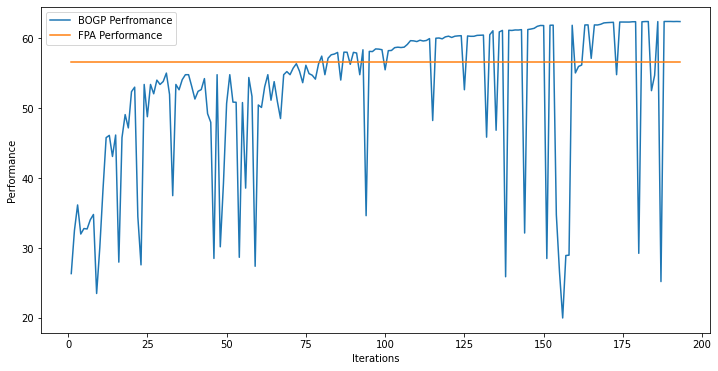

x_next is [ 25.94825556  29.99999996  29.99999986  14.15282236  29.99973476
  21.443829    29.99999999  23.41673332  29.99985716 -25.40270341
  20.61121844  29.99999991  29.99999991  28.42396337  29.99999994
  18.89948058 -15.44175204  23.58580629  20.72567212  22.23514917]
f()=62.444287, actual=62.432
192


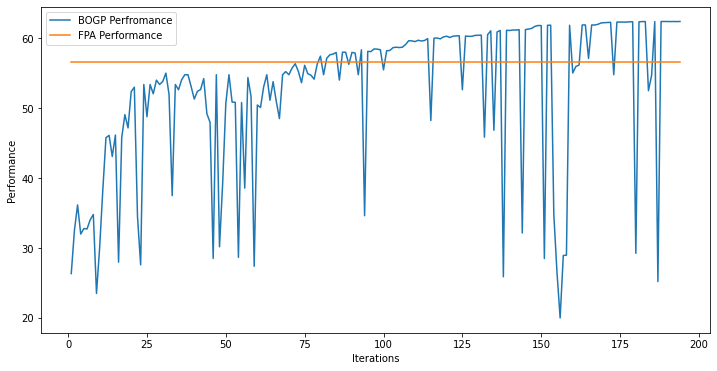

x_next is [ 14.17563203 -17.43273536   2.48210288 -19.90898196 -17.39120995
  -0.16357102 -23.71945874 -20.93144732  -5.41091203  -1.9985344
 -24.84187241 -22.40172078  10.72776412  12.29686248  -5.25954403
  12.20139738   4.36885142  21.86305468  22.25961182  20.56685888]
f()=52.565158, actual=33.186
193


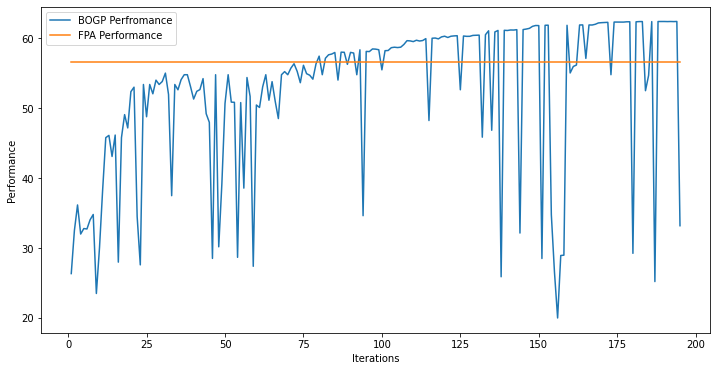

x_next is [ 30.          30.          30.         -31.          30.
 -31.          30.          30.          30.         -31.
  30.          30.          30.          30.          30.
 -31.          30.          30.          23.99725952  30.        ]
f()=66.820977, actual=52.050
194


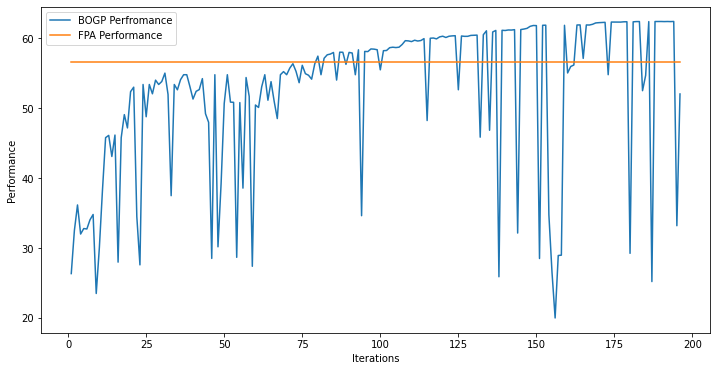

x_next is [ 25.95689066  29.99956178  29.99996059  14.24457416  29.99466337
  21.54023552  29.99949738  23.43598615  29.99023264 -25.10924023
  20.64175855  29.99721906  29.99778238  28.32029753  29.99232549
  18.97966891 -15.32620118  23.50818865  20.73351948  22.25940023]
f()=62.432814, actual=62.432
195


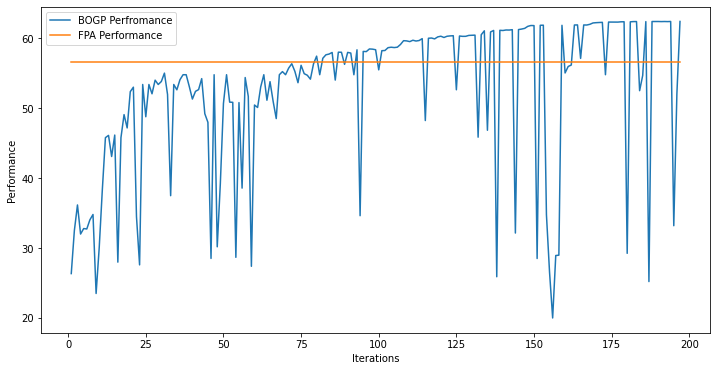

x_next is [ 25.79809784  30.          29.99999999  14.31601191  29.9999996
  21.56262387  30.          23.44192078  29.99999979 -25.05470402
  20.60346334  30.          29.99999999  28.19656061  29.99999999
  19.096196   -15.42301016  23.45586097  20.80130545  22.36379481]
f()=62.433305, actual=62.431
196


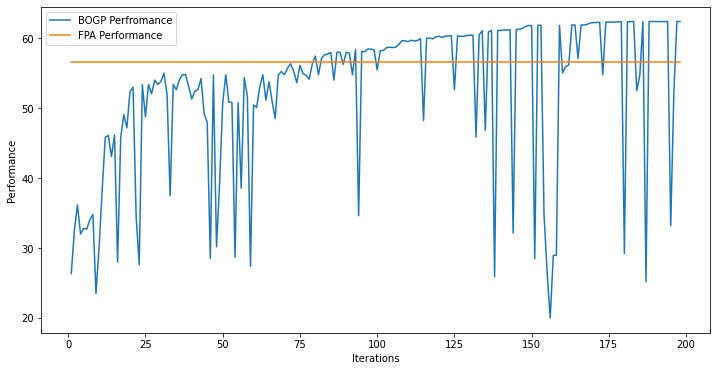

x_next is [ 25.99613229  29.9987064   29.9959911   14.29564755  29.99459076
  21.46920349  29.99995492  23.45054902  29.99624336 -25.05255757
  20.71688655  29.99428969  29.99568284  28.23344624  29.99370869
  19.02551683 -15.32901619  23.64602583  20.68690439  22.05477402]
f()=62.432810, actual=62.432
197


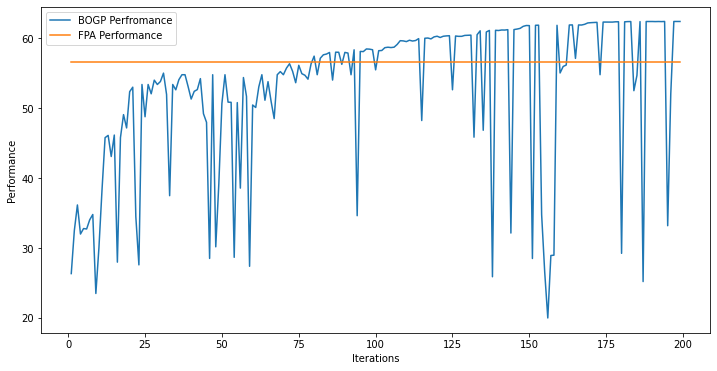

x_next is [ 26.01020603  29.99981     29.99992525  14.24669508  29.9999983
  21.50483404  29.99999835  23.4346382   29.99981628 -25.11189268
  20.62383139  29.99943991  29.99992839  28.25482489  29.99983398
  18.90465964 -15.21522752  23.60235782  20.71489797  22.1768402 ]
f()=62.434887, actual=62.435
198


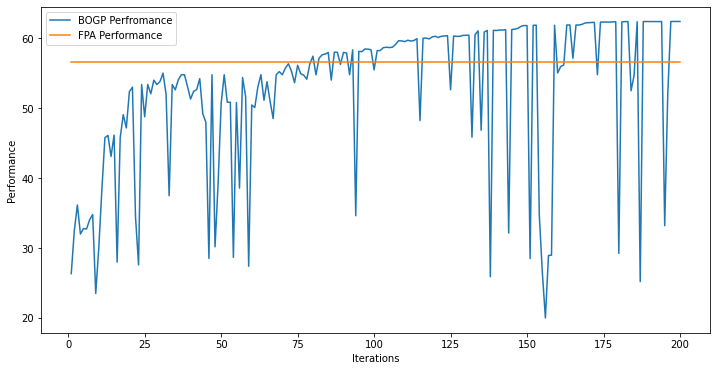

x_next is [ 29.99976755  29.99994837  29.99987025  29.99998639  29.9995674
  29.99990966  29.99998279  29.99998606  29.99992728 -30.99984092
  29.99977116  29.99954092  29.99996243  29.99961398  29.99991465
  29.99972796 -30.99980114  29.99990524  29.99979876  29.99982103]
f()=52.663022, actual=54.806
199


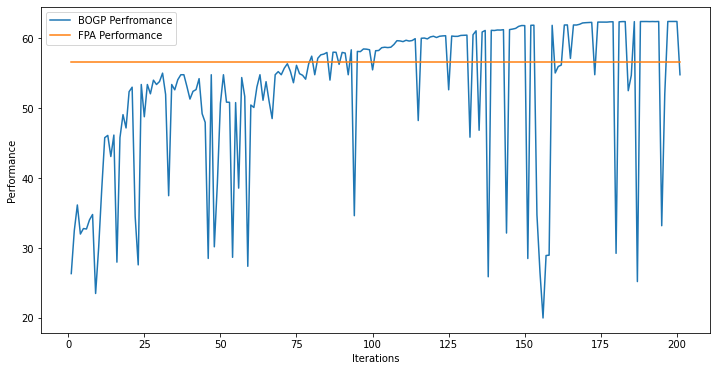

In [15]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective_FPA(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_P=30_3.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_P=30_3.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_P=30_3.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective_FPA(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


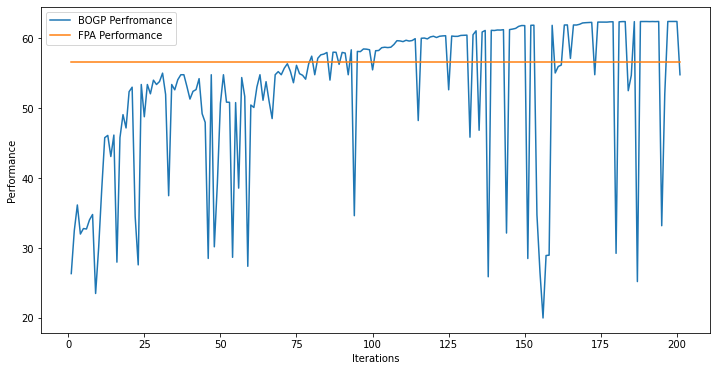

P_max = 30.000, Optimal_SE = 62.435
P_max = 30.000, Optimal_SE_FPA = 56.571


In [16]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 
ix = 0
ix = argmax(y)
print('P_max = %.3f, Optimal_SE = %.3f' % (P_max, y[ix]))

ix_FPA=0
ix_FPA=argmax(y_FPA)
print('P_max = %.3f, Optimal_SE_FPA = %.3f' % (P_max, y_FPA[ix_FPA]))

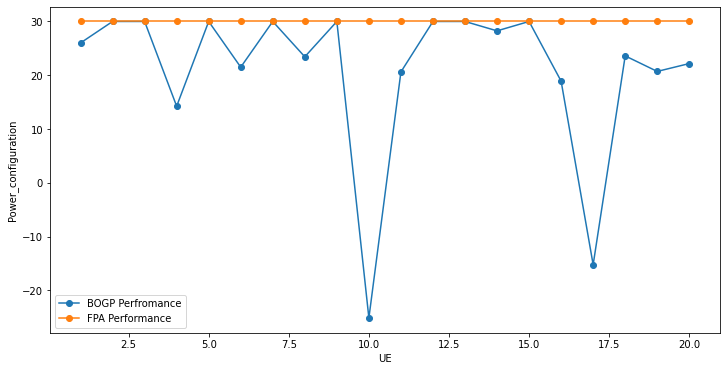

Power_configuration_BOGP is [ 26.01020603  29.99981     29.99992525  14.24669508  29.9999983
  21.50483404  29.99999835  23.4346382   29.99981628 -25.11189268
  20.62383139  29.99943991  29.99992839  28.25482489  29.99983398
  18.90465964 -15.21522752  23.60235782  20.71489797  22.1768402 ]


In [17]:
X_FPA = P_max * np.ones([1,var], dtype = "float").reshape((int)(20), 1)
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("UE")
pyplot.ylabel("Power_configuration")
pyplot.plot(np.arange(1,21),X[ix][:], '-o')
pyplot.plot(np.arange(1,21),X_FPA[:], '-o')
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show()
print("Power_configuration_BOGP is", X[ix])

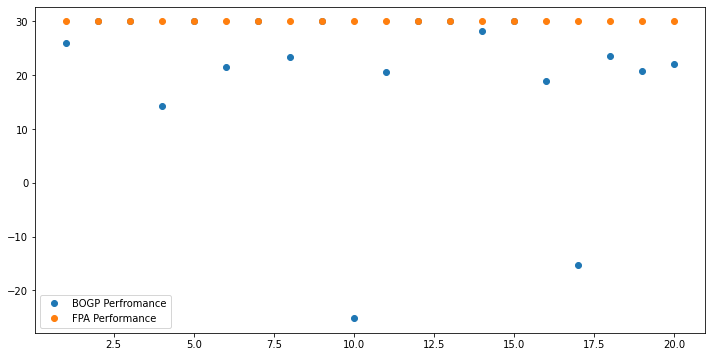

Power_configuration_BOGP is [ 26.01020603  29.99981     29.99992525  14.24669508  29.9999983
  21.50483404  29.99999835  23.4346382   29.99981628 -25.11189268
  20.62383139  29.99943991  29.99992839  28.25482489  29.99983398
  18.90465964 -15.21522752  23.60235782  20.71489797  22.1768402 ]


In [18]:
import matplotlib.pyplot as plt
X_FPA=np.linspace(P_max,P_max,20)
plt.figure(figsize = (12, 6)) 
plt.plot(np.arange(1,21),X[ix][:], 'o')
plt.plot(np.arange(1,21),X_FPA[:], 'o')
plt.legend(["BOGP Perfromance","FPA Performance"])
plt.show()
print("Power_configuration_BOGP is", X[ix])